In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for specific humidity
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for specific humidity
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for specific humidity
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (specific_humidity) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 12
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

# Swap columns 'temperatures' and 'specific_humidity' directly
df['A'] = df['temperatures']
df['temperatures'] = df['specific_humidity']
df['specific_humidity'] = df['A']
df = df.drop(columns=['A'])
# Rename columns
df = df.rename(columns={'temperatures': 'specific_humidity', 'specific_humidity': 'temperatures'})

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

n_vars = df_trimmed.shape[1]-1

X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['specific_humidity'].iloc[j])
    y.append(add_to_y)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df) 
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['specific_humidity']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['specific_humidity']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 12
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  specific_humidity          slp  vapor_pressure  \
0      2006-01-31     6501           5.386935  1018.534543        8.674922   
1      2006-02-28     6501           4.299929  1021.230347        6.942276   
2      2006-03-31     6501           6.505135  1018.968548       10.468176   
3      2006-04-30     6501          10.211263  1014.686944       16.358802   
4      2006-05-31     6501          11.737971  1014.236828       18.798749   
...           ...      ...                ...          ...             ...   
24057  2024-07-31     9858          15.211417  1013.969355       23.769169   
24058  2024-08-31     9858          15.149811  1015.112097       23.699154   
24059  2024-09-30     9858          10.720199  1014.393750       16.790240   
24060  2024-10-31     9858           6.989922  1018.230376       1

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

12
179
(84, 2160)
(11, 2160)


In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit a CNN-LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    filters = trial.suggest_categorical('filters', [256, 512, 1024]) # Used for CNN-LSTM model
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM Only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "CNN-LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100

# Optimize and fit the model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_SH_S12.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

[I 2025-05-28 01:37:27,649] A new study created in memory with name: no-name-5432c2fa-909f-42dd-8c4e-1596d4f9888f
[I 2025-05-28 01:43:02,714] Trial 0 finished with value: 0.08892428278923034 and parameters: {'lr': 0.003390702898325025, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4619849348582289}. Best is trial 0 with value: 0.08892428278923034.


Cross Validation Accuracies:
[0.06312906742095947, 0.10353266447782516, 0.1094118133187294, 0.08006379753351212, 0.08848407119512558]
Mean Cross Validation Accuracy:
0.08892428278923034
Standard Deviation of Cross Validation Accuracy:
0.01659661919709367


[I 2025-05-28 01:48:48,197] Trial 1 finished with value: 0.06509478017687798 and parameters: {'lr': 0.023817509683132936, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.48580582484007573}. Best is trial 1 with value: 0.06509478017687798.


Cross Validation Accuracies:
[0.05939812958240509, 0.05485783517360687, 0.074837327003479, 0.07862600684165955, 0.057754602283239365]
Mean Cross Validation Accuracy:
0.06509478017687798
Standard Deviation of Cross Validation Accuracy:
0.009686448226548017


[I 2025-05-28 01:55:33,592] Trial 2 finished with value: 0.0967904195189476 and parameters: {'lr': 0.11076073322959583, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.23396479531639236}. Best is trial 1 with value: 0.06509478017687798.


Cross Validation Accuracies:
[0.08912167698144913, 0.07896606624126434, 0.10922005027532578, 0.11887461692094803, 0.08776968717575073]
Mean Cross Validation Accuracy:
0.0967904195189476
Standard Deviation of Cross Validation Accuracy:
0.01483305962714449


[I 2025-05-28 02:01:58,962] Trial 3 finished with value: 0.06963694244623184 and parameters: {'lr': 0.022679073188721147, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.28584997082443253}. Best is trial 1 with value: 0.06509478017687798.


Cross Validation Accuracies:
[0.0620085634291172, 0.05687295272946358, 0.08951958268880844, 0.08195651322603226, 0.05782710015773773]
Mean Cross Validation Accuracy:
0.06963694244623184
Standard Deviation of Cross Validation Accuracy:
0.013473493845412654


[I 2025-05-28 02:07:15,868] Trial 4 finished with value: 4.495846843719482 and parameters: {'lr': 0.5352204342906287, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.48294399922343245}. Best is trial 1 with value: 0.06509478017687798.


Cross Validation Accuracies:
[5.747849941253662, 3.955516815185547, 3.225038766860962, 3.890197515487671, 5.66063117980957]
Mean Cross Validation Accuracy:
4.495846843719482
Standard Deviation of Cross Validation Accuracy:
1.0196033662721977


[I 2025-05-28 02:12:54,573] Trial 5 finished with value: 0.07223159149289131 and parameters: {'lr': 0.2596921703046029, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.15563482899422773}. Best is trial 1 with value: 0.06509478017687798.


Cross Validation Accuracies:
[0.05329164117574692, 0.05939031019806862, 0.08035504072904587, 0.09323295950889587, 0.07488800585269928]
Mean Cross Validation Accuracy:
0.07223159149289131
Standard Deviation of Cross Validation Accuracy:
0.01440641972591174


[I 2025-05-28 02:18:47,845] Trial 6 finished with value: 0.06604915261268615 and parameters: {'lr': 0.00299887404238607, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.4089604721314182}. Best is trial 1 with value: 0.06509478017687798.


Cross Validation Accuracies:
[0.06034761667251587, 0.06422878056764603, 0.0742051973938942, 0.07712280750274658, 0.05434136092662811]
Mean Cross Validation Accuracy:
0.06604915261268615
Standard Deviation of Cross Validation Accuracy:
0.008509295525726875


[I 2025-05-28 02:26:52,238] Trial 7 finished with value: 1.1389548063278199 and parameters: {'lr': 0.0493627175309669, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.11281244207086988}. Best is trial 1 with value: 0.06509478017687798.


Cross Validation Accuracies:
[1.1623724699020386, 1.0612331628799438, 1.188815951347351, 1.2218801975250244, 1.0604722499847412]
Mean Cross Validation Accuracy:
1.1389548063278199
Standard Deviation of Cross Validation Accuracy:
0.06650008536163951


[I 2025-05-28 02:32:17,117] Trial 8 finished with value: 0.06634447947144509 and parameters: {'lr': 0.04603646066190506, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.2016872603364356}. Best is trial 1 with value: 0.06509478017687798.


Cross Validation Accuracies:
[0.05760134756565094, 0.06126519292593002, 0.07587416470050812, 0.08592132478952408, 0.05106036737561226]
Mean Cross Validation Accuracy:
0.06634447947144509
Standard Deviation of Cross Validation Accuracy:
0.012727241359104987


[I 2025-05-28 02:40:22,379] Trial 9 finished with value: 0.07680548056960106 and parameters: {'lr': 0.005275185913264843, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.483931071958413}. Best is trial 1 with value: 0.06509478017687798.


Cross Validation Accuracies:
[0.055063601583242416, 0.07105936855077744, 0.09692841023206711, 0.0842374712228775, 0.07673855125904083]
Mean Cross Validation Accuracy:
0.07680548056960106
Standard Deviation of Cross Validation Accuracy:
0.013898909079448568


[I 2025-05-28 02:45:39,471] Trial 10 finished with value: 0.06348797082901 and parameters: {'lr': 0.011853914601424006, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.36985049422752214}. Best is trial 10 with value: 0.06348797082901.


Cross Validation Accuracies:
[0.05778014659881592, 0.058181051164865494, 0.07279965281486511, 0.07584267109632492, 0.052836332470178604]
Mean Cross Validation Accuracy:
0.06348797082901
Standard Deviation of Cross Validation Accuracy:
0.009094460881137403


[I 2025-05-28 02:51:25,820] Trial 11 finished with value: 0.06465226635336876 and parameters: {'lr': 0.013395211028830319, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3696951274295771}. Best is trial 10 with value: 0.06348797082901.


Cross Validation Accuracies:
[0.05905770882964134, 0.059415530413389206, 0.07204467058181763, 0.07797550410032272, 0.0547679178416729]
Mean Cross Validation Accuracy:
0.06465226635336876
Standard Deviation of Cross Validation Accuracy:
0.008815657967851071


[I 2025-05-28 02:57:13,046] Trial 12 finished with value: 0.06358029842376708 and parameters: {'lr': 0.00721321603490325, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.35720261217041704}. Best is trial 10 with value: 0.06348797082901.


Cross Validation Accuracies:
[0.05790742486715317, 0.05853937566280365, 0.07263661921024323, 0.07654108107089996, 0.05227699130773544]
Mean Cross Validation Accuracy:
0.06358029842376708
Standard Deviation of Cross Validation Accuracy:
0.009331194794284821


[I 2025-05-28 03:03:00,569] Trial 13 finished with value: 0.09078776761889458 and parameters: {'lr': 0.0010554429922179824, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.33959795633937756}. Best is trial 10 with value: 0.06348797082901.


Cross Validation Accuracies:
[0.05693334713578224, 0.19426919519901276, 0.07269245386123657, 0.0769953727722168, 0.05304846912622452]
Mean Cross Validation Accuracy:
0.09078776761889458
Standard Deviation of Cross Validation Accuracy:
0.05252894978310574


[I 2025-05-28 03:09:12,045] Trial 14 finished with value: 0.0644384689629078 and parameters: {'lr': 0.007774436814606523, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.28449859941224276}. Best is trial 10 with value: 0.06348797082901.


Cross Validation Accuracies:
[0.06075647100806236, 0.05798409879207611, 0.07333448529243469, 0.07655297964811325, 0.05356431007385254]
Mean Cross Validation Accuracy:
0.0644384689629078
Standard Deviation of Cross Validation Accuracy:
0.008937156264306825


[I 2025-05-28 03:14:54,931] Trial 15 finished with value: 0.07190302833914756 and parameters: {'lr': 0.0010040720122140873, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.39453787541499424}. Best is trial 10 with value: 0.06348797082901.


Cross Validation Accuracies:
[0.056690752506256104, 0.058225344866514206, 0.07261937111616135, 0.11886418610811234, 0.05311548709869385]
Mean Cross Validation Accuracy:
0.07190302833914756
Standard Deviation of Cross Validation Accuracy:
0.024402162006801984


[I 2025-05-28 03:20:39,999] Trial 16 finished with value: 0.06175231263041496 and parameters: {'lr': 0.010821046613323452, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.3320946406397976}. Best is trial 16 with value: 0.06175231263041496.


Cross Validation Accuracies:
[0.04454268142580986, 0.06284111738204956, 0.07419747859239578, 0.07595839351415634, 0.05122189223766327]
Mean Cross Validation Accuracy:
0.06175231263041496
Standard Deviation of Cross Validation Accuracy:
0.012368844291447998


[I 2025-05-28 03:26:01,554] Trial 17 finished with value: 0.9304845690727234 and parameters: {'lr': 0.11364208372729474, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.3186327925107245}. Best is trial 16 with value: 0.06175231263041496.


Cross Validation Accuracies:
[1.2999699115753174, 0.5875178575515747, 1.0425488948822021, 0.9783092141151428, 0.7440769672393799]
Mean Cross Validation Accuracy:
0.9304845690727234
Standard Deviation of Cross Validation Accuracy:
0.24647068277980436


[I 2025-05-28 03:31:06,070] Trial 18 finished with value: 0.13007366806268691 and parameters: {'lr': 0.015459223562399472, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4154186116421512}. Best is trial 16 with value: 0.06175231263041496.


Cross Validation Accuracies:
[0.12594661116600037, 0.1094549372792244, 0.17655573785305023, 0.11533164232969284, 0.12307941168546677]
Mean Cross Validation Accuracy:
0.13007366806268691
Standard Deviation of Cross Validation Accuracy:
0.023954099501872925


[I 2025-05-28 03:37:45,016] Trial 19 finished with value: 0.5647006809711457 and parameters: {'lr': 0.08482361701385815, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2551032247772353}. Best is trial 16 with value: 0.06175231263041496.


Cross Validation Accuracies:
[0.3520195186138153, 0.423667311668396, 0.9034935235977173, 0.6430758833885193, 0.5012471675872803]
Mean Cross Validation Accuracy:
0.5647006809711457
Standard Deviation of Cross Validation Accuracy:
0.1949734848682069


[I 2025-05-28 03:42:37,776] Trial 20 finished with value: 0.06459267809987068 and parameters: {'lr': 0.0025638435225137156, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.4357756493374383}. Best is trial 16 with value: 0.06175231263041496.


Cross Validation Accuracies:
[0.06084975227713585, 0.05860795080661774, 0.07344149798154831, 0.07795143127441406, 0.05211275815963745]
Mean Cross Validation Accuracy:
0.06459267809987068
Standard Deviation of Cross Validation Accuracy:
0.00961595295205295


[I 2025-05-28 03:48:01,688] Trial 21 finished with value: 0.06312602162361144 and parameters: {'lr': 0.007307856336189432, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.35474700195371345}. Best is trial 16 with value: 0.06175231263041496.


Cross Validation Accuracies:
[0.056911591440439224, 0.05624014511704445, 0.07223845273256302, 0.0770849734544754, 0.053154945373535156]
Mean Cross Validation Accuracy:
0.06312602162361144
Standard Deviation of Cross Validation Accuracy:
0.00962647948402548


[I 2025-05-28 03:54:41,476] Trial 22 finished with value: 0.06422516405582428 and parameters: {'lr': 0.00990726362793696, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.31736356318746606}. Best is trial 16 with value: 0.06175231263041496.


Cross Validation Accuracies:
[0.05842134729027748, 0.06031125411391258, 0.07286139577627182, 0.07697606831789017, 0.05255575478076935]
Mean Cross Validation Accuracy:
0.06422516405582428
Standard Deviation of Cross Validation Accuracy:
0.009190736104793889


[I 2025-05-28 04:00:21,268] Trial 23 finished with value: 0.06274898573756219 and parameters: {'lr': 0.004908137667744354, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.35989015997064977}. Best is trial 16 with value: 0.06175231263041496.


Cross Validation Accuracies:
[0.055426642298698425, 0.05705384910106659, 0.07225210964679718, 0.07654713094234467, 0.05246519669890404]
Mean Cross Validation Accuracy:
0.06274898573756219
Standard Deviation of Cross Validation Accuracy:
0.009721170576254556


[I 2025-05-28 04:06:30,910] Trial 24 finished with value: 0.0642649069428444 and parameters: {'lr': 0.0020525263055030042, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.3357964472690203}. Best is trial 16 with value: 0.06175231263041496.


Cross Validation Accuracies:
[0.05756403133273125, 0.05732643976807594, 0.07377028465270996, 0.07929745316505432, 0.05336632579565048]
Mean Cross Validation Accuracy:
0.0642649069428444
Standard Deviation of Cross Validation Accuracy:
0.010277672723234635


[I 2025-05-28 04:12:09,039] Trial 25 finished with value: 0.06294466480612755 and parameters: {'lr': 0.004630855974264386, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.3824526196450604}. Best is trial 16 with value: 0.06175231263041496.


Cross Validation Accuracies:
[0.05570495128631592, 0.0564059354364872, 0.0729794129729271, 0.0770534798502922, 0.052579544484615326]
Mean Cross Validation Accuracy:
0.06294466480612755
Standard Deviation of Cross Validation Accuracy:
0.010023562097570902


[I 2025-05-28 04:18:33,943] Trial 26 finished with value: 0.06410362273454666 and parameters: {'lr': 0.004197678224591924, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.3848971914994907}. Best is trial 16 with value: 0.06175231263041496.


Cross Validation Accuracies:
[0.0573011077940464, 0.05564963445067406, 0.07632482051849365, 0.07629653066396713, 0.05494602024555206]
Mean Cross Validation Accuracy:
0.06410362273454666
Standard Deviation of Cross Validation Accuracy:
0.009996304215215742


[I 2025-05-28 04:24:50,382] Trial 27 finished with value: 0.2985277086496353 and parameters: {'lr': 0.001442424224584324, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.43076766595150295}. Best is trial 16 with value: 0.06175231263041496.


Cross Validation Accuracies:
[0.2920689582824707, 0.32944414019584656, 0.3266712725162506, 0.24523352086544037, 0.29922065138816833]
Mean Cross Validation Accuracy:
0.2985277086496353
Standard Deviation of Cross Validation Accuracy:
0.030431404844952818


[I 2025-05-28 04:32:46,015] Trial 28 finished with value: 0.06295396313071251 and parameters: {'lr': 0.00513974650623127, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.26581471234955184}. Best is trial 16 with value: 0.06175231263041496.


Cross Validation Accuracies:
[0.05569172278046608, 0.05758043751120567, 0.07246982306241989, 0.07647727429866791, 0.052550558000802994]
Mean Cross Validation Accuracy:
0.06295396313071251
Standard Deviation of Cross Validation Accuracy:
0.009625770472751701


[I 2025-05-28 04:39:04,977] Trial 29 finished with value: 0.059651248157024384 and parameters: {'lr': 0.0021709601784041495, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4525081283901808}. Best is trial 29 with value: 0.059651248157024384.


Cross Validation Accuracies:
[0.05973188951611519, 0.054986272007226944, 0.06080415099859238, 0.07048147171735764, 0.05225245654582977]
Mean Cross Validation Accuracy:
0.059651248157024384
Standard Deviation of Cross Validation Accuracy:
0.006247136146135311


[I 2025-05-28 04:43:56,382] Trial 30 finished with value: 0.04851653128862381 and parameters: {'lr': 0.0017043980937508476, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4537010678753954}. Best is trial 30 with value: 0.04851653128862381.


Cross Validation Accuracies:
[0.04020262509584427, 0.053272128105163574, 0.061058033257722855, 0.045168984681367874, 0.04288088530302048]
Mean Cross Validation Accuracy:
0.04851653128862381
Standard Deviation of Cross Validation Accuracy:
0.007641892211586526


[I 2025-05-28 04:47:35,535] Trial 31 finished with value: 0.05097672417759895 and parameters: {'lr': 0.0018758960670217147, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4373281678583066}. Best is trial 30 with value: 0.04851653128862381.


Cross Validation Accuracies:
[0.04790783300995827, 0.05392095074057579, 0.05961085855960846, 0.050710953772068024, 0.042733024805784225]
Mean Cross Validation Accuracy:
0.05097672417759895
Standard Deviation of Cross Validation Accuracy:
0.0056685810009362075


[I 2025-05-28 04:51:15,460] Trial 32 finished with value: 0.05158238410949707 and parameters: {'lr': 0.0017397732628619683, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4602820275539568}. Best is trial 30 with value: 0.04851653128862381.


Cross Validation Accuracies:
[0.039790138602256775, 0.0467093363404274, 0.06072579324245453, 0.06478450447320938, 0.04590214788913727]
Mean Cross Validation Accuracy:
0.05158238410949707
Standard Deviation of Cross Validation Accuracy:
0.009518052793007069


[I 2025-05-28 04:55:18,954] Trial 33 finished with value: 0.05180846154689789 and parameters: {'lr': 0.0017536801582467853, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4534373090785384}. Best is trial 30 with value: 0.04851653128862381.


Cross Validation Accuracies:
[0.04585558548569679, 0.04905160889029503, 0.05869871750473976, 0.06123680993914604, 0.044199585914611816]
Mean Cross Validation Accuracy:
0.05180846154689789
Standard Deviation of Cross Validation Accuracy:
0.006889141295227147


[I 2025-05-28 04:59:23,425] Trial 34 finished with value: 0.05011291429400444 and parameters: {'lr': 0.001627935411192085, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4981394635234752}. Best is trial 30 with value: 0.04851653128862381.


Cross Validation Accuracies:
[0.04485774412751198, 0.048907555639743805, 0.059045806527137756, 0.053350064903497696, 0.044403400272130966]
Mean Cross Validation Accuracy:
0.05011291429400444
Standard Deviation of Cross Validation Accuracy:
0.005512603033912007


[I 2025-05-28 05:03:33,603] Trial 35 finished with value: 0.06368186920881272 and parameters: {'lr': 0.0014932816766650544, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4996211684179317}. Best is trial 30 with value: 0.04851653128862381.


Cross Validation Accuracies:
[0.0550554133951664, 0.056414976716041565, 0.07549647241830826, 0.076072096824646, 0.05537038668990135]
Mean Cross Validation Accuracy:
0.06368186920881272
Standard Deviation of Cross Validation Accuracy:
0.009893500871162192


[I 2025-05-28 05:07:50,712] Trial 36 finished with value: 0.06440485417842864 and parameters: {'lr': 0.0033278916886334362, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4629917345800225}. Best is trial 30 with value: 0.04851653128862381.


Cross Validation Accuracies:
[0.058201611042022705, 0.05987333878874779, 0.07313276827335358, 0.07679980993270874, 0.05401674285531044]
Mean Cross Validation Accuracy:
0.06440485417842864
Standard Deviation of Cross Validation Accuracy:
0.008907739630194957


[I 2025-05-28 05:11:34,475] Trial 37 finished with value: 0.058156685531139375 and parameters: {'lr': 0.002889153836675409, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.47391141589700403}. Best is trial 30 with value: 0.04851653128862381.


Cross Validation Accuracies:
[0.046266987919807434, 0.05874618515372276, 0.07009013742208481, 0.07057750970125198, 0.04510260745882988]
Mean Cross Validation Accuracy:
0.058156685531139375
Standard Deviation of Cross Validation Accuracy:
0.011034541408778643


[I 2025-05-28 05:14:58,798] Trial 38 finished with value: 0.050209034234285355 and parameters: {'lr': 0.001217603751160688, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4993647248553}. Best is trial 30 with value: 0.04851653128862381.


Cross Validation Accuracies:
[0.04053521901369095, 0.04799986258149147, 0.05972500890493393, 0.05639283359050751, 0.04639224708080292]
Mean Cross Validation Accuracy:
0.050209034234285355
Standard Deviation of Cross Validation Accuracy:
0.006954482768677184


[I 2025-05-28 05:18:11,068] Trial 39 finished with value: 0.07685676291584968 and parameters: {'lr': 0.6557198803671892, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.43576167037961905}. Best is trial 30 with value: 0.04851653128862381.


Cross Validation Accuracies:
[0.06944265961647034, 0.06855684518814087, 0.08962319791316986, 0.0951555073261261, 0.06150560453534126]
Mean Cross Validation Accuracy:
0.07685676291584968
Standard Deviation of Cross Validation Accuracy:
0.013094590754792456


[I 2025-05-28 05:22:01,618] Trial 40 finished with value: 0.07284833863377571 and parameters: {'lr': 0.0011295858495137358, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.49815467572881844}. Best is trial 30 with value: 0.04851653128862381.


Cross Validation Accuracies:
[0.07329408079385757, 0.055057134479284286, 0.08104605227708817, 0.0804297998547554, 0.07441462576389313]
Mean Cross Validation Accuracy:
0.07284833863377571
Standard Deviation of Cross Validation Accuracy:
0.009421888875772298


[I 2025-05-28 05:25:25,265] Trial 41 finished with value: 0.048308626562356946 and parameters: {'lr': 0.0015862761667479422, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.46785664608360716}. Best is trial 41 with value: 0.048308626562356946.


Cross Validation Accuracies:
[0.03866177797317505, 0.04971301183104515, 0.059893619269132614, 0.05054938420653343, 0.0427253395318985]
Mean Cross Validation Accuracy:
0.048308626562356946
Standard Deviation of Cross Validation Accuracy:
0.007286153039649599


[I 2025-05-28 05:27:57,888] Trial 42 finished with value: 0.049499472975730895 and parameters: {'lr': 0.0015138255942570224, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.47743033541087027}. Best is trial 41 with value: 0.048308626562356946.


Cross Validation Accuracies:
[0.042065758258104324, 0.05058400705456734, 0.059223972260951996, 0.04977620020508766, 0.04584742709994316]
Mean Cross Validation Accuracy:
0.049499472975730895
Standard Deviation of Cross Validation Accuracy:
0.00573439154676077


[I 2025-05-28 05:30:59,430] Trial 43 finished with value: 0.05074968636035919 and parameters: {'lr': 0.0013457001507947732, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.47729841100448467}. Best is trial 41 with value: 0.048308626562356946.


Cross Validation Accuracies:
[0.044620539993047714, 0.055463943630456924, 0.060102950781583786, 0.05195324495434761, 0.041607752442359924]
Mean Cross Validation Accuracy:
0.05074968636035919
Standard Deviation of Cross Validation Accuracy:
0.006816123842539416


[I 2025-05-28 05:34:00,134] Trial 44 finished with value: 0.0644933596253395 and parameters: {'lr': 0.002692438622663313, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4152215888464011}. Best is trial 41 with value: 0.048308626562356946.


Cross Validation Accuracies:
[0.05576067790389061, 0.06229593604803085, 0.07522833347320557, 0.07773008197546005, 0.05145176872611046]
Mean Cross Validation Accuracy:
0.0644933596253395
Standard Deviation of Cross Validation Accuracy:
0.010407900611532017


[I 2025-05-28 05:36:58,817] Trial 45 finished with value: 4.046598768234253 and parameters: {'lr': 0.38651232827847665, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.48799913111213816}. Best is trial 41 with value: 0.048308626562356946.


Cross Validation Accuracies:
[5.071071624755859, 5.745213031768799, 4.396771430969238, 2.5676374435424805, 2.4523003101348877]
Mean Cross Validation Accuracy:
4.046598768234253
Standard Deviation of Cross Validation Accuracy:
1.3256372141118786


[I 2025-05-28 05:40:42,681] Trial 46 finished with value: 0.07788315117359161 and parameters: {'lr': 0.0035064822669331514, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.47290320614811177}. Best is trial 41 with value: 0.048308626562356946.


Cross Validation Accuracies:
[0.07564528286457062, 0.07908611744642258, 0.07396457344293594, 0.0818246379494667, 0.07889514416456223]
Mean Cross Validation Accuracy:
0.07788315117359161
Standard Deviation of Cross Validation Accuracy:
0.0027701942773549915


[I 2025-05-28 05:43:43,655] Trial 47 finished with value: 0.16091471314430236 and parameters: {'lr': 0.02550990793072152, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.49856634905750336}. Best is trial 41 with value: 0.048308626562356946.


Cross Validation Accuracies:
[0.12371888756752014, 0.15652775764465332, 0.1658899039030075, 0.17091339826583862, 0.18752361834049225]
Mean Cross Validation Accuracy:
0.16091471314430236
Standard Deviation of Cross Validation Accuracy:
0.02114490426499616


[I 2025-05-28 05:46:44,129] Trial 48 finished with value: 0.03820705488324165 and parameters: {'lr': 0.001314443483230986, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.18424493105265172}. Best is trial 48 with value: 0.03820705488324165.


Cross Validation Accuracies:
[0.03587261959910393, 0.03988863527774811, 0.04738743230700493, 0.03910965472459793, 0.028776932507753372]
Mean Cross Validation Accuracy:
0.03820705488324165
Standard Deviation of Cross Validation Accuracy:
0.006038187225518255


[I 2025-05-28 05:49:45,783] Trial 49 finished with value: 0.04096512123942375 and parameters: {'lr': 0.002262857085407428, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1616352857387634}. Best is trial 48 with value: 0.03820705488324165.


Cross Validation Accuracies:
[0.03573288768529892, 0.041322216391563416, 0.05206376686692238, 0.041826970875263214, 0.03387976437807083]
Mean Cross Validation Accuracy:
0.04096512123942375
Standard Deviation of Cross Validation Accuracy:
0.006350256472378156


[I 2025-05-28 05:53:06,945] Trial 50 finished with value: 0.07733540683984756 and parameters: {'lr': 0.002589303963447014, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.18796280535352772}. Best is trial 48 with value: 0.03820705488324165.


Cross Validation Accuracies:
[0.06495767086744308, 0.07160263508558273, 0.08701252192258835, 0.08177456259727478, 0.08132964372634888]
Mean Cross Validation Accuracy:
0.07733540683984756
Standard Deviation of Cross Validation Accuracy:
0.007942035107676729


[I 2025-05-28 05:56:13,824] Trial 51 finished with value: 0.03550395183265209 and parameters: {'lr': 0.001012583063518242, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.12275219850881627}. Best is trial 51 with value: 0.03550395183265209.


Cross Validation Accuracies:
[0.025907276198267937, 0.039841145277023315, 0.046812400221824646, 0.03742839768528938, 0.02753053978085518]
Mean Cross Validation Accuracy:
0.03550395183265209
Standard Deviation of Cross Validation Accuracy:
0.007823902181949002


[I 2025-05-28 05:59:04,061] Trial 52 finished with value: 0.03440874256193638 and parameters: {'lr': 0.0010052653410836747, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1151193299465749}. Best is trial 52 with value: 0.03440874256193638.


Cross Validation Accuracies:
[0.023930782452225685, 0.03407128527760506, 0.04484432935714722, 0.03922842815518379, 0.02996888756752014]
Mean Cross Validation Accuracy:
0.03440874256193638
Standard Deviation of Cross Validation Accuracy:
0.007235256440915071


[I 2025-05-28 06:02:04,330] Trial 53 finished with value: 0.03374776728451252 and parameters: {'lr': 0.0010258156731939997, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1196522659519701}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.024596810340881348, 0.03376370295882225, 0.04745097458362579, 0.03966549038887024, 0.02326185815036297]
Mean Cross Validation Accuracy:
0.03374776728451252
Standard Deviation of Cross Validation Accuracy:
0.009126794555832499


[I 2025-05-28 06:05:59,484] Trial 54 finished with value: 0.03455278389155865 and parameters: {'lr': 0.001014266661949193, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1062546006969882}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.032243385910987854, 0.03176775574684143, 0.045028749853372574, 0.03991525620222092, 0.02380877174437046]
Mean Cross Validation Accuracy:
0.03455278389155865
Standard Deviation of Cross Validation Accuracy:
0.007307878897931496


[I 2025-05-28 06:10:25,031] Trial 55 finished with value: 0.03517033644020558 and parameters: {'lr': 0.0010474352540929802, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.10701313452735561}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.025930190458893776, 0.031439077109098434, 0.044595710933208466, 0.03781314566731453, 0.036073558032512665]
Mean Cross Validation Accuracy:
0.03517033644020558
Standard Deviation of Cross Validation Accuracy:
0.0062600403855083584


[I 2025-05-28 06:14:51,236] Trial 56 finished with value: 0.03396907597780228 and parameters: {'lr': 0.0010588525704659062, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.10074552783092193}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.030901996418833733, 0.031119097024202347, 0.04589991644024849, 0.03977666422724724, 0.022147705778479576]
Mean Cross Validation Accuracy:
0.03396907597780228
Standard Deviation of Cross Validation Accuracy:
0.008165135465647523


[I 2025-05-28 06:19:33,154] Trial 57 finished with value: 0.035491586104035376 and parameters: {'lr': 0.001045296789354575, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.1053085004170698}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.027758199721574783, 0.03894444927573204, 0.04407251253724098, 0.038319915533065796, 0.028362853452563286]
Mean Cross Validation Accuracy:
0.035491586104035376
Standard Deviation of Cross Validation Accuracy:
0.006390275487805774


[I 2025-05-28 06:24:42,336] Trial 58 finished with value: 0.03883383758366108 and parameters: {'lr': 0.0011056992361072949, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.10645617538790667}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.027780728414654732, 0.0383162684738636, 0.04853671416640282, 0.046401191502809525, 0.03313428536057472]
Mean Cross Validation Accuracy:
0.03883383758366108
Standard Deviation of Cross Validation Accuracy:
0.007827319527739324


[I 2025-05-28 06:29:16,433] Trial 59 finished with value: 1.053032910823822 and parameters: {'lr': 0.15877325248890214, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.13090411074352334}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.6842633485794067, 1.0200774669647217, 0.7075210213661194, 1.0550724267959595, 1.7982302904129028]
Mean Cross Validation Accuracy:
1.053032910823822
Standard Deviation of Cross Validation Accuracy:
0.402933942786247


[I 2025-05-28 06:34:25,222] Trial 60 finished with value: 0.07025630623102189 and parameters: {'lr': 0.0010050921595694195, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.14418392643544653}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.07664450258016586, 0.05429677665233612, 0.07723578065633774, 0.07994399964809418, 0.0631604716181755]
Mean Cross Validation Accuracy:
0.07025630623102189
Standard Deviation of Cross Validation Accuracy:
0.009883632660291002


[I 2025-05-28 06:39:12,643] Trial 61 finished with value: 0.03693911246955395 and parameters: {'lr': 0.0011233187511771976, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.12279169979604694}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.026565389707684517, 0.036340467631816864, 0.05007612705230713, 0.03858276084065437, 0.033130817115306854]
Mean Cross Validation Accuracy:
0.03693911246955395
Standard Deviation of Cross Validation Accuracy:
0.007716972789926734


[I 2025-05-28 06:43:50,529] Trial 62 finished with value: 0.04464961886405945 and parameters: {'lr': 0.00222107053182285, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.10016976678295451}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.027218492701649666, 0.04106605052947998, 0.048262711614370346, 0.07756392657756805, 0.029136912897229195]
Mean Cross Validation Accuracy:
0.04464961886405945
Standard Deviation of Cross Validation Accuracy:
0.01818645792447589


[I 2025-05-28 06:48:44,284] Trial 63 finished with value: 0.03773244246840477 and parameters: {'lr': 0.001042291345994718, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.12559950795012406}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.025995202362537384, 0.035087618976831436, 0.053746286779642105, 0.04081416875123978, 0.03301893547177315]
Mean Cross Validation Accuracy:
0.03773244246840477
Standard Deviation of Cross Validation Accuracy:
0.009305001787410035


[I 2025-05-28 06:52:50,723] Trial 64 finished with value: 0.03575157821178436 and parameters: {'lr': 0.0013202906408332677, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.1493310705717294}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.024805717170238495, 0.03494664281606674, 0.049458250403404236, 0.04071887582540512, 0.02882840484380722]
Mean Cross Validation Accuracy:
0.03575157821178436
Standard Deviation of Cross Validation Accuracy:
0.008728539769812435


[I 2025-05-28 06:57:37,130] Trial 65 finished with value: 0.06267914324998855 and parameters: {'lr': 0.0036308027417720867, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.11500371444078768}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.051831282675266266, 0.05890164524316788, 0.06657379865646362, 0.08007819205522537, 0.05601079761981964]
Mean Cross Validation Accuracy:
0.06267914324998855
Standard Deviation of Cross Validation Accuracy:
0.009942913493999025


[I 2025-05-28 07:02:06,335] Trial 66 finished with value: 0.04519165903329849 and parameters: {'lr': 0.002013084474838736, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.1398689152904788}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.05941985920071602, 0.03469786420464516, 0.05899287387728691, 0.042784687131643295, 0.03006301075220108]
Mean Cross Validation Accuracy:
0.04519165903329849
Standard Deviation of Cross Validation Accuracy:
0.012146641129369118


[I 2025-05-28 07:06:28,965] Trial 67 finished with value: 0.273806095123291 and parameters: {'lr': 0.03949411671230024, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.1625745255682426}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.2343856245279312, 0.36969149112701416, 0.20318828523159027, 0.32618826627731323, 0.2355768084526062]
Mean Cross Validation Accuracy:
0.273806095123291
Standard Deviation of Cross Validation Accuracy:
0.06315097458758574


[I 2025-05-28 07:10:52,799] Trial 68 finished with value: 0.03737303465604782 and parameters: {'lr': 0.0010055327847756396, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.1118255844666322}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.024691712111234665, 0.03436576947569847, 0.04523219168186188, 0.03976158797740936, 0.04281391203403473]
Mean Cross Validation Accuracy:
0.03737303465604782
Standard Deviation of Cross Validation Accuracy:
0.007306630798366747


[I 2025-05-28 07:15:41,235] Trial 69 finished with value: 0.03704998716711998 and parameters: {'lr': 0.0013474071201193837, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.21655049741929905}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.028091132640838623, 0.036641743034124374, 0.05168118327856064, 0.039297524839639664, 0.0295383520424366]
Mean Cross Validation Accuracy:
0.03704998716711998
Standard Deviation of Cross Validation Accuracy:
0.008437721554808571


[I 2025-05-28 07:19:59,193] Trial 70 finished with value: 0.07842077389359474 and parameters: {'lr': 0.006509081091126243, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.13597927835652193}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.049452390521764755, 0.07492811977863312, 0.09750862419605255, 0.08649828284978867, 0.08371645212173462]
Mean Cross Validation Accuracy:
0.07842077389359474
Standard Deviation of Cross Validation Accuracy:
0.016180248798745345


[I 2025-05-28 07:24:43,902] Trial 71 finished with value: 0.041971223428845406 and parameters: {'lr': 0.0013518834543993642, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.14818668690533254}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.028352083638310432, 0.04903918877243996, 0.05074387416243553, 0.05030570179224014, 0.031415268778800964]
Mean Cross Validation Accuracy:
0.041971223428845406
Standard Deviation of Cross Validation Accuracy:
0.009932655352821177


[I 2025-05-28 07:29:18,544] Trial 72 finished with value: 0.03694258667528629 and parameters: {'lr': 0.0012823963654873042, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.17628526221425028}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.032054603099823, 0.03487382456660271, 0.047865428030490875, 0.04357968270778656, 0.026339394971728325]
Mean Cross Validation Accuracy:
0.03694258667528629
Standard Deviation of Cross Validation Accuracy:
0.007796914023051975


[I 2025-05-28 07:33:44,780] Trial 73 finished with value: 0.04101410433650017 and parameters: {'lr': 0.0019028704342391478, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.11902864764049721}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.033921338617801666, 0.03897580876946449, 0.05292993411421776, 0.049354907125234604, 0.029888533055782318]
Mean Cross Validation Accuracy:
0.04101410433650017
Standard Deviation of Cross Validation Accuracy:
0.008829454129598015


[I 2025-05-28 07:38:17,248] Trial 74 finished with value: 0.050386779755353925 and parameters: {'lr': 0.0023376029234560987, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.10166757526026857}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.03328786790370941, 0.06077847257256508, 0.04752150550484657, 0.05652803182601929, 0.05381802096962929]
Mean Cross Validation Accuracy:
0.050386779755353925
Standard Deviation of Cross Validation Accuracy:
0.009571397556409419


[I 2025-05-28 07:43:19,120] Trial 75 finished with value: 0.03810611143708229 and parameters: {'lr': 0.0016809868386245673, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.1585035487418606}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.03136611357331276, 0.03459135442972183, 0.047342315316200256, 0.04868796840310097, 0.028542805463075638]
Mean Cross Validation Accuracy:
0.03810611143708229
Standard Deviation of Cross Validation Accuracy:
0.008324915232274625


[I 2025-05-28 07:48:04,273] Trial 76 finished with value: 0.05313012599945068 and parameters: {'lr': 0.0012641378799649811, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.12971743414655013}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.03512994945049286, 0.058205071836709976, 0.0751078724861145, 0.0474848710000515, 0.04972286522388458]
Mean Cross Validation Accuracy:
0.05313012599945068
Standard Deviation of Cross Validation Accuracy:
0.013238286155524689


[I 2025-05-28 07:52:52,332] Trial 77 finished with value: 0.12171050310134887 and parameters: {'lr': 0.016401637519019015, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.14930154627388165}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.17872443795204163, 0.1105695441365242, 0.1077365130186081, 0.11014533787965775, 0.10137668251991272]
Mean Cross Validation Accuracy:
0.12171050310134887
Standard Deviation of Cross Validation Accuracy:
0.02869564231269456


[I 2025-05-28 07:57:24,333] Trial 78 finished with value: 0.034915781766176227 and parameters: {'lr': 0.0015291841613495655, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.11371769364175652}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.025937043130397797, 0.030675657093524933, 0.048365846276283264, 0.041229166090488434, 0.02837119624018669]
Mean Cross Validation Accuracy:
0.034915781766176227
Standard Deviation of Cross Validation Accuracy:
0.008511064109601693


[I 2025-05-28 08:02:36,121] Trial 79 finished with value: 0.1370442181825638 and parameters: {'lr': 0.0018770513077495008, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.1122496339516396}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.14276531338691711, 0.15000754594802856, 0.14345408976078033, 0.12821632623672485, 0.12077781558036804]
Mean Cross Validation Accuracy:
0.1370442181825638
Standard Deviation of Cross Validation Accuracy:
0.010811038623235987


[I 2025-05-28 08:06:50,513] Trial 80 finished with value: 0.0355659119784832 and parameters: {'lr': 0.0010079001632458862, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.11901399298062726}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.029196953400969505, 0.03256887197494507, 0.045006781816482544, 0.04152800887823105, 0.029528943821787834]
Mean Cross Validation Accuracy:
0.0355659119784832
Standard Deviation of Cross Validation Accuracy:
0.006491032112228003


[I 2025-05-28 08:10:34,444] Trial 81 finished with value: 0.0352825790643692 and parameters: {'lr': 0.0010006481448323955, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.12131724957806392}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.030093567445874214, 0.03320757672190666, 0.046651676297187805, 0.03894558176398277, 0.027514493092894554]
Mean Cross Validation Accuracy:
0.0352825790643692
Standard Deviation of Cross Validation Accuracy:
0.006844685480356013


[I 2025-05-28 08:14:16,129] Trial 82 finished with value: 0.034819623827934264 and parameters: {'lr': 0.0014604447016904646, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.13622700555738357}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.02655046433210373, 0.03573707863688469, 0.04660223424434662, 0.03841693699359894, 0.02679140493273735]
Mean Cross Validation Accuracy:
0.034819623827934264
Standard Deviation of Cross Validation Accuracy:
0.007555707656599223


[I 2025-05-28 08:17:59,008] Trial 83 finished with value: 0.03490228354930878 and parameters: {'lr': 0.0016074261986555587, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.10275273849827549}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.027367977425456047, 0.03413412719964981, 0.04436934366822243, 0.043735139071941376, 0.024904830381274223]
Mean Cross Validation Accuracy:
0.03490228354930878
Standard Deviation of Cross Validation Accuracy:
0.008061630936371583


[I 2025-05-28 08:22:48,408] Trial 84 finished with value: 0.037262728065252305 and parameters: {'lr': 0.0015452332211349645, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.13777669460430925}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.027589835226535797, 0.03518753498792648, 0.05093052238225937, 0.04361693188548088, 0.02898881584405899]
Mean Cross Validation Accuracy:
0.037262728065252305
Standard Deviation of Cross Validation Accuracy:
0.00887145324400128


[I 2025-05-28 08:27:27,890] Trial 85 finished with value: 0.4314738929271698 and parameters: {'lr': 0.063752657999954, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.17143655392071377}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.25705093145370483, 0.3605179488658905, 0.42167729139328003, 0.481404185295105, 0.6367191076278687]
Mean Cross Validation Accuracy:
0.4314738929271698
Standard Deviation of Cross Validation Accuracy:
0.12662758083600784


[I 2025-05-28 08:32:33,183] Trial 86 finished with value: 0.048356135934591295 and parameters: {'lr': 0.002860267324548877, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.13209649142494206}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.060628488659858704, 0.03795158490538597, 0.05249841511249542, 0.05640169605612755, 0.03430049493908882]
Mean Cross Validation Accuracy:
0.048356135934591295
Standard Deviation of Cross Validation Accuracy:
0.010376086755459578


[I 2025-05-28 08:37:15,194] Trial 87 finished with value: 0.2714423298835754 and parameters: {'lr': 0.0015403421569765514, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.11023661813614627}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.27965956926345825, 0.23122507333755493, 0.2812996804714203, 0.29336223006248474, 0.271665096282959]
Mean Cross Validation Accuracy:
0.2714423298835754
Standard Deviation of Cross Validation Accuracy:
0.021272751380338434


[I 2025-05-28 08:41:52,734] Trial 88 finished with value: 0.04124427549540997 and parameters: {'lr': 0.002301246406700926, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1255903380468198}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.03483777865767479, 0.029230279847979546, 0.0587121956050396, 0.05044861137866974, 0.03299251198768616]
Mean Cross Validation Accuracy:
0.04124427549540997
Standard Deviation of Cross Validation Accuracy:
0.011343006004971143


[I 2025-05-28 08:46:12,305] Trial 89 finished with value: 0.0700448140501976 and parameters: {'lr': 0.004003426076551603, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.10008857804431447}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.07420811802148819, 0.05917994678020477, 0.07573957741260529, 0.0795738697052002, 0.06152255833148956]
Mean Cross Validation Accuracy:
0.0700448140501976
Standard Deviation of Cross Validation Accuracy:
0.008139293761954228


[I 2025-05-28 08:50:42,411] Trial 90 finished with value: 0.036476806178689 and parameters: {'lr': 0.0012194721236357749, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.200646351822642}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.02747545763850212, 0.03578364476561546, 0.047809623181819916, 0.042961135506629944, 0.02835416980087757]
Mean Cross Validation Accuracy:
0.036476806178689
Standard Deviation of Cross Validation Accuracy:
0.00797447475476965


[I 2025-05-28 08:55:11,981] Trial 91 finished with value: 0.0380804892629385 and parameters: {'lr': 0.0018911466909258651, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.11383056062835613}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.03221505135297775, 0.036199383437633514, 0.04999960586428642, 0.044064123183488846, 0.02792428247630596]
Mean Cross Validation Accuracy:
0.0380804892629385
Standard Deviation of Cross Validation Accuracy:
0.00798698532296298


[I 2025-05-28 08:59:44,799] Trial 92 finished with value: 0.03501346558332443 and parameters: {'lr': 0.0014748714599841569, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1071758715525949}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.02826930209994316, 0.03520244359970093, 0.04459003731608391, 0.038209300488233566, 0.0287962444126606]
Mean Cross Validation Accuracy:
0.03501346558332443
Standard Deviation of Cross Validation Accuracy:
0.006100776667905833


[I 2025-05-28 09:04:13,396] Trial 93 finished with value: 0.03669443316757679 and parameters: {'lr': 0.0014620728941927158, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1395524521060866}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.02983146905899048, 0.031294338405132294, 0.04931715503334999, 0.04490353539586067, 0.028125667944550514]
Mean Cross Validation Accuracy:
0.03669443316757679
Standard Deviation of Cross Validation Accuracy:
0.008676491271724455


[I 2025-05-28 09:08:44,636] Trial 94 finished with value: 0.03663496039807797 and parameters: {'lr': 0.0012150852901917381, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.11830027386473553}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.030684180557727814, 0.034610457718372345, 0.0464140921831131, 0.045246630907058716, 0.02621944062411785]
Mean Cross Validation Accuracy:
0.03663496039807797
Standard Deviation of Cross Validation Accuracy:
0.007972273595337033


[I 2025-05-28 09:13:16,598] Trial 95 finished with value: 0.03908158354461193 and parameters: {'lr': 0.0017025979840989375, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1305174899324074}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.02770180068910122, 0.04076969623565674, 0.0462910495698452, 0.04495639726519585, 0.03568897396326065]
Mean Cross Validation Accuracy:
0.03908158354461193
Standard Deviation of Cross Validation Accuracy:
0.006787471085585152


[I 2025-05-28 09:17:35,411] Trial 96 finished with value: 0.052700933814048764 and parameters: {'lr': 0.0032045129050919086, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.10778503862423788}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.04103345423936844, 0.04839509353041649, 0.0646459311246872, 0.06373268365859985, 0.04569750651717186]
Mean Cross Validation Accuracy:
0.052700933814048764
Standard Deviation of Cross Validation Accuracy:
0.009675751128054978


[I 2025-05-28 09:22:59,613] Trial 97 finished with value: 0.16764155626296998 and parameters: {'lr': 0.0025374353033041207, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.15194047960594437}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.15708932280540466, 0.16602079570293427, 0.17649351060390472, 0.1662488579750061, 0.1723552942276001]
Mean Cross Validation Accuracy:
0.16764155626296998
Standard Deviation of Cross Validation Accuracy:
0.0065801599602200314


[I 2025-05-28 09:27:28,524] Trial 98 finished with value: 0.0377026341855526 and parameters: {'lr': 0.0012236478371378228, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.10039006618848798}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.032372839748859406, 0.04027232155203819, 0.04460388422012329, 0.04346323013305664, 0.027800895273685455]
Mean Cross Validation Accuracy:
0.0377026341855526
Standard Deviation of Cross Validation Accuracy:
0.006540124663761805


[I 2025-05-28 09:32:31,831] Trial 99 finished with value: 0.04239463284611702 and parameters: {'lr': 0.0020876679080316317, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.1672303467086032}. Best is trial 53 with value: 0.03374776728451252.


Cross Validation Accuracies:
[0.032638803124427795, 0.03385704383254051, 0.06471008062362671, 0.04334232583642006, 0.03742491081357002]
Mean Cross Validation Accuracy:
0.04239463284611702
Standard Deviation of Cross Validation Accuracy:
0.011761310371882478
Number of finished trials: 100
Best trial: {'lr': 0.0010258156731939997, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1196522659519701}
Best hyperparameters:  {'lr': 0.0010258156731939997, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1196522659519701}
Epoch 1/100
84/84 [==============================] - 17s 79ms/step - loss: 0.1211 - val_loss: 0.1365
Epoch 2/100
84/84 [==============================] - 3s 31ms/step - loss: 0.0915 - val_loss: 0.0892
Epoch 3/100
84/84 [==============================] - 3s 31ms/step - loss: 0.0822 - val_loss: 0.0808
Epoch 4/100
84/84 [==============================] - 3s 30ms/step - l

NameError: name 'mean_absolute_error' is not defined

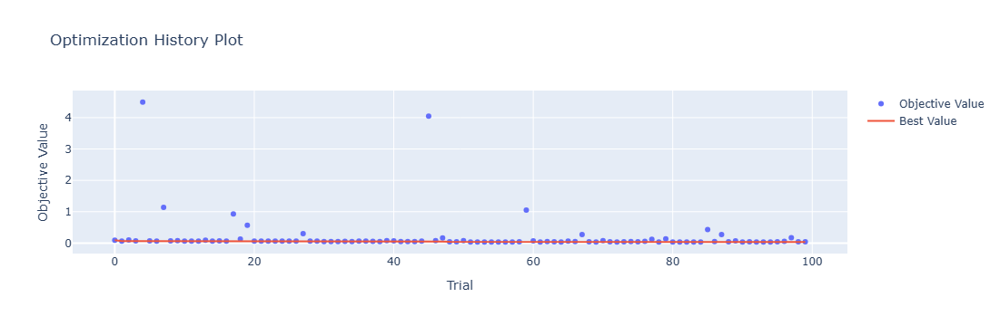

In [4]:
optuna.visualization.plot_optimization_history(study)

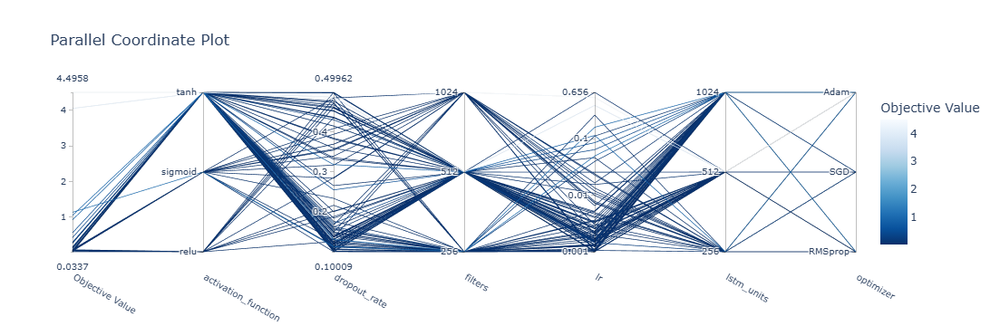

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

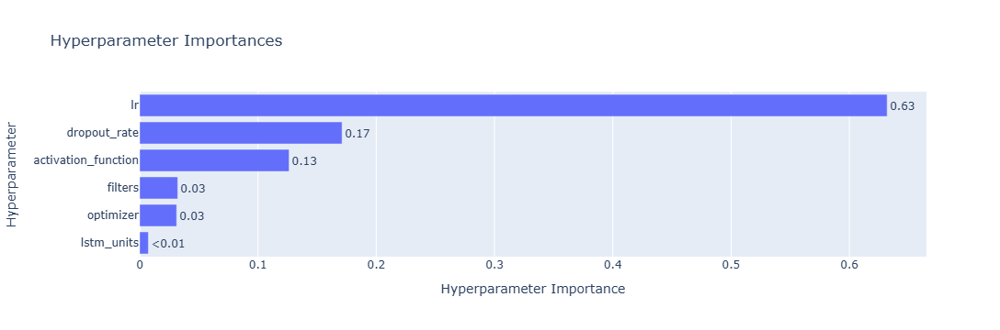

In [6]:
optuna.visualization.plot_param_importances(study)

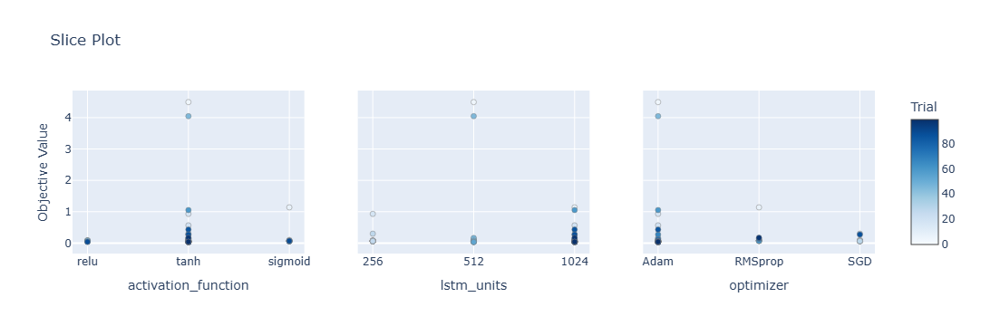

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

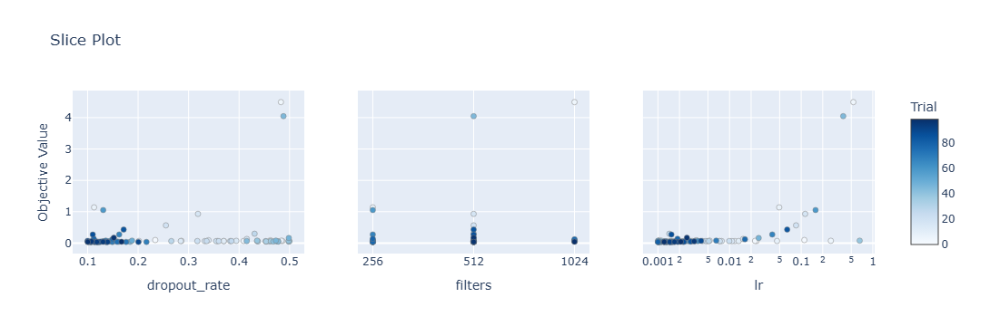

In [9]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate', 'filters'])

[[ 5.39  4.3   6.51 ... 13.73  8.35  9.05]
 [ 8.03  6.78  8.21 ... 17.14 11.74 12.27]
 [ 5.48  4.27  5.49 ... 13.3   9.17  8.6 ]
 ...
 [ 4.55  3.1   4.22 ... 12.8   7.91  6.65]
 [ 4.44  3.4   5.39 ... 12.34  7.74  6.78]
 [ 4.14  2.75  4.12 ... 10.6   7.07  6.41]]
Epoch 1/100
84/84 [==============================] - 45s 284ms/step - loss: 0.1279 - accuracy: 0.6071 - mae: 0.1074 - rmse: 0.1279 - mape: 23.4316 - pearson: 0.6202 - val_loss: 0.0814 - val_accuracy: 0.8000 - val_mae: 0.0628 - val_rmse: 0.0814 - val_mape: 13.5036 - val_pearson: 0.6762
Epoch 2/100
84/84 [==============================] - 17s 202ms/step - loss: 0.0817 - accuracy: 0.7143 - mae: 0.0669 - rmse: 0.0817 - mape: 15.0402 - pearson: 0.7717 - val_loss: 0.1227 - val_accuracy: 0.8000 - val_mae: 0.1044 - val_rmse: 0.1227 - val_mape: 21.4863 - val_pearson: 0.7447
Epoch 3/100
84/84 [==============================] - 17s 204ms/step - loss: 0.0785 - accuracy: 0.6071 - mae: 0.0637 - rmse: 0.0785 - mape: 14.0118 - pearson: 0.7745

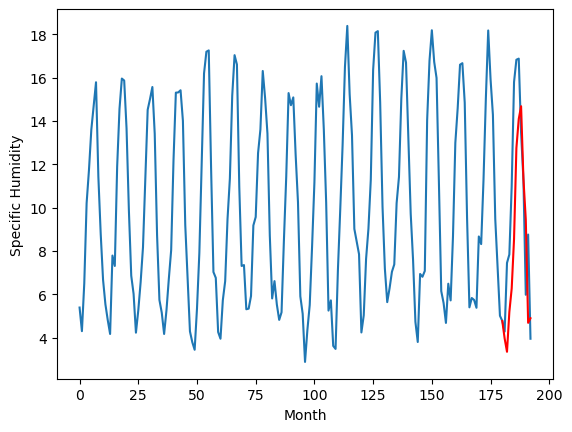

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.74		5.21		-0.53
6.45		4.60		-1.85
8.66		6.43		-2.23
8.88		7.52		-1.36
11.37		9.80		-1.57
16.12		14.00		-2.12
16.92		15.34		-1.58
17.08		15.93		-1.15
14.92		12.58		-2.34
11.84		10.70		-1.14
6.18		5.93		-0.25
9.82		6.15		-3.67
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.05, 5.210945560932159, 4.5983580493927, 6.4325386428833005, 7.52081955909729, 9.80333818435669, 14.001069202423096, 15.340536966323853, 15.932359113693238, 12.580976858139039, 10.704379215240479, 5.934259548187256, 6.146693080067635]


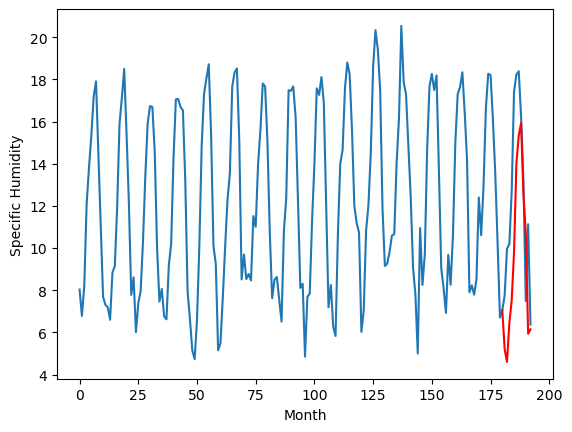

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.41		7.85		-0.56
8.56		7.24		-1.32
10.41		9.07		-1.34
10.65		10.16		-0.49
13.41		12.44		-0.97
18.03		16.64		-1.39
19.94		17.98		-1.96
20.14		18.57		-1.57
17.14		15.22		-1.92
14.42		13.34		-1.08
8.55		8.57		0.02
10.95		8.79		-2.16
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.06, 7.850947498083114, 7.238365768194198, 9.07254350066185, 10.160833119153976, 12.44335555911064, 16.641087530851365, 17.98055624842644, 18.572377442121507, 15.220994232892991, 13.344395159482957, 8.574285029172898, 8.786727263331414]


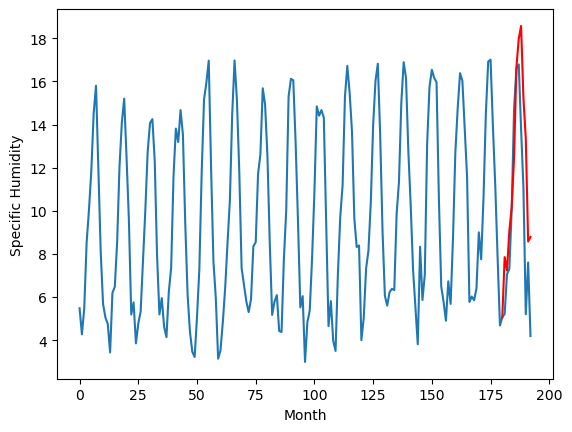

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.55		5.30		-0.25
5.46		4.69		-0.77
8.91		6.52		-2.39
9.48		7.61		-1.87
12.99		9.89		-3.10
16.89		14.09		-2.80
17.73		15.43		-2.30
17.35		16.02		-1.33
15.04		12.67		-2.37
12.61		10.79		-1.82
6.40		6.02		-0.38
9.45		6.24		-3.21
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.05, 5.300941701531411, 4.68834793150425, 6.522530432343483, 7.610799785256386, 9.89329623758793, 14.091016765236855, 15.430482621788979, 16.02230959713459, 12.670927341580391, 10.79433017551899, 6.024192388653756, 6.236615281105042]


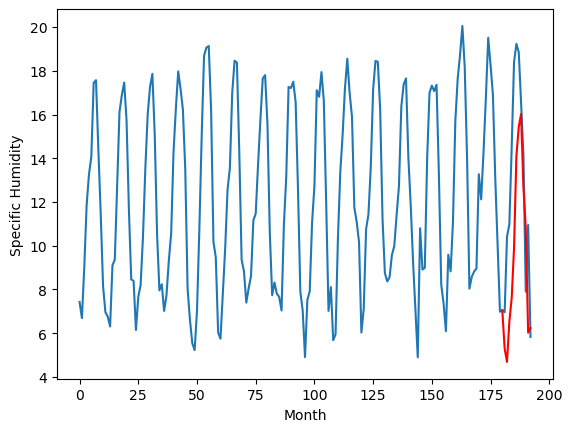

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.36		7.25		-0.11
6.96		6.64		-0.32
9.80		8.47		-1.33
11.20		9.56		-1.64
15.21		11.84		-3.37
18.90		16.04		-2.86
19.61		17.38		-2.23
19.53		17.97		-1.56
15.30		14.62		-0.68
13.21		12.74		-0.47
8.99		7.97		-1.02
11.75		8.19		-3.56
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.2, 7.25093396782875, 6.6382932889461514, 8.472499989271164, 9.560712360143661, 11.843143008947372, 16.040826820135116, 17.380288861989975, 17.97214099049568, 14.620779954195022, 12.74419387459755, 7.9739592897891995, 8.186302908062935]


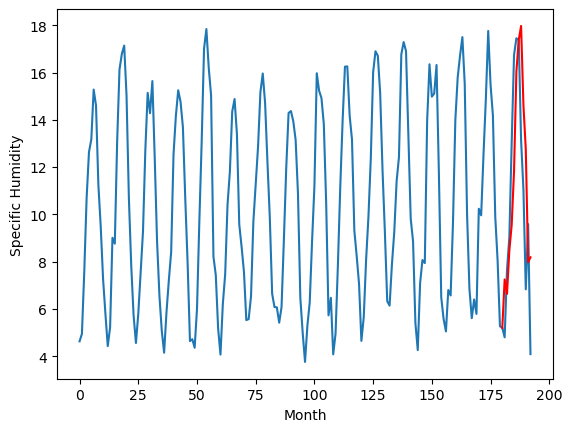

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.02		4.45		0.43
4.61		3.84		-0.77
6.18		5.67		-0.51
7.19		6.76		-0.43
9.69		9.04		-0.65
14.95		13.24		-1.71
16.07		14.58		-1.49
17.23		15.17		-2.06
13.14		11.82		-1.32
10.82		9.94		-0.88
5.56		5.17		-0.39
6.98		5.39		-1.59
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.16, 4.4509426552057265, 3.8383401829004287, 5.672530432343483, 6.760789175629616, 9.043277998566627, 13.240990896821021, 14.580455799698829, 15.1722895103693, 11.820914884209632, 9.944319625496863, 5.174161334633826, 5.386561994552611]


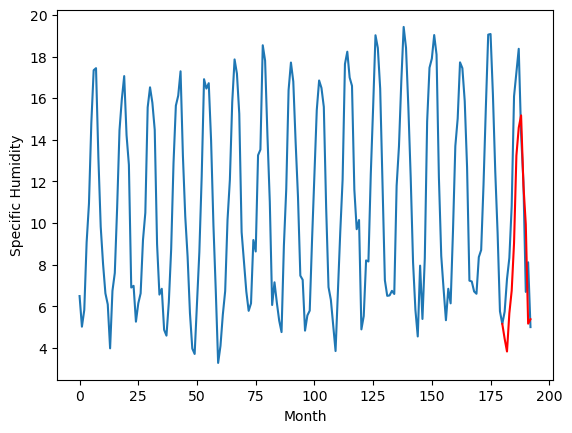

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.35		6.32		-0.03
6.40		5.71		-0.69
7.99		7.54		-0.45
8.59		8.63		0.04
11.59		10.91		-0.68
15.97		15.11		-0.86
17.41		16.45		-0.96
17.94		17.04		-0.90
14.62		13.69		-0.93
12.51		11.81		-0.70
6.76		7.04		0.28
8.60		7.26		-1.34
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.05, 6.320943623781204, 5.70834693312645, 7.542530387639999, 8.630802601575851, 10.91330572962761, 15.111023396253586, 16.450490206480026, 17.042320102453232, 13.690943568944931, 11.814346879720688, 7.044207662343979, 7.256625726819038]


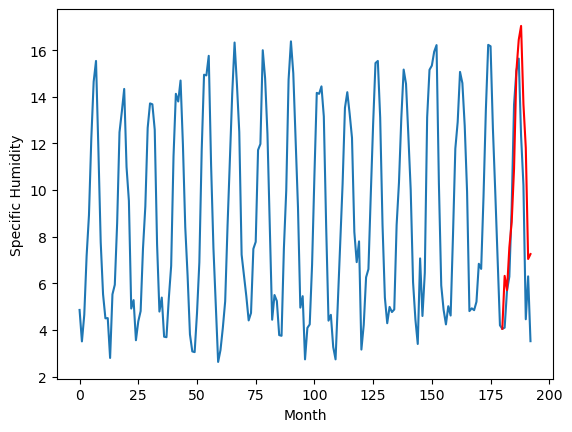

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.55		4.68		0.13
4.58		4.07		-0.51
6.20		5.90		-0.30
6.90		6.99		0.09
9.92		9.27		-0.65
14.19		13.47		-0.72
15.69		14.81		-0.88
15.97		15.40		-0.57
12.48		12.05		-0.43
10.60		10.17		-0.43
4.81		5.40		0.59
6.58		5.62		-0.96
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.64, 4.6809417015314105, 4.068341613411904, 5.902527094483376, 6.990789652466774, 9.273284197449684, 13.470998049378395, 14.810463905930519, 15.402295709252357, 12.050921559929847, 10.17432582437992, 5.404175639748573, 5.616585001945495]


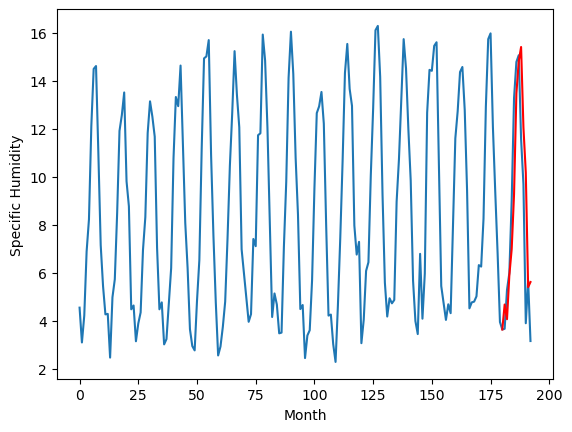

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.32		4.37		0.05
3.64		3.76		0.12
6.70		5.59		-1.11
7.43		6.68		-0.75
10.34		8.96		-1.38
15.32		13.16		-2.16
16.82		14.50		-2.32
17.01		15.09		-1.92
13.20		11.74		-1.46
10.78		9.86		-0.92
5.49		5.09		-0.40
7.08		5.31		-1.77
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.46, 4.370934921503067, 3.758313077688217, 5.592511075735092, 6.68074180483818, 8.963194626569749, 13.160886067152024, 14.500348109006882, 15.092191535234452, 11.740822154283524, 9.86423369050026, 5.094033437967301, 5.30640219449997]


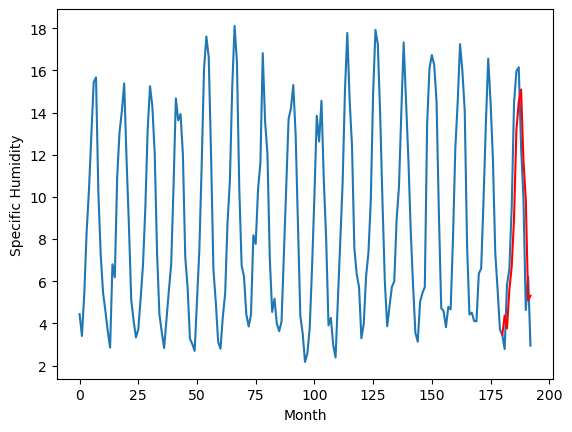

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.11		4.26		0.15
3.66		3.65		-0.01
5.46		5.48		0.02
6.78		6.57		-0.21
8.87		8.85		-0.02
13.64		13.05		-0.59
14.57		14.39		-0.18
14.99		14.98		-0.01
11.82		11.63		-0.19
10.51		9.75		-0.76
4.99		4.98		-0.01
5.83		5.20		-0.63
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.93, 4.260935890078545, 3.648316490054131, 5.482516395449639, 6.570750939249993, 8.853208767771722, 13.050903069376947, 14.390365111231805, 14.982208537459375, 11.630844163298608, 9.754252719283105, 4.984058188796045, 5.196430804729463]


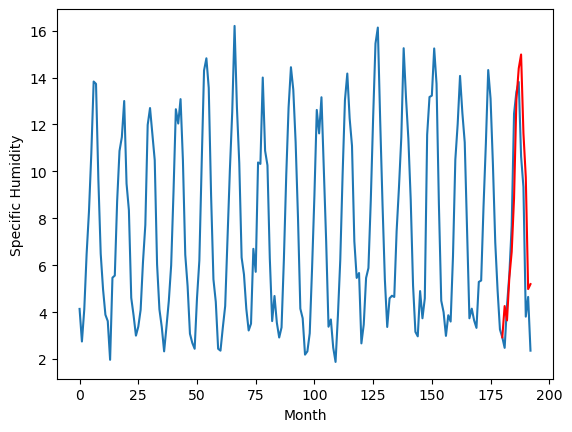

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.76		3.96		0.20
3.02		3.35		0.33
4.64		5.18		0.54
6.24		6.27		0.03
7.76		8.55		0.79
12.89		12.75		-0.14
13.96		14.09		0.13
14.45		14.68		0.23
10.83		11.33		0.50
9.84		9.45		-0.39
4.99		4.68		-0.31
4.99		4.90		-0.09
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.74, 3.9609291249513623, 3.3482777768373486, 5.182490318417549, 6.2706843310594556, 8.553092806935311, 12.750761359333993, 14.09021565258503, 14.68207743704319, 11.330729036927224, 9.454142480492592, 4.683879285454751, 4.896196796894074]


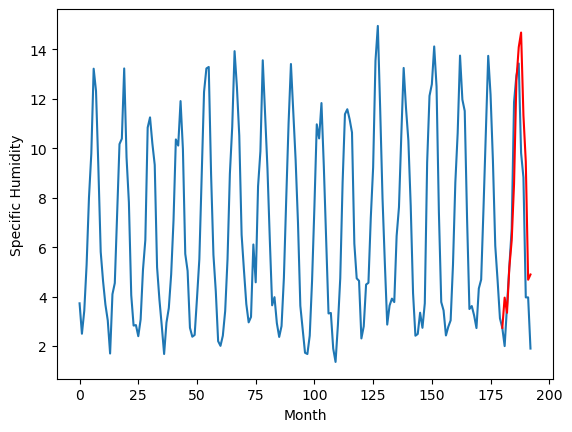

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.90   3.960941
1                 1    5.74   5.210946
2                 2    8.41   7.850947
3                 3    5.55   5.300942
4                 4    7.36   7.250934
5                 5    4.02   4.450943
6                 6    6.35   6.320944
7                 7    4.55   4.680942
8                 8    4.32   4.370935
9                 9    4.11   4.260936
10               10    3.76   3.960929


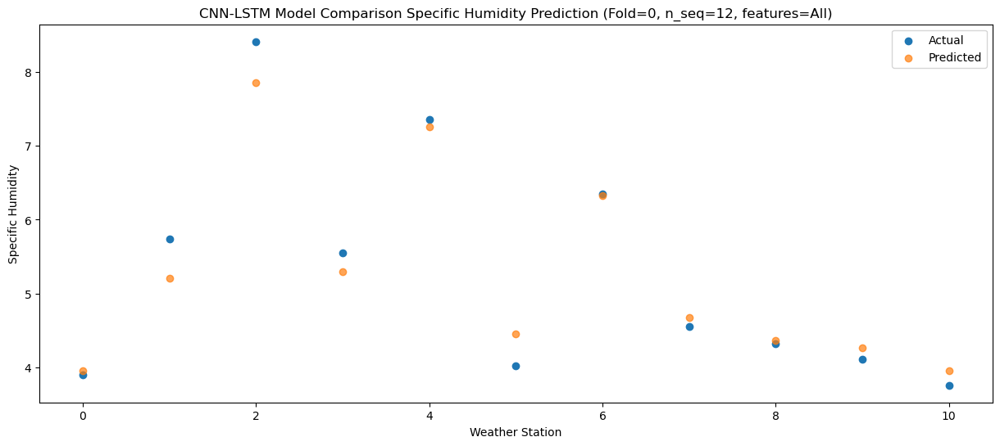

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.41   3.348334
1                 1    6.45   4.598358
2                 2    8.56   7.238366
3                 3    5.46   4.688348
4                 4    6.96   6.638293
5                 5    4.61   3.838340
6                 6    6.40   5.708347
7                 7    4.58   4.068342
8                 8    3.64   3.758313
9                 9    3.66   3.648316
10               10    3.02   3.348278


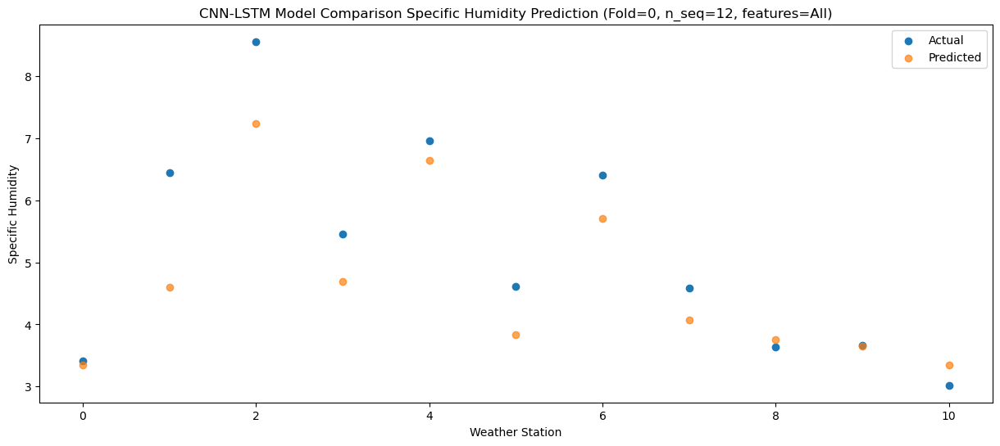

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.58   5.182522
1                 1    8.66   6.432539
2                 2   10.41   9.072544
3                 3    8.91   6.522530
4                 4    9.80   8.472500
5                 5    6.18   5.672530
6                 6    7.99   7.542530
7                 7    6.20   5.902527
8                 8    6.70   5.592511
9                 9    5.46   5.482516
10               10    4.64   5.182490


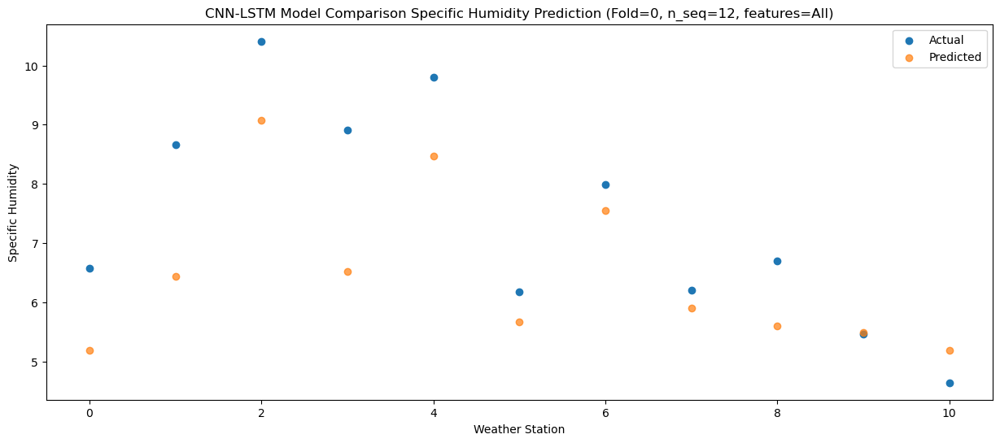

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    6.97   6.270777
1                 1    8.88   7.520820
2                 2   10.65  10.160833
3                 3    9.48   7.610800
4                 4   11.20   9.560712
5                 5    7.19   6.760789
6                 6    8.59   8.630803
7                 7    6.90   6.990790
8                 8    7.43   6.680742
9                 9    6.78   6.570751
10               10    6.24   6.270684


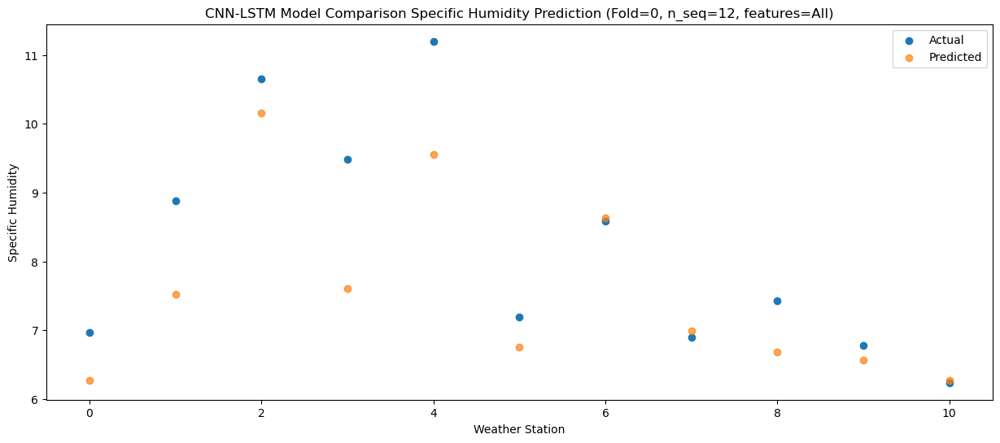

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.12   8.553258
1                 1   11.37   9.803338
2                 2   13.41  12.443356
3                 3   12.99   9.893296
4                 4   15.21  11.843143
5                 5    9.69   9.043278
6                 6   11.59  10.913306
7                 7    9.92   9.273284
8                 8   10.34   8.963195
9                 9    8.87   8.853209
10               10    7.76   8.553093


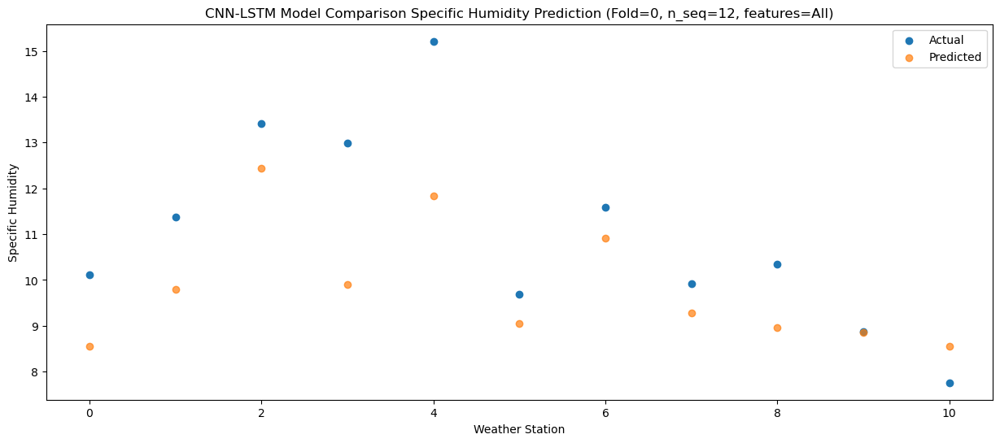

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.93  12.750969
1                 1   16.12  14.001069
2                 2   18.03  16.641088
3                 3   16.89  14.091017
4                 4   18.90  16.040827
5                 5   14.95  13.240991
6                 6   15.97  15.111023
7                 7   14.19  13.470998
8                 8   15.32  13.160886
9                 9   13.64  13.050903
10               10   12.89  12.750761


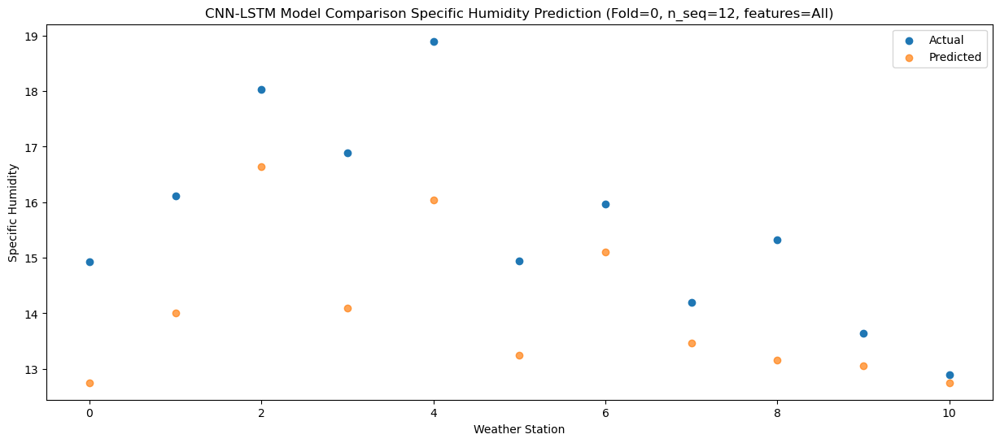

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   15.96  14.090435
1                 1   16.92  15.340537
2                 2   19.94  17.980556
3                 3   17.73  15.430483
4                 4   19.61  17.380289
5                 5   16.07  14.580456
6                 6   17.41  16.450490
7                 7   15.69  14.810464
8                 8   16.82  14.500348
9                 9   14.57  14.390365
10               10   13.96  14.090216


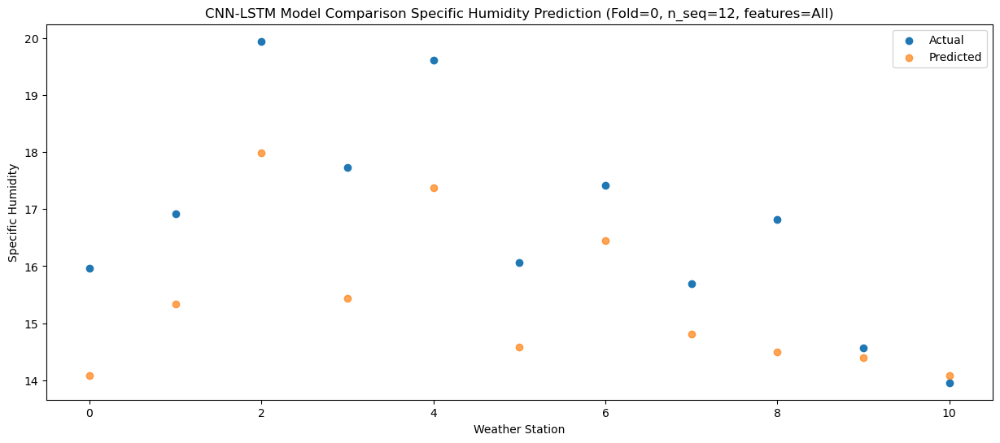

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.01  14.682270
1                 1   17.08  15.932359
2                 2   20.14  18.572377
3                 3   17.35  16.022310
4                 4   19.53  17.972141
5                 5   17.23  15.172290
6                 6   17.94  17.042320
7                 7   15.97  15.402296
8                 8   17.01  15.092192
9                 9   14.99  14.982209
10               10   14.45  14.682077


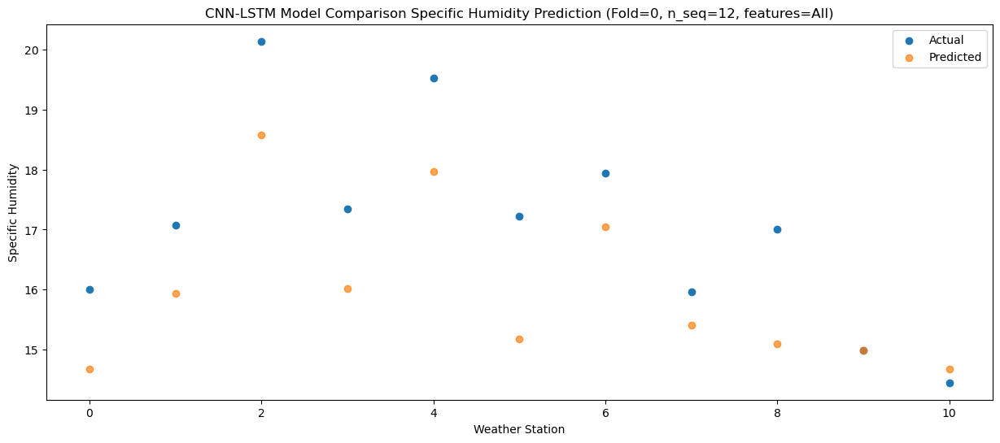

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   12.59  11.330893
1                 1   14.92  12.580977
2                 2   17.14  15.220994
3                 3   15.04  12.670927
4                 4   15.30  14.620780
5                 5   13.14  11.820915
6                 6   14.62  13.690944
7                 7   12.48  12.050922
8                 8   13.20  11.740822
9                 9   11.82  11.630844
10               10   10.83  11.330729


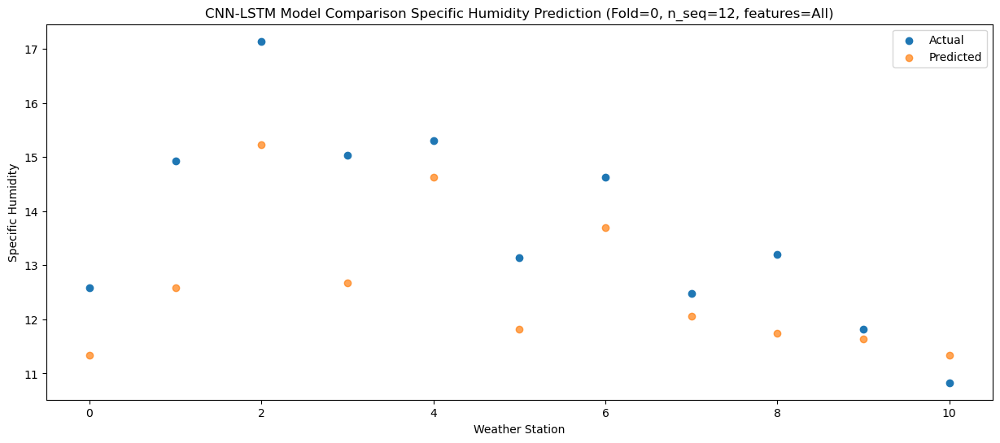

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.41   9.454302
1                 1   11.84  10.704379
2                 2   14.42  13.344395
3                 3   12.61  10.794330
4                 4   13.21  12.744194
5                 5   10.82   9.944320
6                 6   12.51  11.814347
7                 7   10.60  10.174326
8                 8   10.78   9.864234
9                 9   10.51   9.754253
10               10    9.84   9.454142


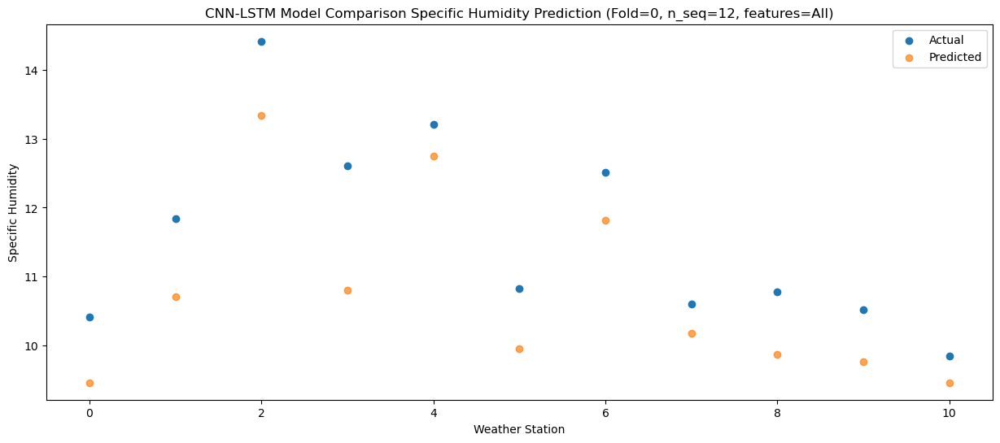

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.11   4.684138
1                 1    6.18   5.934260
2                 2    8.55   8.574285
3                 3    6.40   6.024192
4                 4    8.99   7.973959
5                 5    5.56   5.174161
6                 6    6.76   7.044208
7                 7    4.81   5.404176
8                 8    5.49   5.094033
9                 9    4.99   4.984058
10               10    4.99   4.683879


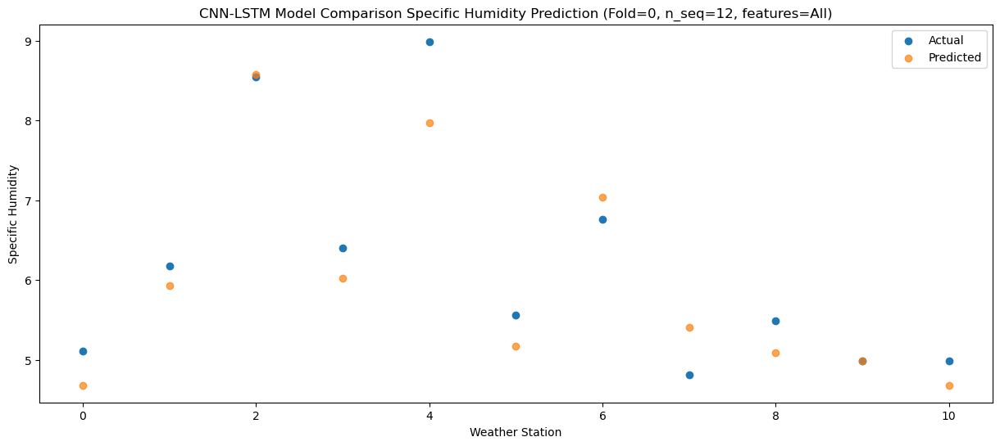

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.89   4.896540
1                 1    9.82   6.146693
2                 2   10.95   8.786727
3                 3    9.45   6.236615
4                 4   11.75   8.186303
5                 5    6.98   5.386562
6                 6    8.60   7.256626
7                 7    6.58   5.616585
8                 8    7.08   5.306402
9                 9    5.83   5.196431
10               10    4.99   4.896197


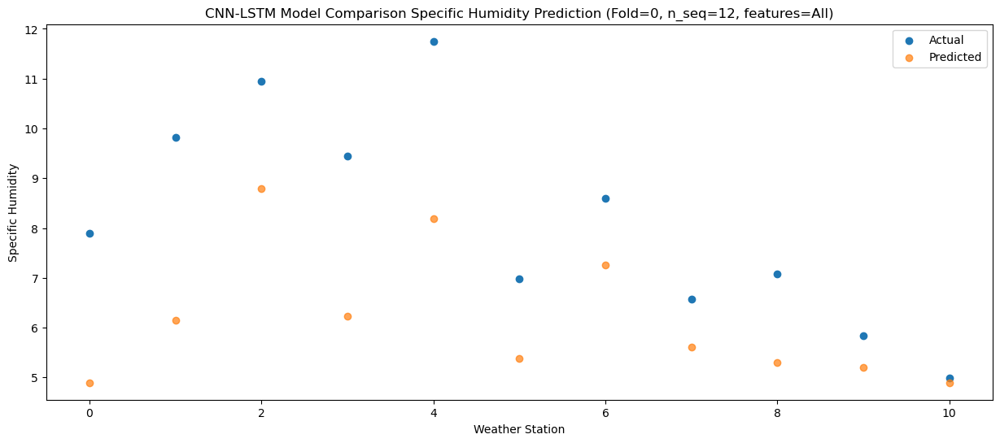

f, t:
[[ 3.9   5.74  8.41  5.55  7.36  4.02  6.35  4.55  4.32  4.11  3.76]
 [ 3.41  6.45  8.56  5.46  6.96  4.61  6.4   4.58  3.64  3.66  3.02]
 [ 6.58  8.66 10.41  8.91  9.8   6.18  7.99  6.2   6.7   5.46  4.64]
 [ 6.97  8.88 10.65  9.48 11.2   7.19  8.59  6.9   7.43  6.78  6.24]
 [10.12 11.37 13.41 12.99 15.21  9.69 11.59  9.92 10.34  8.87  7.76]
 [14.93 16.12 18.03 16.89 18.9  14.95 15.97 14.19 15.32 13.64 12.89]
 [15.96 16.92 19.94 17.73 19.61 16.07 17.41 15.69 16.82 14.57 13.96]
 [16.01 17.08 20.14 17.35 19.53 17.23 17.94 15.97 17.01 14.99 14.45]
 [12.59 14.92 17.14 15.04 15.3  13.14 14.62 12.48 13.2  11.82 10.83]
 [10.41 11.84 14.42 12.61 13.21 10.82 12.51 10.6  10.78 10.51  9.84]
 [ 5.11  6.18  8.55  6.4   8.99  5.56  6.76  4.81  5.49  4.99  4.99]
 [ 7.89  9.82 10.95  9.45 11.75  6.98  8.6   6.58  7.08  5.83  4.99]]
[[ 3.96094073  5.21094556  7.8509475   5.3009417   7.25093397  4.45094266
   6.32094362  4.6809417   4.37093492  4.26093589  3.96092912]
 [ 3.34833391  4.59835805  7

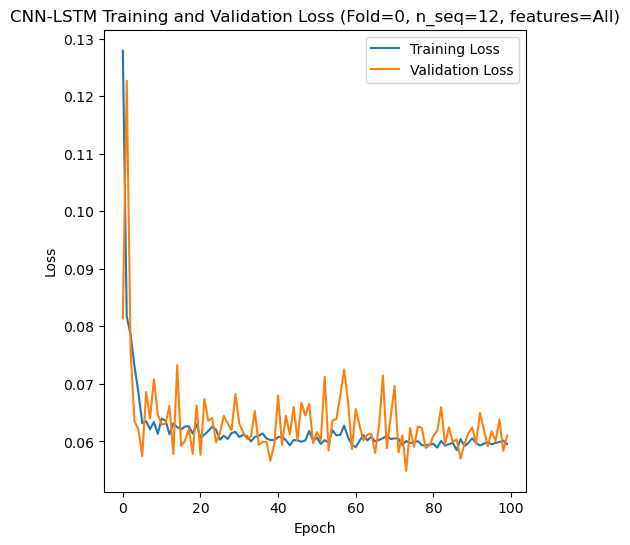

[[ 6.43  5.26  5.95 ... 15.04 10.09  9.76]
 [ 4.92  3.81  4.91 ... 12.52  8.69  7.9 ]
 [ 5.77  4.38  5.81 ... 14.28  9.78  9.52]
 ...
 [ 4.32  3.52  5.54 ... 12.    6.96  7.01]
 [ 3.07  3.12  5.08 ... 11.47  8.11  7.14]
 [ 2.37  2.06  3.5  ...  9.32  6.33  5.39]]
Epoch 1/100
84/84 [==============================] - 35s 186ms/step - loss: 0.1164 - accuracy: 0.6071 - mae: 0.0959 - rmse: 0.1164 - mape: 20.6437 - pearson: 0.6372 - val_loss: 0.0823 - val_accuracy: 0.7000 - val_mae: 0.0675 - val_rmse: 0.0823 - val_mape: 14.3420 - val_pearson: 0.7109
Epoch 2/100
84/84 [==============================] - 10s 124ms/step - loss: 0.0900 - accuracy: 0.7738 - mae: 0.0727 - rmse: 0.0900 - mape: 15.9093 - pearson: 0.7547 - val_loss: 0.0792 - val_accuracy: 0.7000 - val_mae: 0.0677 - val_rmse: 0.0792 - val_mape: 15.3709 - val_pearson: 0.8085
Epoch 3/100
84/84 [==============================] - 10s 116ms/step - loss: 0.0779 - accuracy: 0.7738 - mae: 0.0631 - rmse: 0.0779 - mape: 13.8245 - pearson: 0.7893

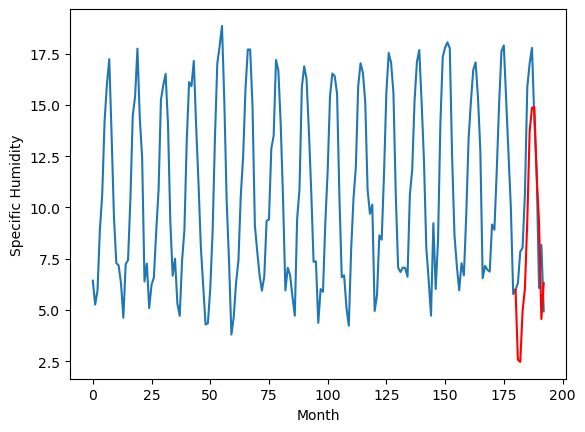

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.45		6.66		0.21
6.64		6.55		-0.09
8.17		9.06		0.89
8.53		10.13		1.60
11.45		13.37		1.92
15.43		17.74		2.31
17.30		18.91		1.61
17.51		18.96		1.45
14.56		15.64		1.08
12.52		13.42		0.90
6.93		8.61		1.68
9.10		10.45		1.35
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.15, 6.656705238223076, 6.55047453969717, 9.059298888146877, 10.132896319329738, 13.371919527947902, 17.740212336480617, 18.911260024011135, 18.961497571617365, 15.64120223775506, 13.422459628731012, 8.611412551552057, 10.449514415413141]


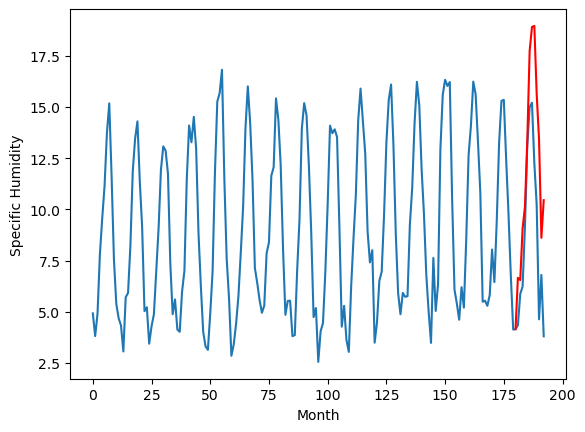

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		5.21		0.14
5.07		5.15		0.08
7.69		7.72		0.03
7.40		8.72		1.32
10.24		11.97		1.73
14.76		16.28		1.52
16.35		17.46		1.11
16.57		17.48		0.91
13.81		14.25		0.44
11.06		11.99		0.93
5.56		7.16		1.60
8.20		9.18		0.98
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.12, 5.206397606134415, 5.145979093462229, 7.7167512644827365, 8.719530509859323, 11.965377258211374, 16.281874584108593, 17.45757441416383, 17.48142350099981, 14.246805790886285, 11.991705302223565, 7.160818461403252, 9.184773568138482]


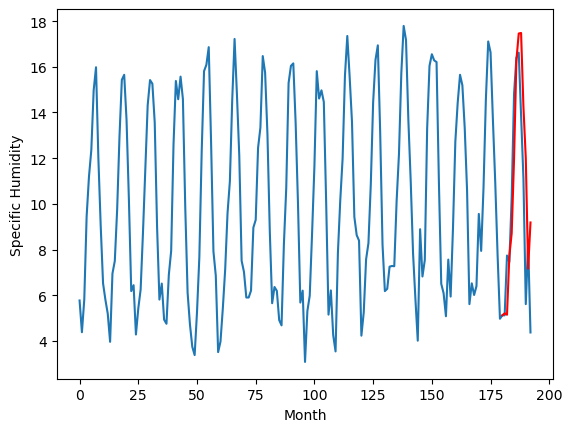

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.43		5.99		0.56
5.50		5.92		0.42
8.14		8.45		0.31
9.48		9.54		0.06
13.37		12.92		-0.45
16.56		17.20		0.64
17.04		18.36		1.32
17.38		18.36		0.98
14.29		14.99		0.70
12.04		12.68		0.64
7.59		8.00		0.41
10.51		9.84		-0.67
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.35, 5.992500681877136, 5.921071913540363, 8.44727793008089, 9.537146356403827, 12.920280959904193, 17.19699671536684, 18.356732991039753, 18.356044049530755, 14.993559117584955, 12.682405228882562, 8.00363659408642, 9.837372417717706]


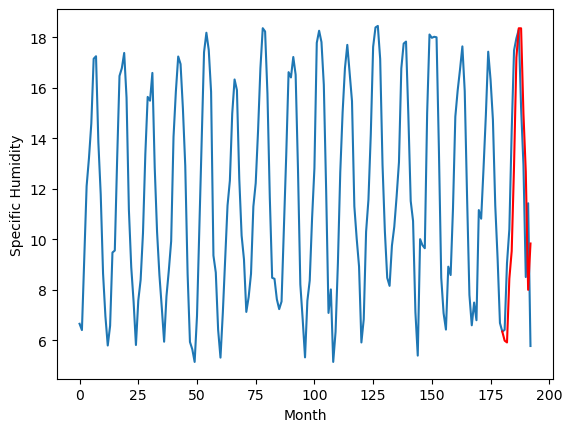

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.41		6.89		0.48
6.45		6.82		0.37
9.17		9.35		0.18
10.43		10.43		0.00
14.46		13.81		-0.65
17.87		18.09		0.22
18.05		19.25		1.20
18.09		19.25		1.16
14.99		15.89		0.90
13.04		13.59		0.55
8.45		8.89		0.44
11.38		10.75		-0.63
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.08, 6.887466106414795, 6.817191678881645, 9.347725231051445, 10.43087251842022, 13.80530985057354, 18.08653076350689, 19.24758370578289, 19.24840778650483, 15.894270604269114, 13.586539929525461, 8.893922513143625, 10.745220130102243]


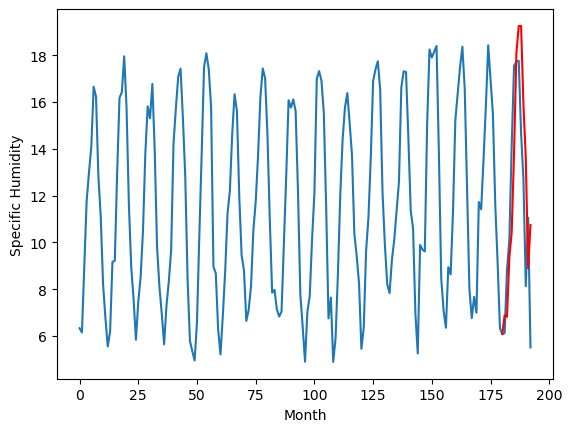

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.16		6.41		-0.75
6.53		6.11		-0.42
7.32		7.90		0.58
8.62		9.20		0.58
12.93		12.36		-0.57
15.10		15.76		0.66
16.43		16.77		0.34
16.65		16.61		-0.04
13.11		13.52		0.41
10.00		11.35		1.35
8.16		8.49		0.33
7.11		8.51		1.40
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.92, 6.406066240668297, 6.111749978661537, 7.899904699921608, 9.202982636094093, 12.361866922974587, 15.76051065504551, 16.76517805635929, 16.612882839441298, 13.517352567911146, 11.35360764145851, 8.494068609476088, 8.511489529088138]


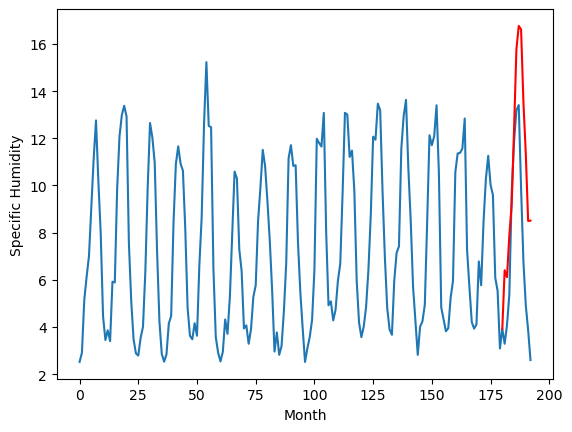

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.41		2.72		0.31
2.53		2.60		0.07
4.09		5.08		0.99
4.71		6.18		1.47
7.64		9.40		1.76
11.99		13.79		1.80
14.49		14.96		0.47
14.78		15.03		0.25
11.43		11.69		0.26
9.30		9.49		0.19
3.37		4.68		1.31
5.24		6.44		1.20
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.16, 2.7232983601093292, 2.595275793671608, 5.078223143219947, 6.179083023667335, 9.39502135336399, 13.792294417023658, 14.963427100777626, 15.032992657721042, 11.686302241384983, 9.493541058599948, 4.676048573553562, 6.437028822004795]


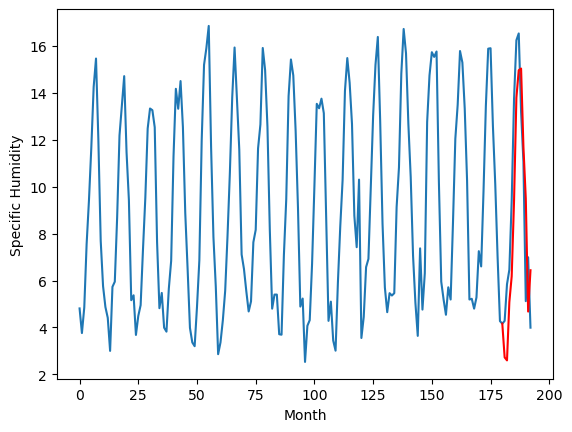

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.68		5.03		0.35
4.16		4.95		0.79
6.89		7.46		0.57
8.12		8.55		0.43
11.33		11.87		0.54
16.09		16.18		0.09
16.72		17.34		0.62
16.57		17.36		0.79
13.32		14.02		0.70
10.59		11.74		1.15
6.03		7.02		0.99
7.67		8.84		1.17
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.84, 5.0329927778244015, 4.94615196943283, 7.460952041149139, 8.546098706722258, 11.868360517024993, 16.175578591823577, 17.339187738895415, 17.359054630100726, 14.015634839832781, 11.74275786191225, 7.022591655552386, 8.84492809087038]


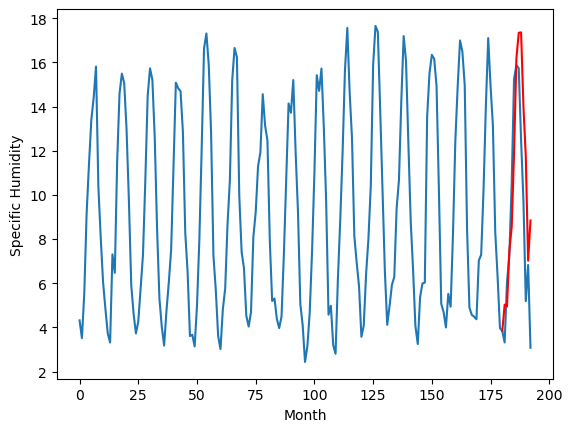

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		4.37		-0.11
3.67		4.19		0.52
6.28		6.43		0.15
7.44		7.74		0.30
11.66		11.15		-0.51
14.80		15.20		0.40
15.85		16.30		0.45
15.43		16.30		0.87
11.86		12.81		0.95
9.42		10.53		1.11
5.89		6.48		0.59
5.28		7.42		2.14
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.73, 4.368452857881785, 4.1866000552475455, 6.428199376612902, 7.74453970387578, 11.154222216159106, 15.196898188143969, 16.301717009097338, 16.302064463634743, 12.81472615911509, 10.533962294597877, 6.481608912487282, 7.41624997570063]


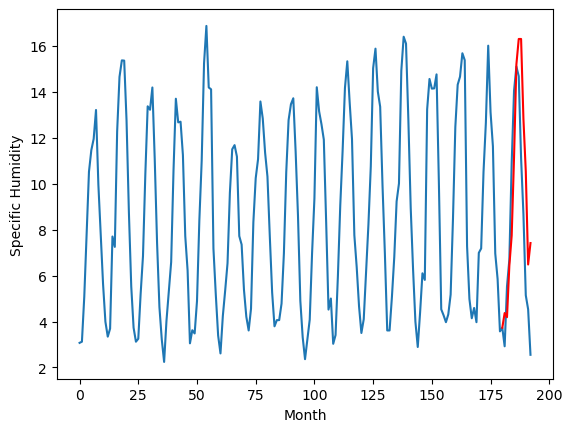

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.26		3.12		-0.14
2.52		2.73		0.21
4.34		4.39		0.05
4.51		5.72		1.21
9.66		8.58		-1.08
12.65		12.02		-0.63
13.89		13.02		-0.87
12.86		12.97		0.11
9.90		9.98		0.08
6.46		7.99		1.53
4.10		5.14		1.04
3.12		4.89		1.77
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.83, 3.118921748995781, 2.73000197827816, 4.3915811103582385, 5.71738629758358, 8.582624487280846, 12.015250734686852, 13.024499706625939, 12.974420983046294, 9.98242827102542, 7.994100887030363, 5.143824178427458, 4.8939965550601485]


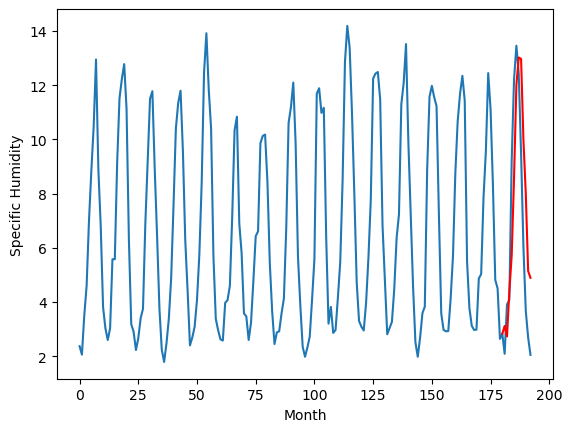

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.64		2.16		0.52
1.68		1.62		-0.06
2.92		3.53		0.61
4.29		5.12		0.83
5.82		7.58		1.76
11.14		12.14		1.00
13.00		13.31		0.31
13.34		13.84		0.50
10.15		10.35		0.20
8.29		8.70		0.41
3.10		4.16		1.06
2.98		4.11		1.13
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.69, 2.1647881668806077, 1.6212476295232774, 3.525746564269066, 5.123615364432335, 7.5838895839452745, 12.140561680197717, 13.309785942435266, 13.844241837859155, 10.34785483300686, 8.703960995078088, 4.156905750632287, 4.111639211773873]


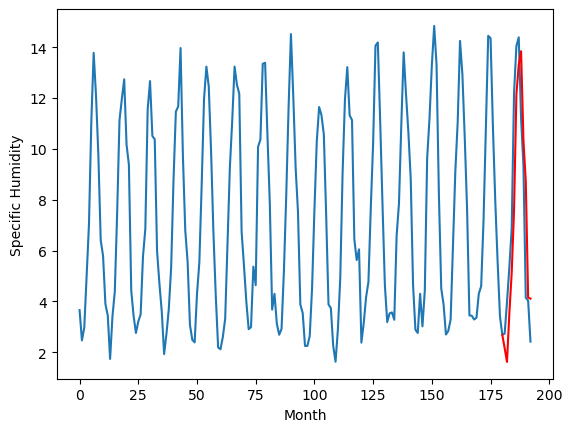

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.59   2.571247
1                 1    6.45   6.656705
2                 2    5.07   5.206398
3                 3    5.43   5.992501
4                 4    6.41   6.887466
5                 5    7.16   6.406066
6                 6    2.41   2.723298
7                 7    4.68   5.032993
8                 8    4.48   4.368453
9                 9    3.26   3.118922
10               10    1.64   2.164788


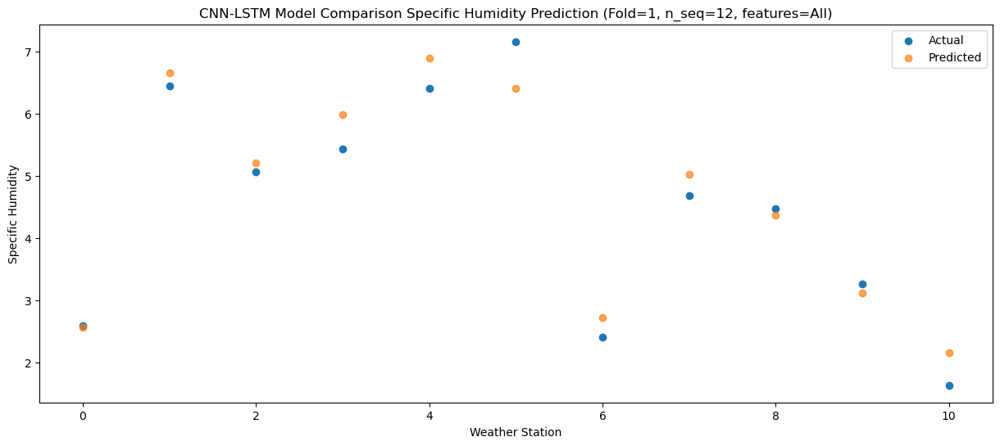

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    2.91   2.463780
1                 1    6.64   6.550475
2                 2    5.07   5.145979
3                 3    5.50   5.921072
4                 4    6.45   6.817192
5                 5    6.53   6.111750
6                 6    2.53   2.595276
7                 7    4.16   4.946152
8                 8    3.67   4.186600
9                 9    2.52   2.730002
10               10    1.68   1.621248


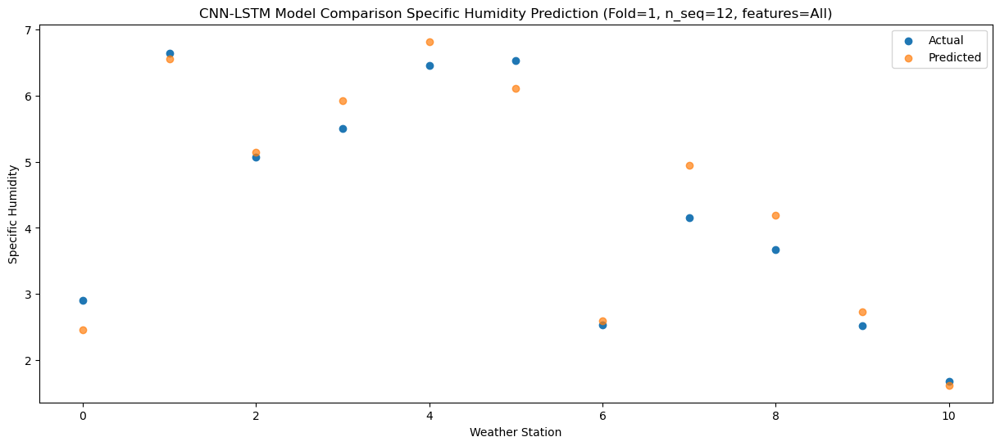

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    4.44   4.954985
1                 1    8.17   9.059299
2                 2    7.69   7.716751
3                 3    8.14   8.447278
4                 4    9.17   9.347725
5                 5    7.32   7.899905
6                 6    4.09   5.078223
7                 7    6.89   7.460952
8                 8    6.28   6.428199
9                 9    4.34   4.391581
10               10    2.92   3.525747


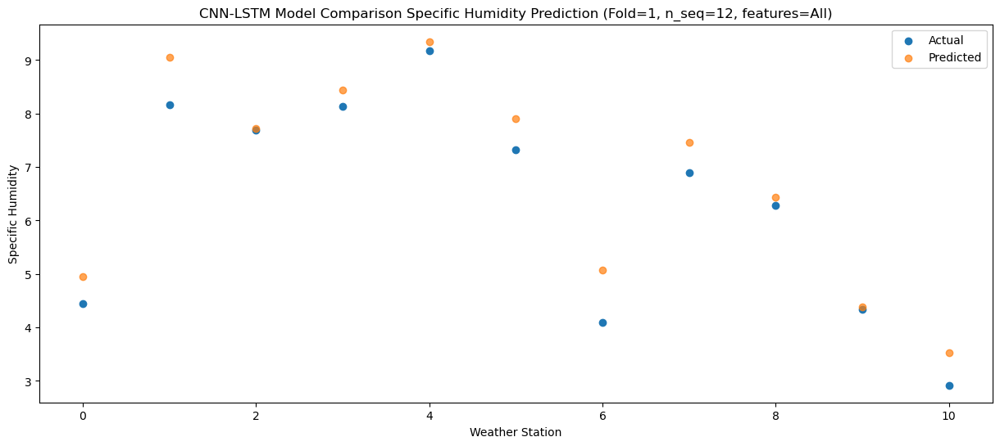

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    4.64   6.064758
1                 1    8.53  10.132896
2                 2    7.40   8.719531
3                 3    9.48   9.537146
4                 4   10.43  10.430873
5                 5    8.62   9.202983
6                 6    4.71   6.179083
7                 7    8.12   8.546099
8                 8    7.44   7.744540
9                 9    4.51   5.717386
10               10    4.29   5.123615


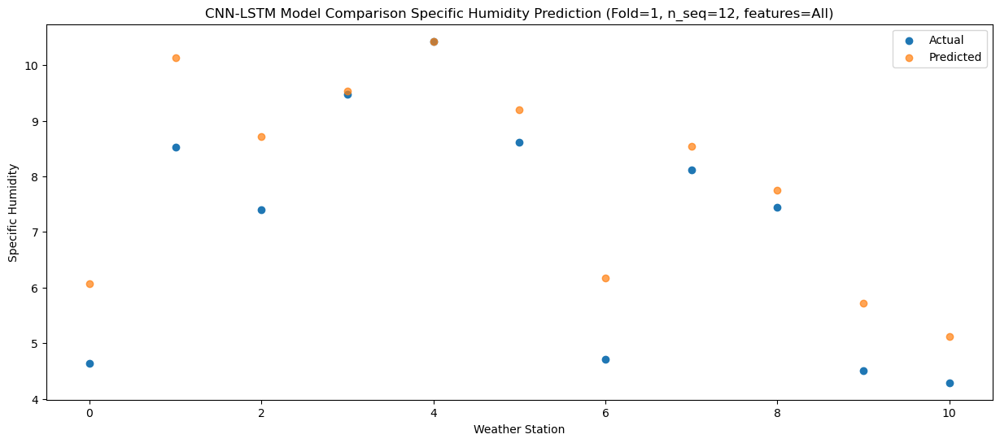

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    7.32   9.363554
1                 1   11.45  13.371920
2                 2   10.24  11.965377
3                 3   13.37  12.920281
4                 4   14.46  13.805310
5                 5   12.93  12.361867
6                 6    7.64   9.395021
7                 7   11.33  11.868361
8                 8   11.66  11.154222
9                 9    9.66   8.582624
10               10    5.82   7.583890


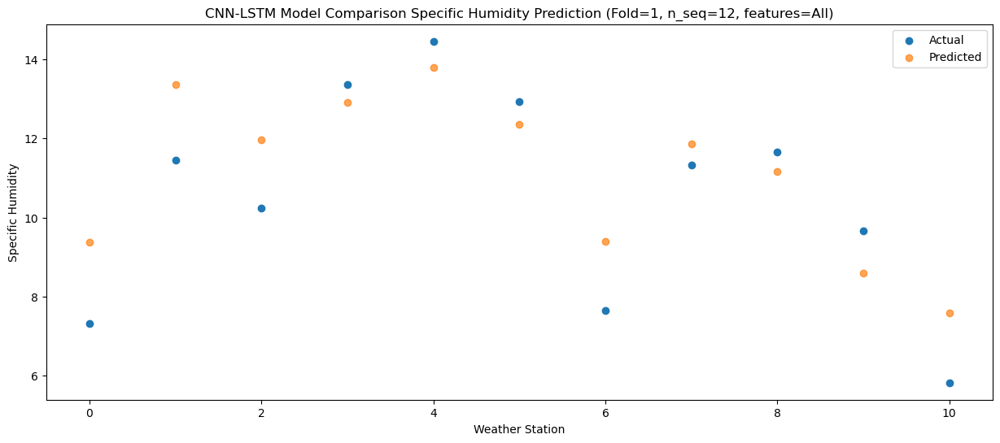

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   12.48  13.700421
1                 1   15.43  17.740212
2                 2   14.76  16.281875
3                 3   16.56  17.196997
4                 4   17.87  18.086531
5                 5   15.10  15.760511
6                 6   11.99  13.792294
7                 7   16.09  16.175579
8                 8   14.80  15.196898
9                 9   12.65  12.015251
10               10   11.14  12.140562


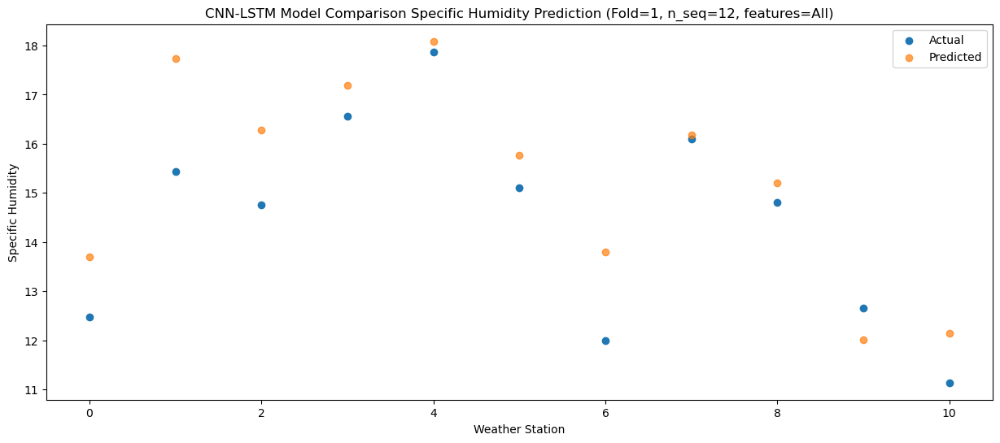

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   13.63  14.864269
1                 1   17.30  18.911260
2                 2   16.35  17.457574
3                 3   17.04  18.356733
4                 4   18.05  19.247584
5                 5   16.43  16.765178
6                 6   14.49  14.963427
7                 7   16.72  17.339188
8                 8   15.85  16.301717
9                 9   13.89  13.024500
10               10   13.00  13.309786


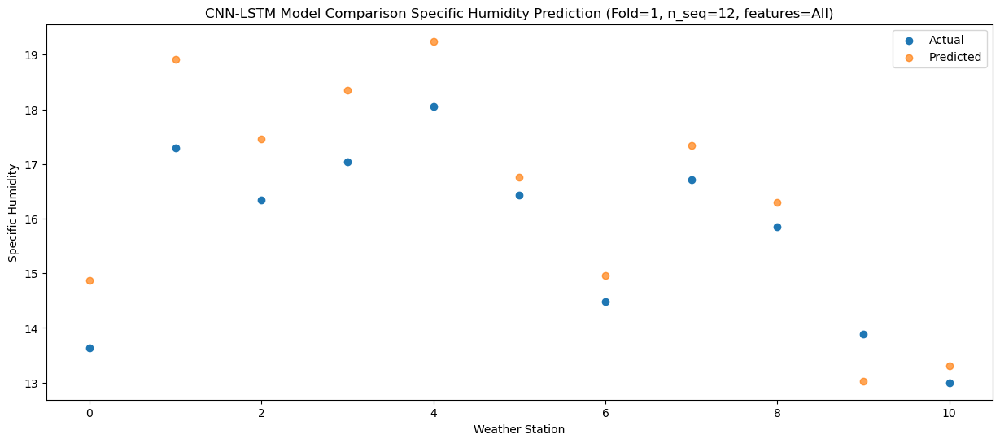

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   14.39  14.903079
1                 1   17.51  18.961498
2                 2   16.57  17.481424
3                 3   17.38  18.356044
4                 4   18.09  19.248408
5                 5   16.65  16.612883
6                 6   14.78  15.032993
7                 7   16.57  17.359055
8                 8   15.43  16.302064
9                 9   12.86  12.974421
10               10   13.34  13.844242


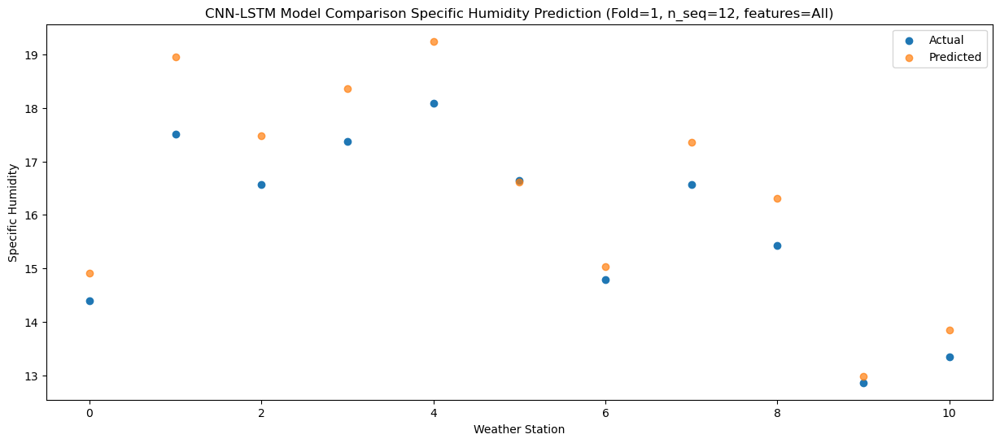

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   10.91  11.535482
1                 1   14.56  15.641202
2                 2   13.81  14.246806
3                 3   14.29  14.993559
4                 4   14.99  15.894271
5                 5   13.11  13.517353
6                 6   11.43  11.686302
7                 7   13.32  14.015635
8                 8   11.86  12.814726
9                 9    9.90   9.982428
10               10   10.15  10.347855


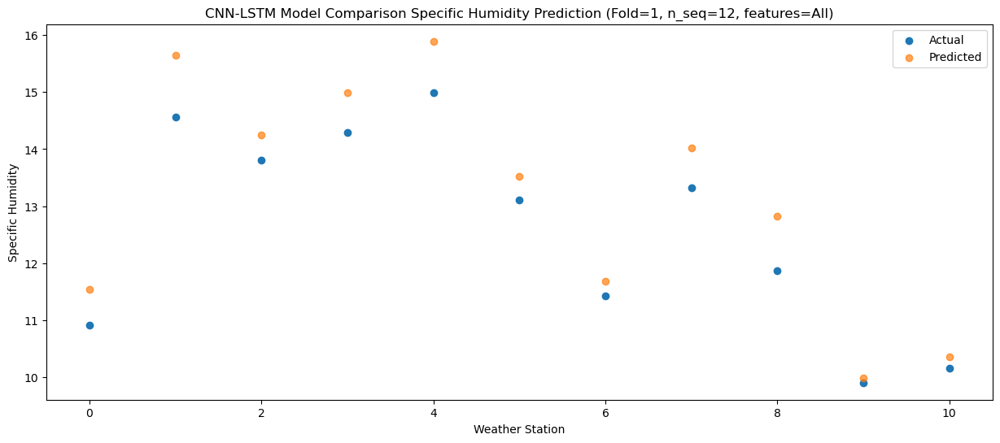

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0    8.33   9.288223
1                 1   12.52  13.422460
2                 2   11.06  11.991705
3                 3   12.04  12.682405
4                 4   13.04  13.586540
5                 5   10.00  11.353608
6                 6    9.30   9.493541
7                 7   10.59  11.742758
8                 8    9.42  10.533962
9                 9    6.46   7.994101
10               10    8.29   8.703961


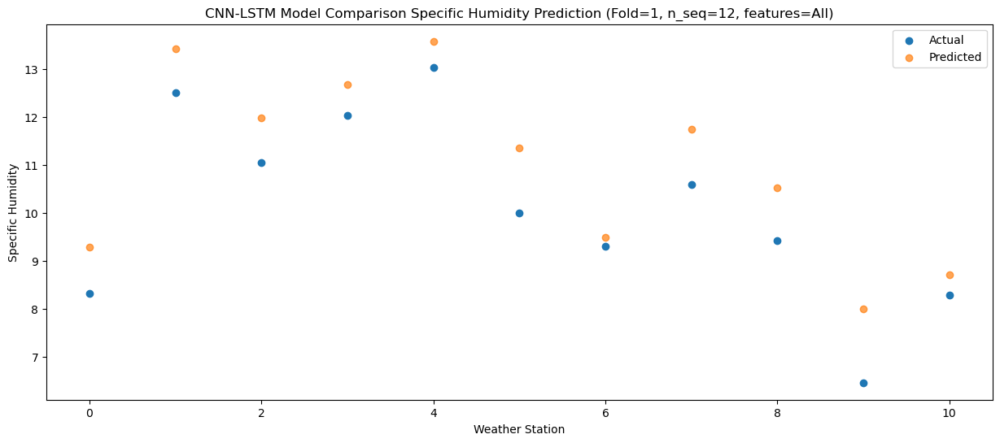

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    2.67   4.557141
1                 1    6.93   8.611413
2                 2    5.56   7.160818
3                 3    7.59   8.003637
4                 4    8.45   8.893923
5                 5    8.16   8.494069
6                 6    3.37   4.676049
7                 7    6.03   7.022592
8                 8    5.89   6.481609
9                 9    4.10   5.143824
10               10    3.10   4.156906


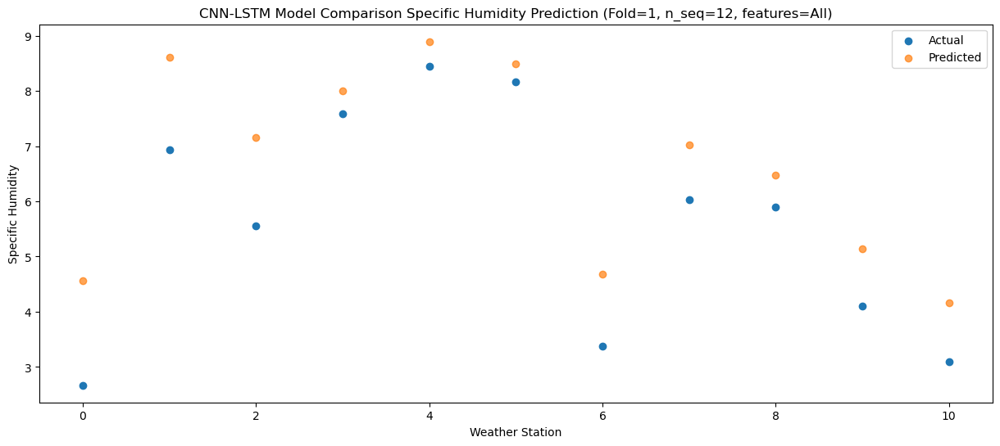

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    4.78   6.309898
1                 1    9.10  10.449514
2                 2    8.20   9.184774
3                 3   10.51   9.837372
4                 4   11.38  10.745220
5                 5    7.11   8.511490
6                 6    5.24   6.437029
7                 7    7.67   8.844928
8                 8    5.28   7.416250
9                 9    3.12   4.893997
10               10    2.98   4.111639


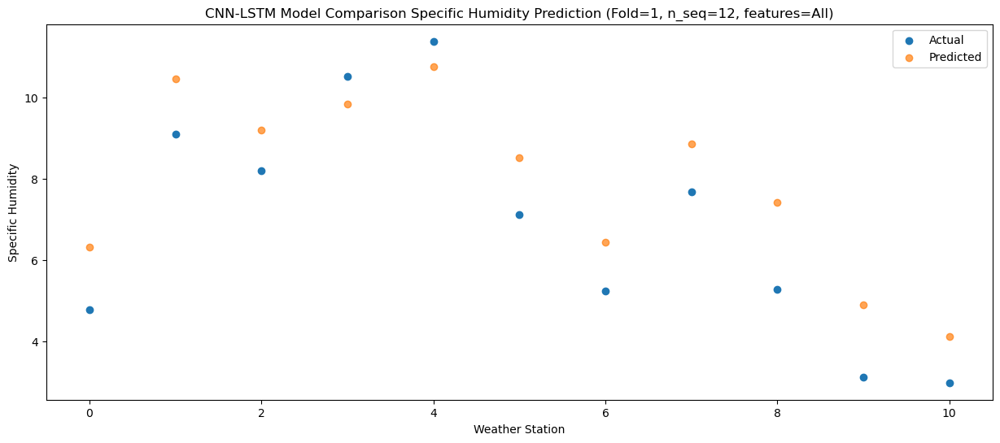

f, t:
[[ 2.59  6.45  5.07  5.43  6.41  7.16  2.41  4.68  4.48  3.26  1.64]
 [ 2.91  6.64  5.07  5.5   6.45  6.53  2.53  4.16  3.67  2.52  1.68]
 [ 4.44  8.17  7.69  8.14  9.17  7.32  4.09  6.89  6.28  4.34  2.92]
 [ 4.64  8.53  7.4   9.48 10.43  8.62  4.71  8.12  7.44  4.51  4.29]
 [ 7.32 11.45 10.24 13.37 14.46 12.93  7.64 11.33 11.66  9.66  5.82]
 [12.48 15.43 14.76 16.56 17.87 15.1  11.99 16.09 14.8  12.65 11.14]
 [13.63 17.3  16.35 17.04 18.05 16.43 14.49 16.72 15.85 13.89 13.  ]
 [14.39 17.51 16.57 17.38 18.09 16.65 14.78 16.57 15.43 12.86 13.34]
 [10.91 14.56 13.81 14.29 14.99 13.11 11.43 13.32 11.86  9.9  10.15]
 [ 8.33 12.52 11.06 12.04 13.04 10.    9.3  10.59  9.42  6.46  8.29]
 [ 2.67  6.93  5.56  7.59  8.45  8.16  3.37  6.03  5.89  4.1   3.1 ]
 [ 4.78  9.1   8.2  10.51 11.38  7.11  5.24  7.67  5.28  3.12  2.98]]
[[ 2.57124683  6.65670524  5.20639761  5.99250068  6.88746611  6.40606624
   2.72329836  5.03299278  4.36845286  3.11892175  2.16478817]
 [ 2.46377961  6.55047454  5

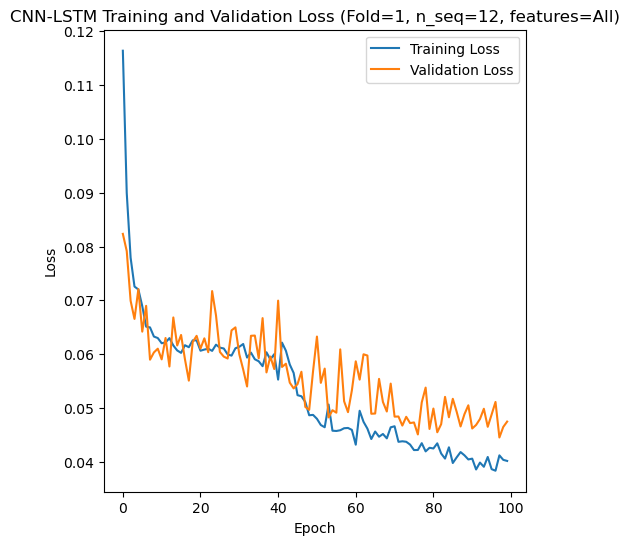

[[ 4.97  3.84  5.83 ... 12.86  8.48  8.25]
 [ 2.46  2.06  3.48 ...  9.57  6.71  5.1 ]
 [ 8.78  8.15  9.01 ... 20.36 15.38 12.95]
 ...
 [ 1.89  2.51  2.73 ...  7.42  4.53  3.35]
 [ 5.04  4.9   5.93 ... 10.09  8.19  4.88]
 [ 5.06  3.79  4.84 ... 13.58  8.96  7.8 ]]
Epoch 1/100
84/84 [==============================] - 45s 251ms/step - loss: 0.1149 - accuracy: 0.5000 - mae: 0.0934 - rmse: 0.1149 - mape: 20.5128 - pearson: 0.6378 - val_loss: 0.0846 - val_accuracy: 1.0000 - val_mae: 0.0714 - val_rmse: 0.0846 - val_mape: 13.8655 - val_pearson: 0.8915
Epoch 2/100
84/84 [==============================] - 14s 163ms/step - loss: 0.0919 - accuracy: 0.6429 - mae: 0.0751 - rmse: 0.0919 - mape: 16.6666 - pearson: 0.7400 - val_loss: 0.0644 - val_accuracy: 1.0000 - val_mae: 0.0539 - val_rmse: 0.0644 - val_mape: 11.5310 - val_pearson: 0.8451
Epoch 3/100
84/84 [==============================] - 14s 168ms/step - loss: 0.0814 - accuracy: 0.7381 - mae: 0.0659 - rmse: 0.0814 - mape: 14.5674 - pearson: 0.7743

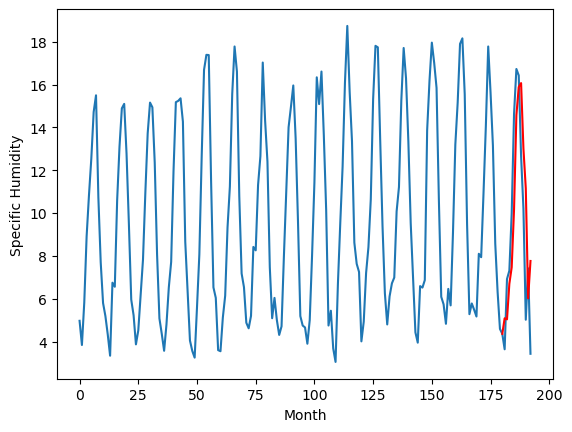

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.92		5.06		0.14
4.24		4.71		0.47
6.09		5.62		-0.47
6.21		6.55		0.34
11.33		8.86		-2.47
14.24		11.85		-2.39
15.85		13.17		-2.68
14.23		13.03		-1.20
11.41		10.69		-0.72
8.02		8.90		0.88
5.59		6.36		0.77
4.53		5.78		1.25
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.82, 5.057181717157364, 4.712831468582153, 5.617300601005554, 6.546834678649902, 8.8595366191864, 11.84787103652954, 13.173209400177, 13.028117613196372, 10.685407118201255, 8.903382734656333, 6.36099858701229, 5.782081739306449]


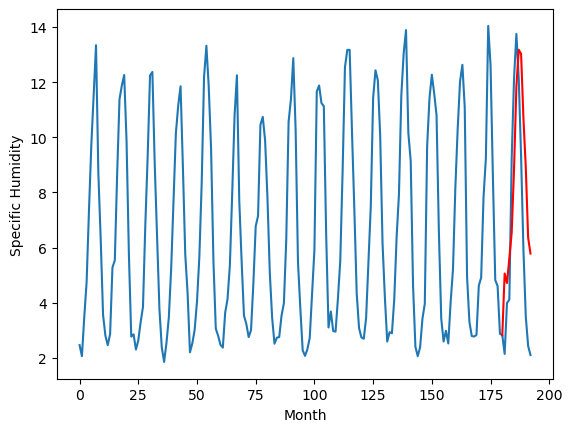

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.95		2.59		-0.36
5.08		2.63		-2.45
5.30		4.33		-0.97
6.27		5.06		-1.21
7.58		7.93		0.35
11.36		12.18		0.82
11.76		13.50		1.74
12.38		13.59		1.21
11.10		10.68		-0.42
8.44		8.76		0.32
4.49		3.84		-0.65
5.89		5.74		-0.15
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.16, 2.5902196830511093, 2.628094325810671, 4.331683526784182, 5.06278432443738, 7.934937845021486, 12.17554558351636, 13.502679000645877, 13.59290571793914, 10.679459053128959, 8.762751895040275, 3.8433464346826085, 5.735522228330375]


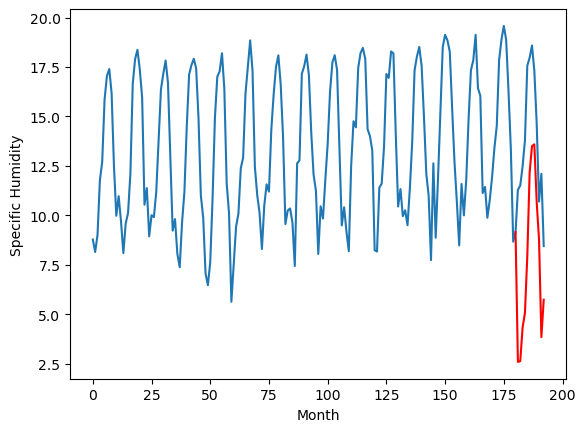

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.70		8.27		0.57
7.87		7.65		-0.22
8.51		8.94		0.43
9.86		10.19		0.33
11.54		12.09		0.55
16.14		16.55		0.41
18.74		17.82		-0.92
19.48		18.44		-1.04
16.82		14.98		-1.84
13.86		13.28		-0.58
9.41		8.36		-1.05
9.05		8.14		-0.91
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.44, 8.271629064083099, 7.654009013175964, 8.9366264629364, 10.19231596469879, 12.086093215942382, 16.548438816070558, 17.816277651786805, 18.435111193656923, 14.984933762550355, 13.284254579544069, 8.357198266983033, 8.135290055274965]


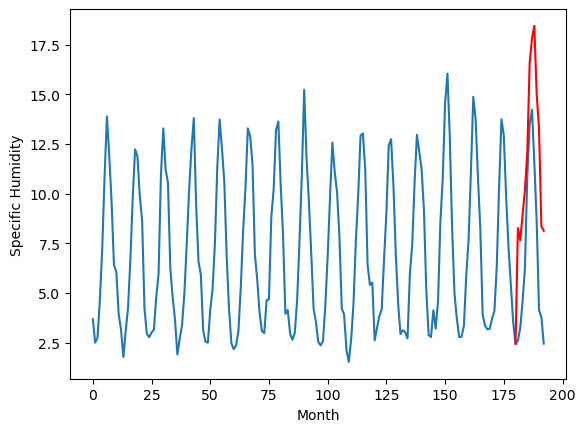

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.82		3.91		0.09
3.80		4.03		0.23
7.09		5.72		-1.37
7.11		6.33		-0.78
10.31		9.26		-1.05
14.20		13.45		-0.75
15.23		14.78		-0.45
14.83		14.80		-0.03
12.69		11.99		-0.70
10.16		10.08		-0.08
4.50		5.16		0.66
7.78		7.31		-0.47
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.65, 3.9107064926624298, 4.027886050343513, 5.720992582440376, 6.32663275539875, 9.258735912442207, 13.453249233365058, 14.782055991292, 14.803482493907213, 11.9900517077744, 10.083190283328294, 5.15525802090764, 7.314692101031541]


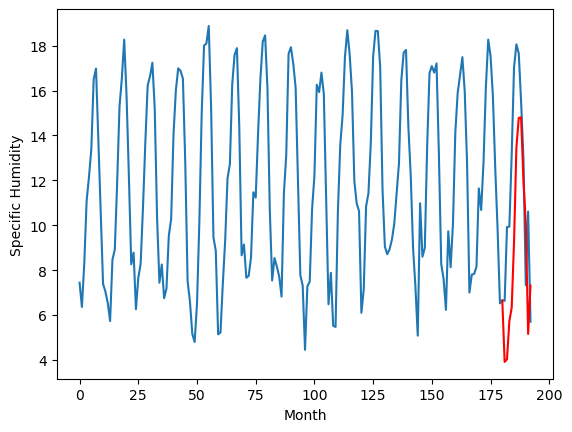

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.31		7.59		0.28
7.26		7.64		0.38
10.25		9.36		-0.89
11.82		10.11		-1.71
16.65		13.03		-3.62
19.29		17.22		-2.07
18.25		18.55		0.30
18.38		18.62		0.24
14.82		15.74		0.92
13.23		13.80		0.57
9.04		8.96		-0.08
11.91		10.85		-1.06
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.19, 7.585637184381485, 7.637720527648926, 9.362011613845826, 10.10898012161255, 13.031229915618898, 17.222321929931642, 18.553092303276063, 18.62330577015877, 15.74413368344307, 13.80171117424965, 8.963917824029924, 10.850655885934831]


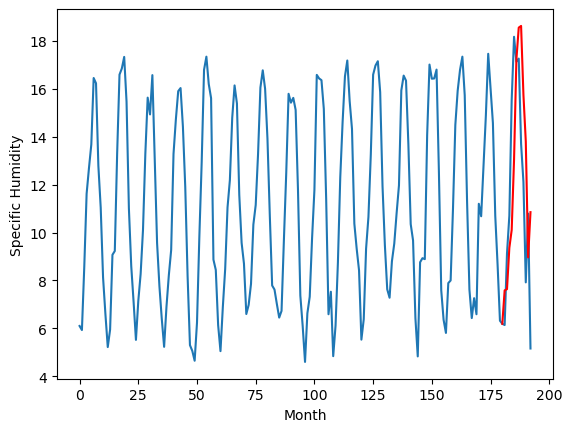

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.00		6.11		0.11
5.67		6.02		0.35
8.53		7.70		-0.83
9.85		8.59		-1.26
14.05		11.35		-2.70
17.80		15.62		-2.18
18.62		16.95		-1.67
19.00		17.13		-1.87
14.55		14.10		-0.45
11.94		12.17		0.23
7.95		7.30		-0.65
10.45		8.76		-1.69
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.78, 6.105738889798522, 6.019690212234854, 7.702484544739127, 8.5895065035671, 11.351303454861045, 15.62284218929708, 16.94733965061605, 17.128958341106774, 14.09807812832296, 12.172017570957543, 7.295992371067406, 8.763797041401268]


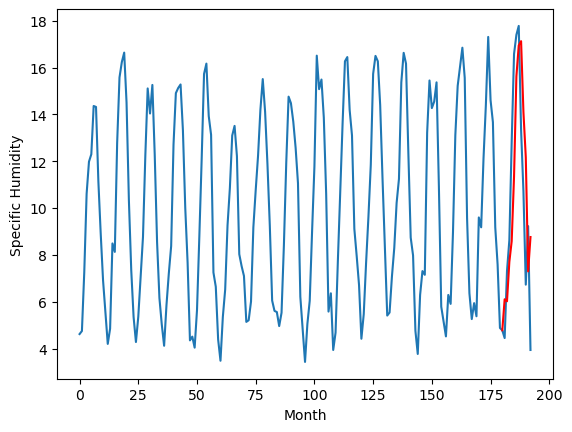

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		4.94		0.04
4.77		4.73		-0.04
4.86		5.52		0.66
5.16		6.33		1.17
5.28		8.80		3.52
7.94		11.32		3.38
13.18		12.66		-0.52
13.47		12.23		-1.24
10.71		10.26		-0.45
7.00		8.50		1.50
5.35		6.76		1.41
5.48		6.20		0.72
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.61, 4.939908738136292, 4.734793971180916, 5.520202766060829, 6.325706253647804, 8.800751696228982, 11.322201023697854, 12.656221280694009, 12.22624770820141, 10.264047185778619, 8.501357952952386, 6.75800184428692, 6.1980786126852045]


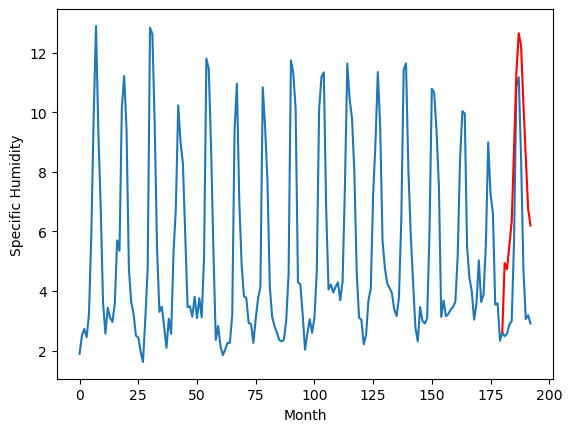

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.74		2.46		-0.28
3.27		2.34		-0.93
3.38		2.51		-0.87
4.70		3.04		-1.66
6.18		5.07		-1.11
7.43		6.90		-0.53
8.58		8.17		-0.41
7.98		7.39		-0.59
7.52		6.01		-1.51
4.72		4.69		-0.03
4.18		4.40		0.22
4.00		3.26		-0.74
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.6, 2.4580168867111203, 2.3372376480698582, 2.5110498884320256, 3.0411235907673833, 5.072074137032032, 6.895842395126819, 8.17287560492754, 7.3888622739911085, 6.014016173183919, 4.694169066250325, 4.4001527050137526, 3.2640005567669874]


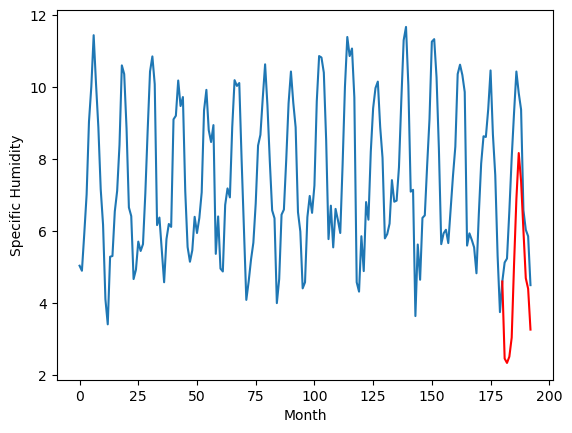

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.92		5.04		0.12
4.99		4.96		-0.03
6.72		6.60		-0.12
7.25		7.39		0.14
9.96		10.04		0.08
14.46		14.49		0.03
15.98		15.80		-0.18
16.56		16.01		-0.55
12.96		12.90		-0.06
10.80		11.06		0.26
5.24		5.87		0.63
7.09		7.57		0.48
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.27, 5.040518625951372, 4.962923906124197, 6.6049024083977566, 7.386158011234365, 10.044593832767568, 14.488826296604238, 15.795851609981618, 16.008542842543683, 12.900359697020612, 11.06487125841435, 5.87186998812016, 7.572166986144147]


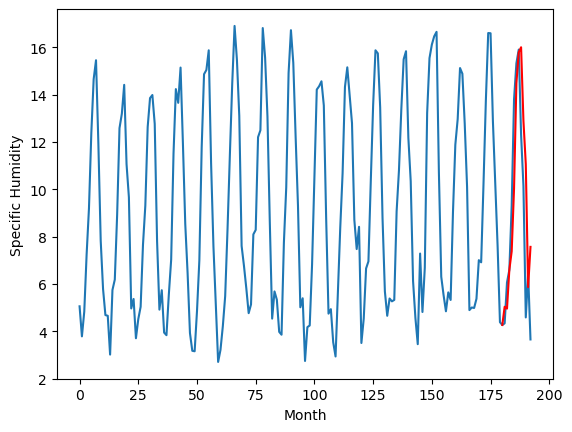

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		4.99		-0.08
5.31		4.85		-0.46
6.34		6.47		0.13
6.95		7.31		0.36
9.62		9.88		0.26
13.72		14.40		0.68
15.13		15.70		0.57
15.52		15.97		0.45
12.31		12.78		0.47
10.58		10.97		0.39
5.22		5.71		0.49
6.78		7.24		0.46
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.91, 4.989757706820964, 4.8496663621068, 6.472851996719837, 7.314691369831562, 9.884159629642962, 14.39861208707094, 15.698089545071124, 15.973580067455767, 12.779976074993609, 10.968170349895953, 5.70715016633272, 7.244872873127459]


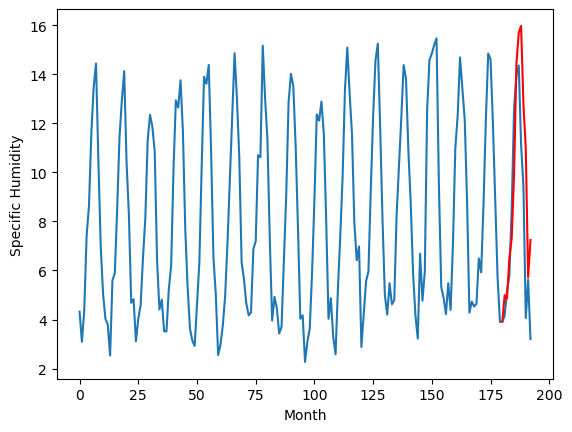

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.83   5.089829
1                 1    4.92   5.057182
2                 2    2.95   2.590220
3                 3    7.70   8.271629
4                 4    3.82   3.910706
5                 5    7.31   7.585637
6                 6    6.00   6.105739
7                 7    4.90   4.939909
8                 8    2.74   2.458017
9                 9    4.92   5.040519
10               10    5.07   4.989758


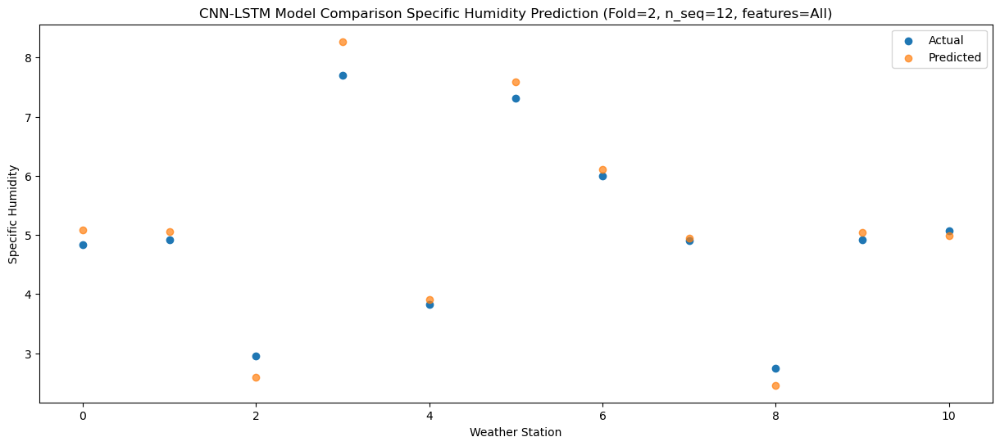

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.11   5.038775
1                 1    4.24   4.712831
2                 2    5.08   2.628094
3                 3    7.87   7.654009
4                 4    3.80   4.027886
5                 5    7.26   7.637721
6                 6    5.67   6.019690
7                 7    4.77   4.734794
8                 8    3.27   2.337238
9                 9    4.99   4.962924
10               10    5.31   4.849666


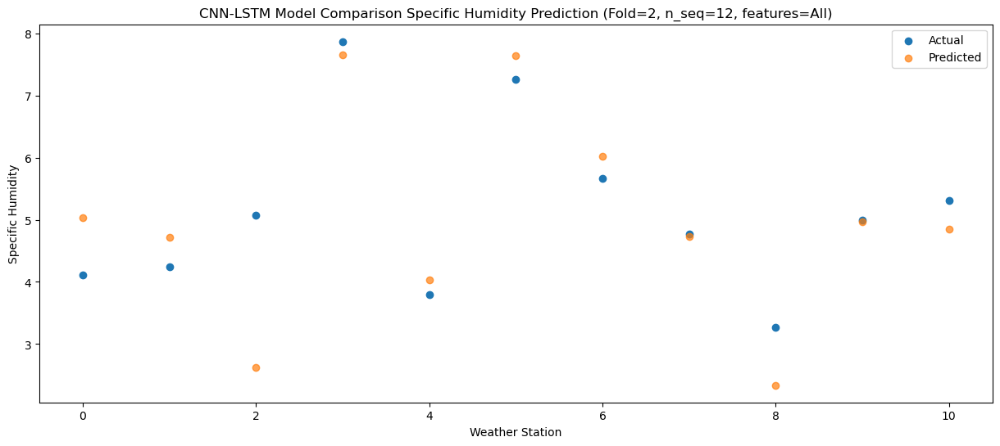

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.39   6.697584
1                 1    6.09   5.617301
2                 2    5.30   4.331684
3                 3    8.51   8.936626
4                 4    7.09   5.720993
5                 5   10.25   9.362012
6                 6    8.53   7.702485
7                 7    4.86   5.520203
8                 8    3.38   2.511050
9                 9    6.72   6.604902
10               10    6.34   6.472852


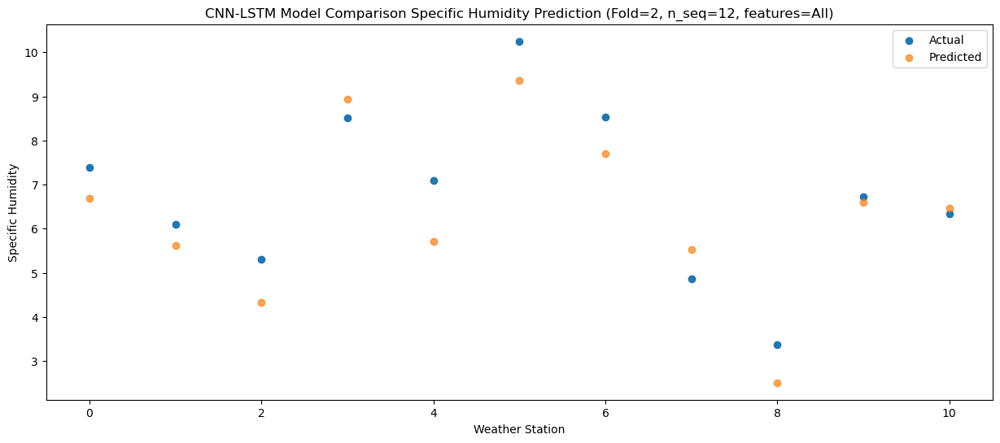

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.78   7.467512
1                 1    6.21   6.546835
2                 2    6.27   5.062784
3                 3    9.86  10.192316
4                 4    7.11   6.326633
5                 5   11.82  10.108980
6                 6    9.85   8.589507
7                 7    5.16   6.325706
8                 8    4.70   3.041124
9                 9    7.25   7.386158
10               10    6.95   7.314691


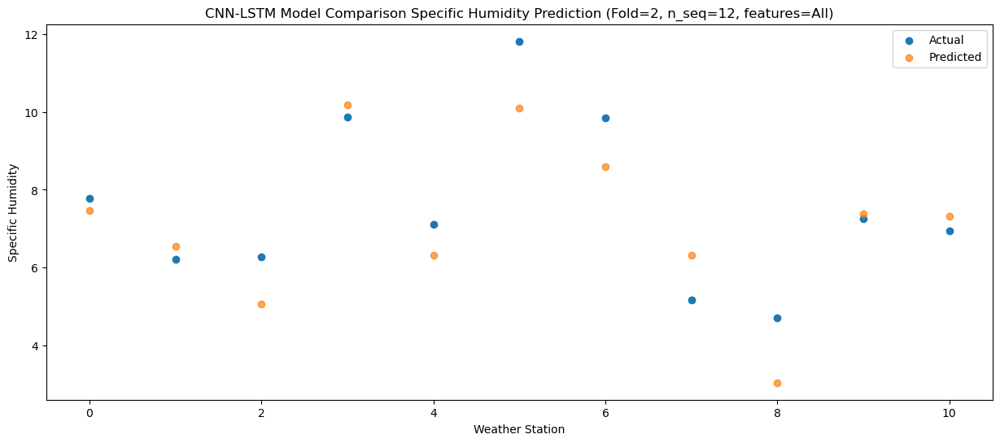

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.45  10.177964
1                 1   11.33   8.859537
2                 2    7.58   7.934938
3                 3   11.54  12.086093
4                 4   10.31   9.258736
5                 5   16.65  13.031230
6                 6   14.05  11.351303
7                 7    5.28   8.800752
8                 8    6.18   5.072074
9                 9    9.96  10.044594
10               10    9.62   9.884160


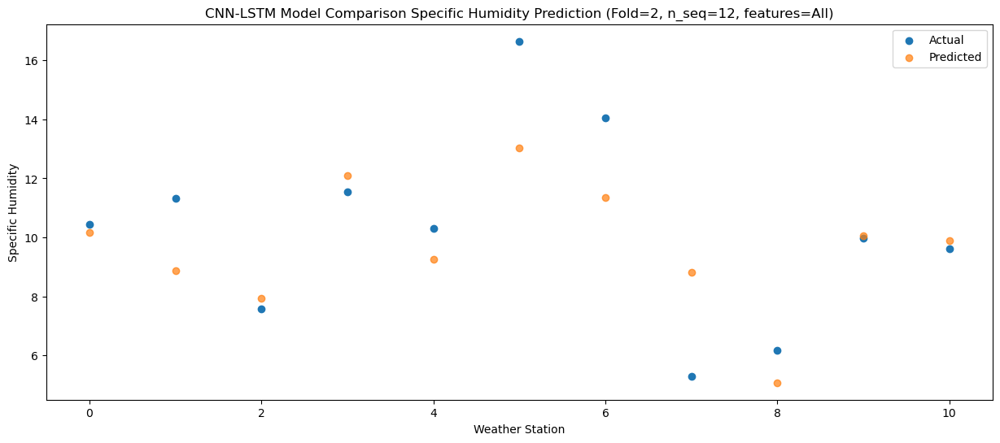

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   15.10  14.574813
1                 1   14.24  11.847871
2                 2   11.36  12.175546
3                 3   16.14  16.548439
4                 4   14.20  13.453249
5                 5   19.29  17.222322
6                 6   17.80  15.622842
7                 7    7.94  11.322201
8                 8    7.43   6.895842
9                 9   14.46  14.488826
10               10   13.72  14.398612


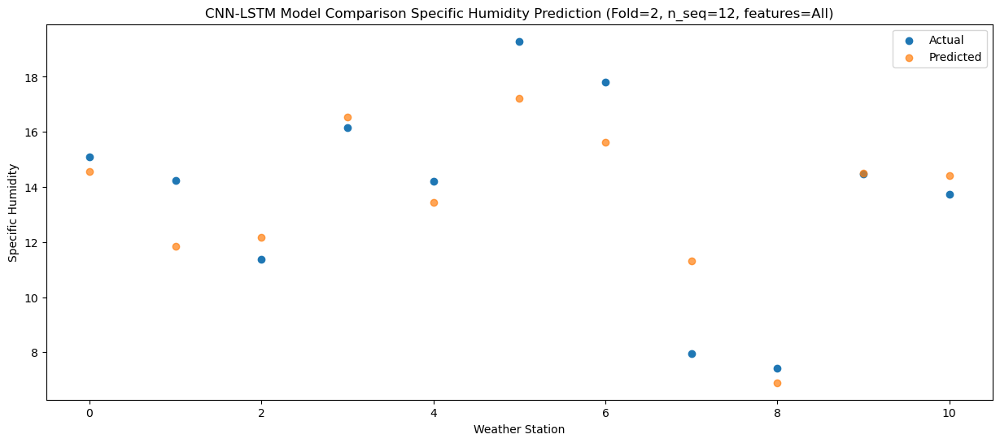

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   17.20  15.886251
1                 1   15.85  13.173209
2                 2   11.76  13.502679
3                 3   18.74  17.816278
4                 4   15.23  14.782056
5                 5   18.25  18.553092
6                 6   18.62  16.947340
7                 7   13.18  12.656221
8                 8    8.58   8.172876
9                 9   15.98  15.795852
10               10   15.13  15.698090


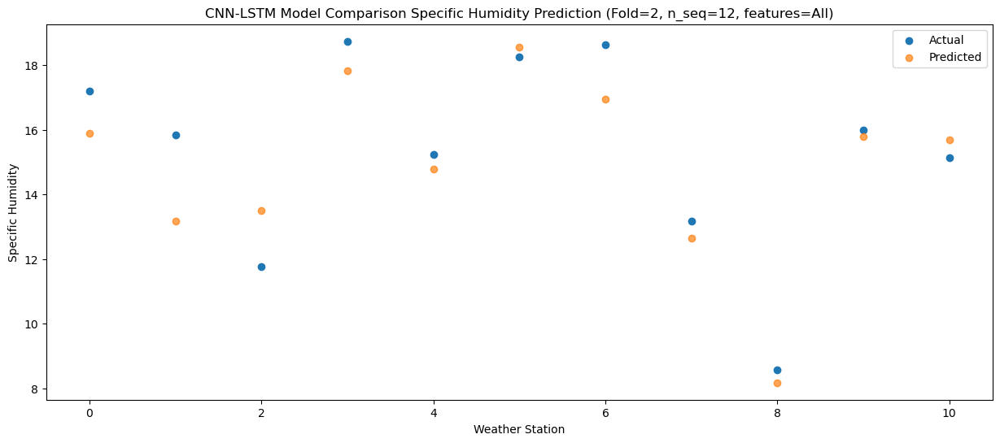

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.90  16.070511
1                 1   14.23  13.028118
2                 2   12.38  13.592906
3                 3   19.48  18.435111
4                 4   14.83  14.803482
5                 5   18.38  18.623306
6                 6   19.00  17.128958
7                 7   13.47  12.226248
8                 8    7.98   7.388862
9                 9   16.56  16.008543
10               10   15.52  15.973580


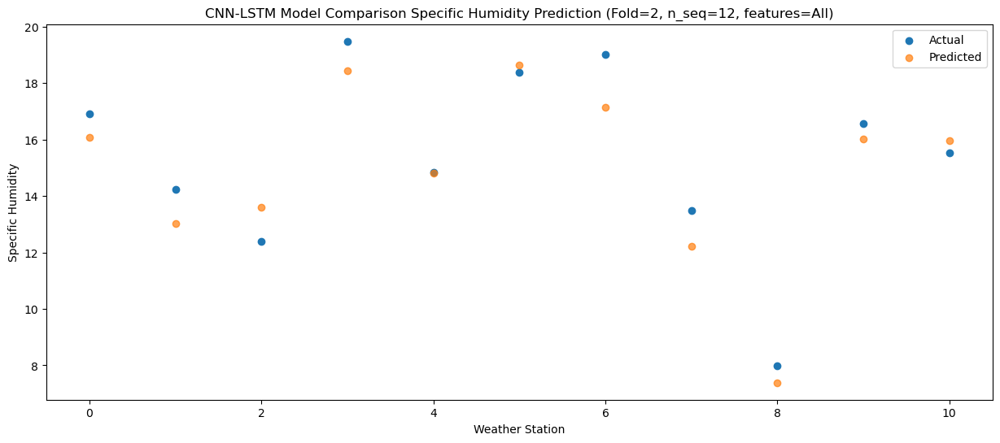

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   13.13  13.006898
1                 1   11.41  10.685407
2                 2   11.10  10.679459
3                 3   16.82  14.984934
4                 4   12.69  11.990052
5                 5   14.82  15.744134
6                 6   14.55  14.098078
7                 7   10.71  10.264047
8                 8    7.52   6.014016
9                 9   12.96  12.900360
10               10   12.31  12.779976


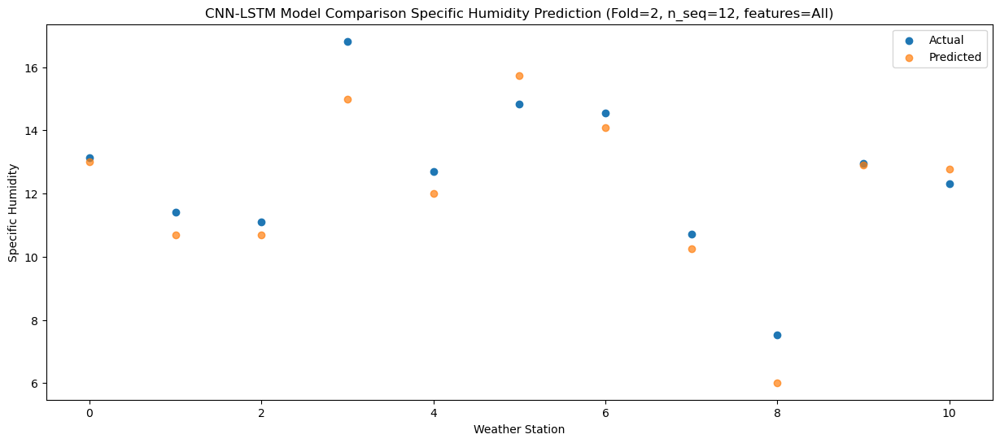

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.68  11.149544
1                 1    8.02   8.903383
2                 2    8.44   8.762752
3                 3   13.86  13.284255
4                 4   10.16  10.083190
5                 5   13.23  13.801711
6                 6   11.94  12.172018
7                 7    7.00   8.501358
8                 8    4.72   4.694169
9                 9   10.80  11.064871
10               10   10.58  10.968170


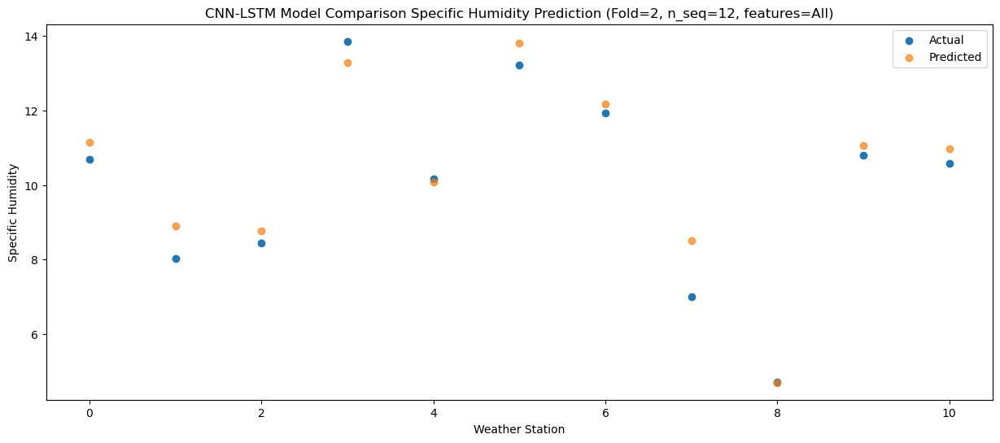

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.49   6.017253
1                 1    5.59   6.360999
2                 2    4.49   3.843346
3                 3    9.41   8.357198
4                 4    4.50   5.155258
5                 5    9.04   8.963918
6                 6    7.95   7.295992
7                 7    5.35   6.758002
8                 8    4.18   4.400153
9                 9    5.24   5.871870
10               10    5.22   5.707150


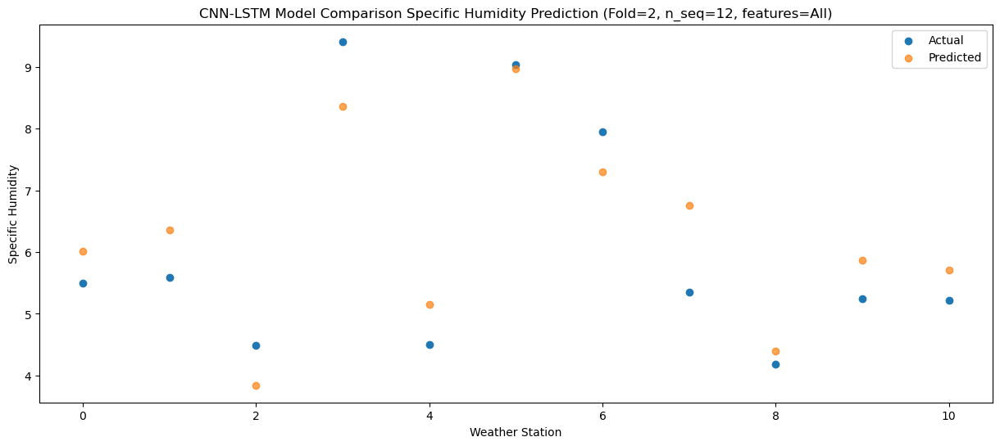

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.89   7.764304
1                 1    4.53   5.782082
2                 2    5.89   5.735522
3                 3    9.05   8.135290
4                 4    7.78   7.314692
5                 5   11.91  10.850656
6                 6   10.45   8.763797
7                 7    5.48   6.198079
8                 8    4.00   3.264001
9                 9    7.09   7.572167
10               10    6.78   7.244873


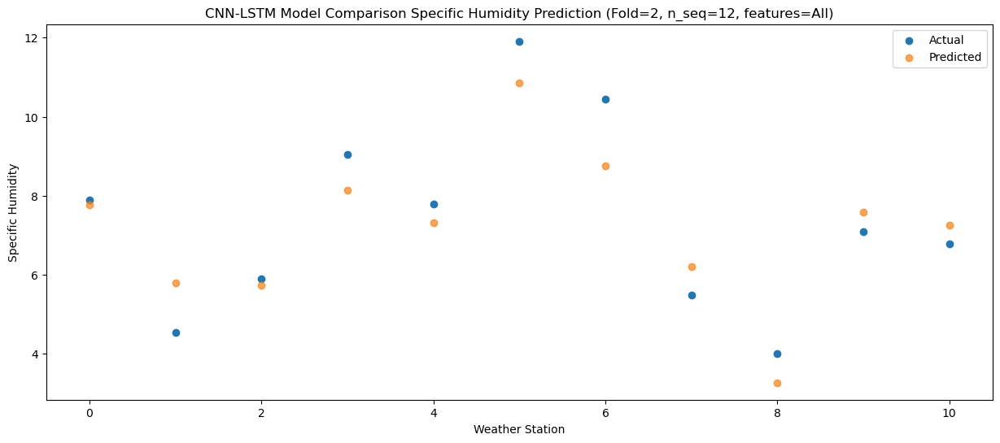

f, t:
[[ 4.83  4.92  2.95  7.7   3.82  7.31  6.    4.9   2.74  4.92  5.07]
 [ 4.11  4.24  5.08  7.87  3.8   7.26  5.67  4.77  3.27  4.99  5.31]
 [ 7.39  6.09  5.3   8.51  7.09 10.25  8.53  4.86  3.38  6.72  6.34]
 [ 7.78  6.21  6.27  9.86  7.11 11.82  9.85  5.16  4.7   7.25  6.95]
 [10.45 11.33  7.58 11.54 10.31 16.65 14.05  5.28  6.18  9.96  9.62]
 [15.1  14.24 11.36 16.14 14.2  19.29 17.8   7.94  7.43 14.46 13.72]
 [17.2  15.85 11.76 18.74 15.23 18.25 18.62 13.18  8.58 15.98 15.13]
 [16.9  14.23 12.38 19.48 14.83 18.38 19.   13.47  7.98 16.56 15.52]
 [13.13 11.41 11.1  16.82 12.69 14.82 14.55 10.71  7.52 12.96 12.31]
 [10.68  8.02  8.44 13.86 10.16 13.23 11.94  7.    4.72 10.8  10.58]
 [ 5.49  5.59  4.49  9.41  4.5   9.04  7.95  5.35  4.18  5.24  5.22]
 [ 7.89  4.53  5.89  9.05  7.78 11.91 10.45  5.48  4.    7.09  6.78]]
[[ 5.08982873  5.05718172  2.59021968  8.27162906  3.91070649  7.58563718
   6.10573889  4.93990874  2.45801689  5.04051863  4.98975771]
 [ 5.03877498  4.71283147  2

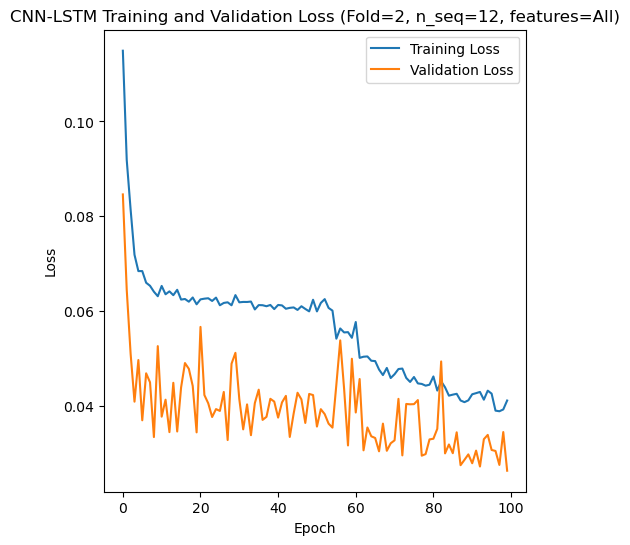

[[ 5.11  3.7   4.74 ... 13.5   8.68  7.66]
 [ 3.73  2.91  5.05 ... 11.19  6.96  6.57]
 [ 5.56  5.41  5.55 ...  8.56  7.45  5.59]
 ...
 [ 2.73  2.21  3.23 ...  5.    3.95  3.09]
 [ 5.93  5.59  5.49 ...  8.63  7.04  6.11]
 [ 3.71  2.55  2.84 ...  9.78  6.68  4.77]]
Epoch 1/100
84/84 [==============================] - 41s 206ms/step - loss: 0.1172 - accuracy: 0.5357 - mae: 0.0969 - rmse: 0.1172 - mape: 21.0317 - pearson: 0.6686 - val_loss: 0.0990 - val_accuracy: 0.9000 - val_mae: 0.0799 - val_rmse: 0.0990 - val_mape: 17.1353 - val_pearson: 0.6638
Epoch 2/100
84/84 [==============================] - 11s 129ms/step - loss: 0.0815 - accuracy: 0.7262 - mae: 0.0672 - rmse: 0.0815 - mape: 14.5553 - pearson: 0.8119 - val_loss: 0.0831 - val_accuracy: 0.9000 - val_mae: 0.0643 - val_rmse: 0.0831 - val_mape: 14.0473 - val_pearson: 0.6820
Epoch 3/100
84/84 [==============================] - 11s 132ms/step - loss: 0.0786 - accuracy: 0.7381 - mae: 0.0642 - rmse: 0.0786 - mape: 13.9312 - pearson: 0.8111

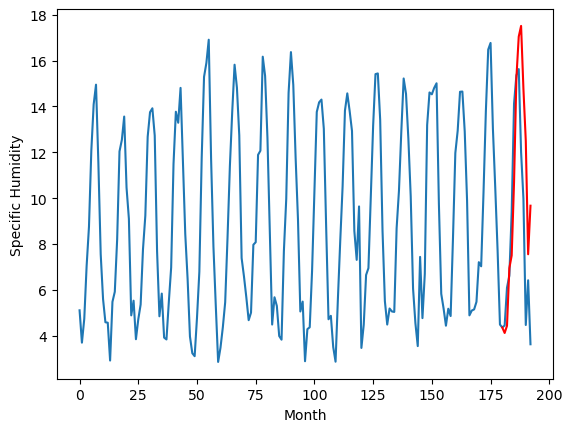

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.02		5.37		0.35
4.46		5.33		0.87
6.97		7.99		1.02
8.14		8.82		0.68
11.66		12.54		0.88
16.19		16.33		0.14
17.07		17.68		0.61
17.24		17.83		0.59
13.27		14.58		1.31
11.08		11.96		0.88
6.65		7.96		1.31
7.62		9.47		1.85
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.43, 5.3653066909313205, 5.33183495759964, 7.986438200473786, 8.823947117328643, 12.544227526187896, 16.333980247974395, 17.682333753108978, 17.83257675230503, 14.58181762754917, 11.95927262365818, 7.960561991333961, 9.474760175347328]


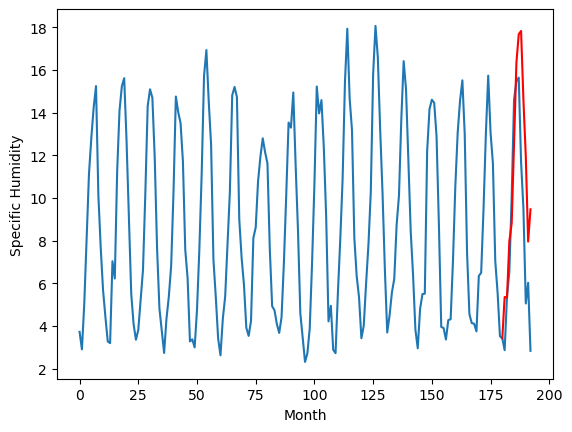

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.17		4.05		-0.12
4.11		3.77		-0.34
4.19		4.62		0.43
4.81		4.64		-0.17
5.21		6.06		0.85
7.66		8.05		0.39
8.36		8.99		0.63
7.89		8.60		0.71
6.60		7.45		0.85
5.46		5.96		0.50
6.04		5.06		-0.98
4.54		4.28		-0.26
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.43, 4.0529924440383915, 3.7695375490188603, 4.620672326087952, 4.640304287448526, 6.057201107516885, 8.045107682719827, 8.989297708049417, 8.602475842013956, 7.447684963718057, 5.959251960292459, 5.0581765375286345, 4.279193779006601]


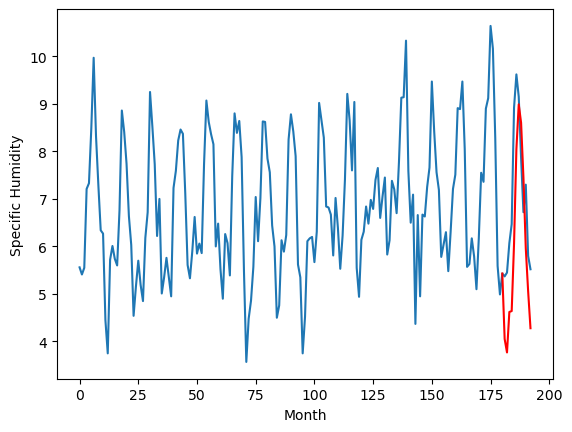

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.29		5.83		0.54
5.22		5.99		0.77
6.52		8.18		1.66
7.71		9.15		1.44
10.24		11.92		1.68
15.66		16.74		1.08
16.29		18.62		2.33
17.17		19.41		2.24
13.70		16.40		2.70
11.64		14.42		2.78
5.95		9.37		3.42
7.09		10.69		3.60
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.21, 5.832912859916687, 5.985659835338592, 8.176163671016692, 9.145474669933318, 11.922165629863738, 16.7405722117424, 18.622529504299163, 19.408924338817595, 16.403941390514373, 14.424907801151274, 9.367076513767241, 10.68882214784622]


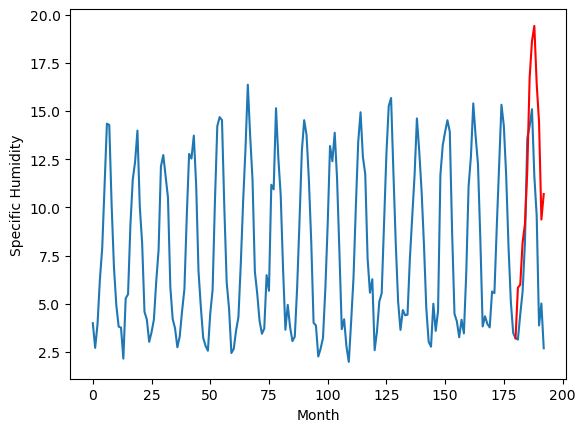

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.79		4.20		0.41
2.96		4.20		1.24
5.44		6.39		0.95
6.50		7.47		0.97
8.92		10.36		1.44
13.38		14.88		1.50
15.33		16.61		1.28
15.42		17.29		1.87
11.65		14.17		2.52
9.70		12.11		2.41
4.58		7.50		2.92
5.28		8.43		3.15
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.04, 4.199040105342865, 4.203956597261131, 6.394067757539451, 7.46966933529824, 10.36412381451577, 14.878739827089012, 16.609121315889062, 17.28963457863778, 14.174363010339441, 12.109303348474207, 7.4980033568665405, 8.433436208181085]


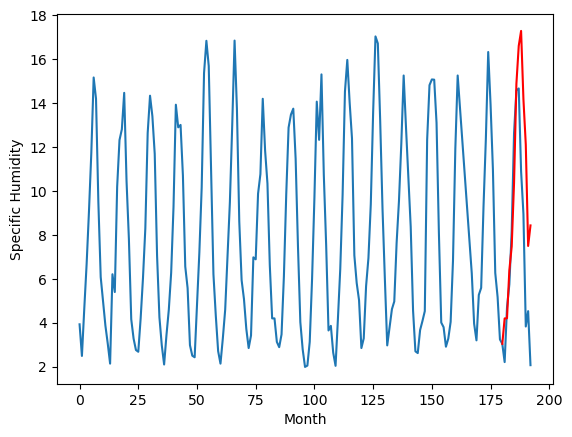

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.62		4.16		0.54
3.10		4.26		1.16
5.13		6.42		1.29
6.43		7.46		1.03
8.67		10.20		1.53
13.89		14.98		1.09
15.14		16.82		1.68
15.31		17.62		2.31
12.01		14.57		2.56
10.39		12.60		2.21
4.52		7.64		3.12
5.57		8.78		3.21
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.91, 4.162776671648025, 4.260514416098594, 6.415606655478477, 7.461953200697899, 10.204711951613426, 14.97591642320156, 16.821395911574363, 17.622774042487144, 14.566272892355919, 12.602802671790123, 7.636219896674156, 8.784295715689659]


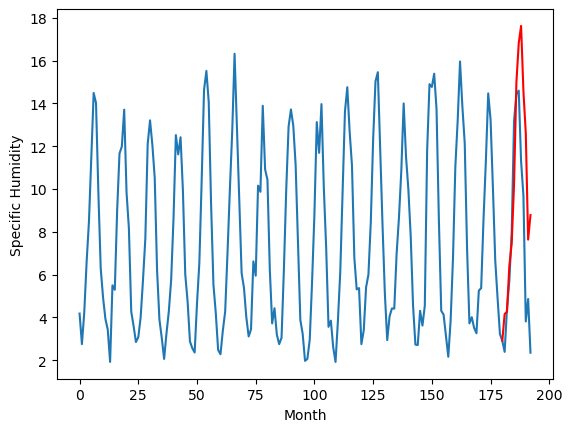

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.35		4.59		0.24
4.41		4.31		-0.10
4.72		5.73		1.01
5.19		5.86		0.67
6.59		8.31		1.72
7.92		10.63		2.71
10.37		11.80		1.43
8.94		11.37		2.43
7.24		9.74		2.50
6.15		7.78		1.63
5.44		6.51		1.07
4.73		5.87		1.14
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.6, 4.5942445921897885, 4.3140579390525815, 5.725430481433868, 5.862720467448234, 8.30745051085949, 10.625259854197502, 11.795201517939567, 11.367698230147361, 9.739500083327293, 7.784640945792198, 6.509098805785179, 5.867552139163017]


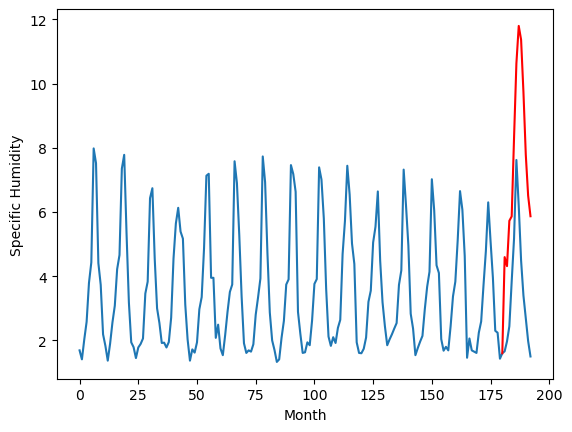

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.50		2.02		-0.48
2.02		1.73		-0.29
2.32		2.68		0.36
2.01		2.72		0.71
2.57		4.32		1.75
3.99		6.35		2.36
9.35		7.31		-2.04
6.92		6.92		-0.00
5.20		5.66		0.46
4.10		4.09		-0.01
2.83		3.13		0.30
2.97		2.38		-0.59
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.86, 2.0228198194503784, 1.73366135597229, 2.679016354084015, 2.7237093770503997, 4.318084152936935, 6.3485139930248256, 7.3145630681514735, 6.917610260248184, 5.662659736871719, 4.087997051477432, 3.1284426176548, 2.3752165758609767]


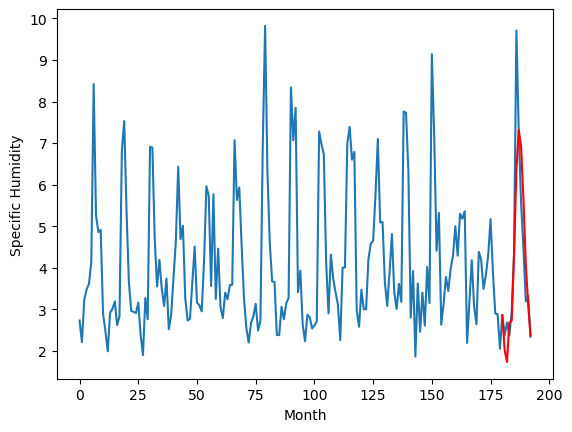

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.40		3.06		-0.34
3.05		2.78		-0.27
2.70		3.67		0.97
3.63		3.69		0.06
4.07		5.18		1.11
5.50		7.19		1.69
5.98		8.15		2.17
6.37		7.76		1.39
5.73		6.58		0.85
4.70		5.06		0.36
4.92		4.14		-0.78
3.67		3.37		-0.30
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.65, 3.062492083311081, 2.7813579547405243, 3.6692761290073395, 3.69055162884295, 5.176598896756769, 7.18591295696795, 8.149926950708032, 7.75792794443667, 6.582524707093835, 5.06428711630404, 4.1447223923355345, 3.371849765554071]


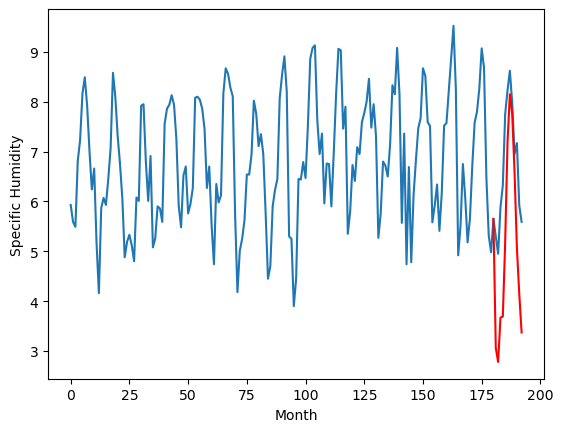

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		5.86		1.02
4.99		5.64		0.65
5.77		7.30		1.53
7.15		8.81		1.66
8.72		10.78		2.06
13.62		15.38		1.76
15.83		17.07		1.24
16.21		18.13		1.92
13.61		15.05		1.44
11.07		13.50		2.43
6.54		9.02		2.48
6.24		8.91		2.67
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.54, 5.860926322937011, 5.644210197329521, 7.3007232922315595, 8.811100699305534, 10.775149800181389, 15.375020005106926, 17.0726669806242, 18.132779576182365, 15.050917841792106, 13.502628065943718, 9.019947745203972, 8.914755374491214]


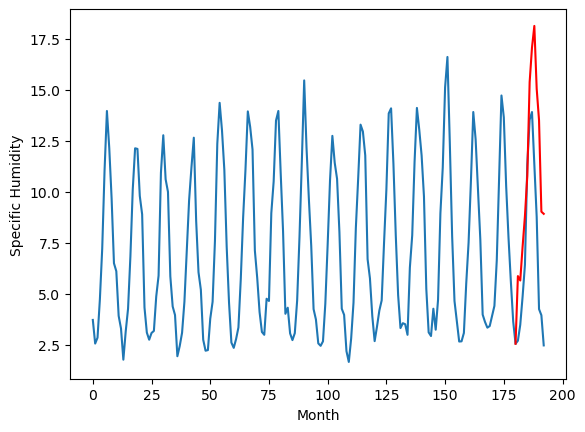

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.02		3.64		0.62
2.88		3.45		0.57
4.16		5.15		0.99
5.57		6.69		1.12
7.16		8.70		1.54
12.03		13.41		1.38
13.72		15.14		1.42
14.04		16.24		2.20
11.12		13.09		1.97
9.22		11.52		2.30
4.30		6.86		2.56
4.20		6.87		2.67
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.51, 3.6431654012203216, 3.449712119102478, 5.1548044300079345, 6.689796290397644, 8.70392879009247, 13.41353400707245, 15.140964827537537, 16.241256198883057, 13.085627994537354, 11.515515408515931, 6.8600951051712045, 6.869584500826896]


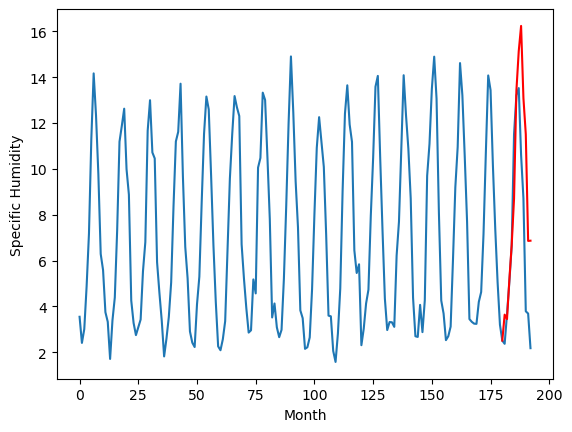

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.58   4.122175
1                 1    5.02   5.365307
2                 2    4.17   4.052992
3                 3    5.29   5.832913
4                 4    3.79   4.199040
5                 5    3.62   4.162777
6                 6    4.35   4.594245
7                 7    2.50   2.022820
8                 8    3.40   3.062492
9                 9    4.84   5.860926
10               10    3.02   3.643165


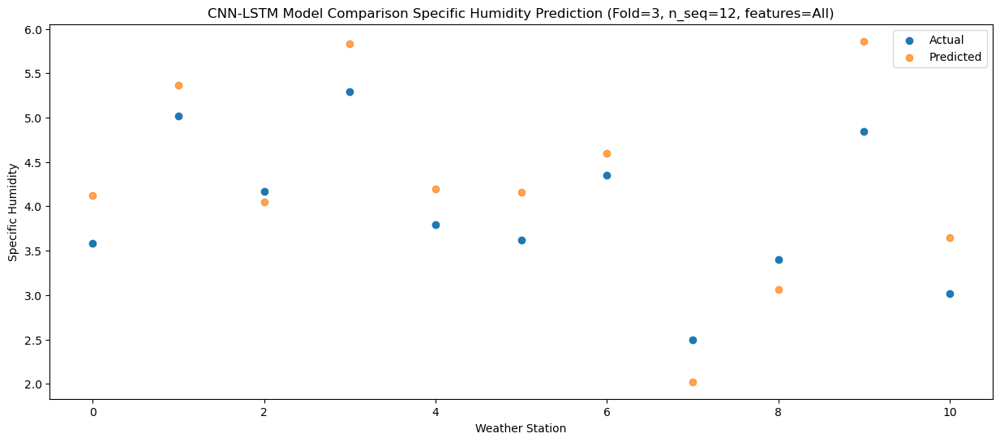

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   4.436332
1                 1    4.46   5.331835
2                 2    4.11   3.769538
3                 3    5.22   5.985660
4                 4    2.96   4.203957
5                 5    3.10   4.260514
6                 6    4.41   4.314058
7                 7    2.02   1.733661
8                 8    3.05   2.781358
9                 9    4.99   5.644210
10               10    2.88   3.449712


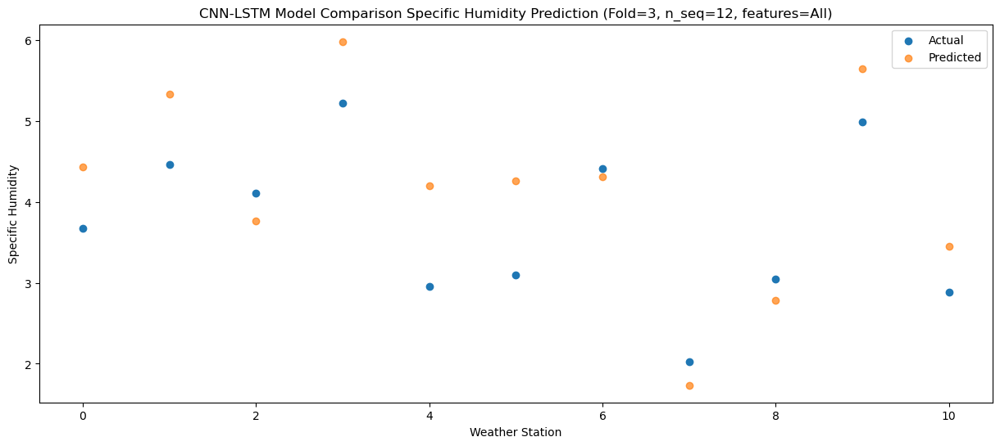

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    5.32   6.949008
1                 1    6.97   7.986438
2                 2    4.19   4.620672
3                 3    6.52   8.176164
4                 4    5.44   6.394068
5                 5    5.13   6.415607
6                 6    4.72   5.725430
7                 7    2.32   2.679016
8                 8    2.70   3.669276
9                 9    5.77   7.300723
10               10    4.16   5.154804


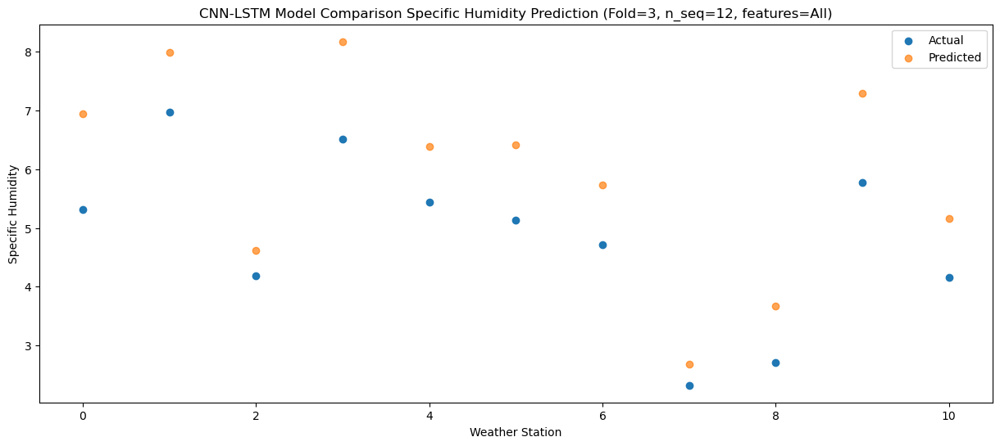

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    5.84   7.504108
1                 1    8.14   8.823947
2                 2    4.81   4.640304
3                 3    7.71   9.145475
4                 4    6.50   7.469669
5                 5    6.43   7.461953
6                 6    5.19   5.862720
7                 7    2.01   2.723709
8                 8    3.63   3.690552
9                 9    7.15   8.811101
10               10    5.57   6.689796


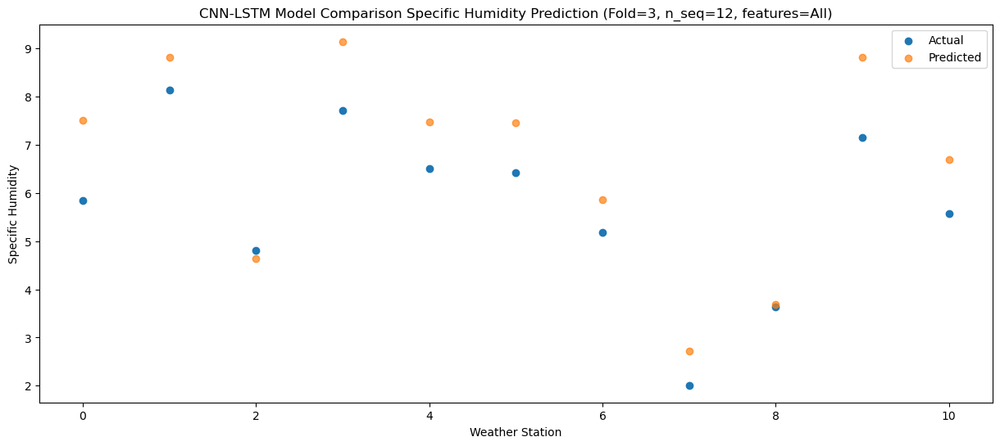

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    8.62  10.697096
1                 1   11.66  12.544228
2                 2    5.21   6.057201
3                 3   10.24  11.922166
4                 4    8.92  10.364124
5                 5    8.67  10.204712
6                 6    6.59   8.307451
7                 7    2.57   4.318084
8                 8    4.07   5.176599
9                 9    8.72  10.775150
10               10    7.16   8.703929


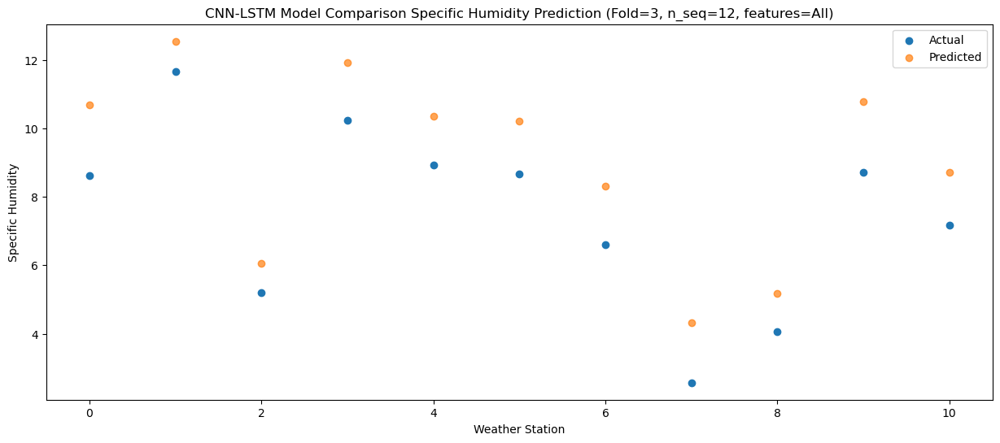

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   13.34  15.240278
1                 1   16.19  16.333980
2                 2    7.66   8.045108
3                 3   15.66  16.740572
4                 4   13.38  14.878740
5                 5   13.89  14.975916
6                 6    7.92  10.625260
7                 7    3.99   6.348514
8                 8    5.50   7.185913
9                 9   13.62  15.375020
10               10   12.03  13.413534


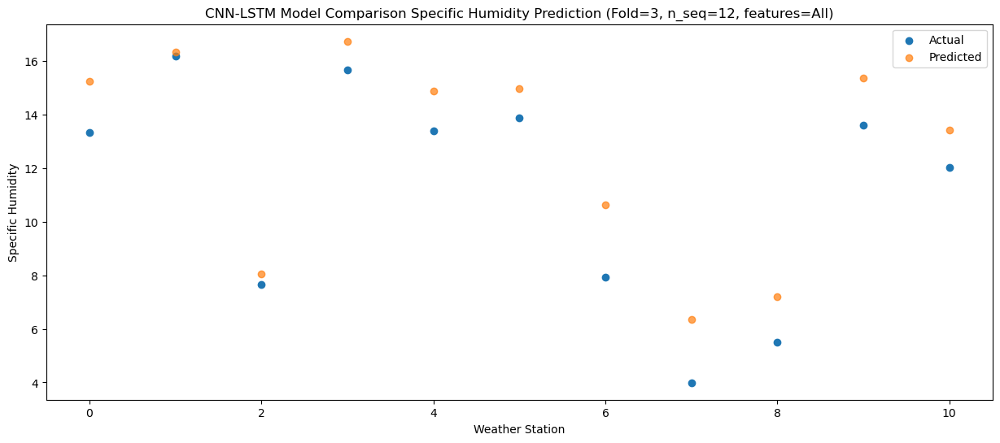

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   14.58  17.045546
1                 1   17.07  17.682334
2                 2    8.36   8.989298
3                 3   16.29  18.622530
4                 4   15.33  16.609121
5                 5   15.14  16.821396
6                 6   10.37  11.795202
7                 7    9.35   7.314563
8                 8    5.98   8.149927
9                 9   15.83  17.072667
10               10   13.72  15.140965


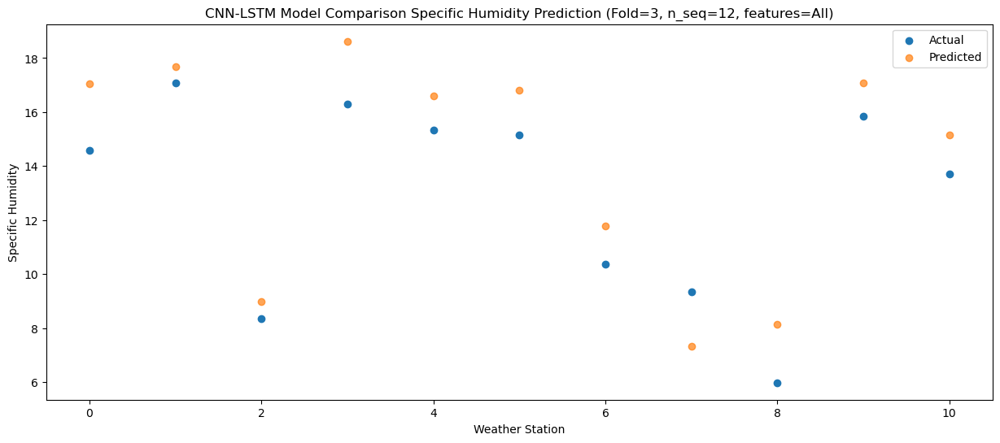

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   14.85  17.511514
1                 1   17.24  17.832577
2                 2    7.89   8.602476
3                 3   17.17  19.408924
4                 4   15.42  17.289635
5                 5   15.31  17.622774
6                 6    8.94  11.367698
7                 7    6.92   6.917610
8                 8    6.37   7.757928
9                 9   16.21  18.132780
10               10   14.04  16.241256


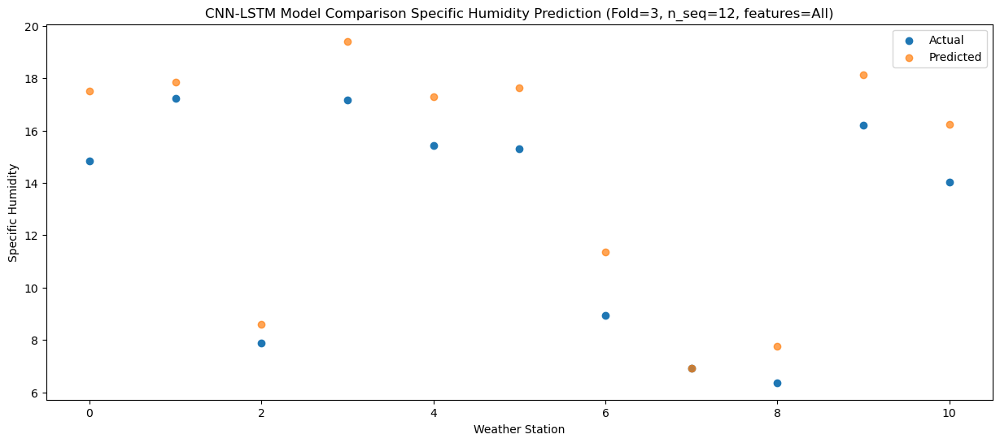

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   11.23  14.758810
1                 1   13.27  14.581818
2                 2    6.60   7.447685
3                 3   13.70  16.403941
4                 4   11.65  14.174363
5                 5   12.01  14.566273
6                 6    7.24   9.739500
7                 7    5.20   5.662660
8                 8    5.73   6.582525
9                 9   13.61  15.050918
10               10   11.12  13.085628


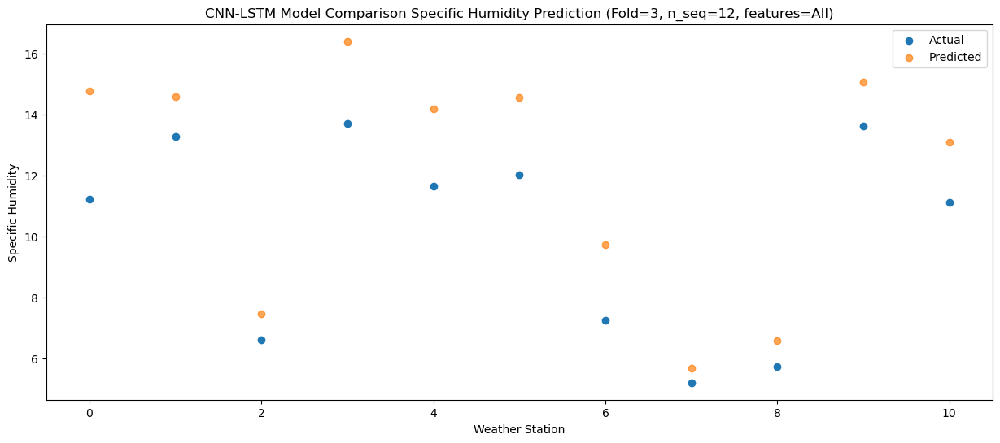

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0    9.19  12.497154
1                 1   11.08  11.959273
2                 2    5.46   5.959252
3                 3   11.64  14.424908
4                 4    9.70  12.109303
5                 5   10.39  12.602803
6                 6    6.15   7.784641
7                 7    4.10   4.087997
8                 8    4.70   5.064287
9                 9   11.07  13.502628
10               10    9.22  11.515515


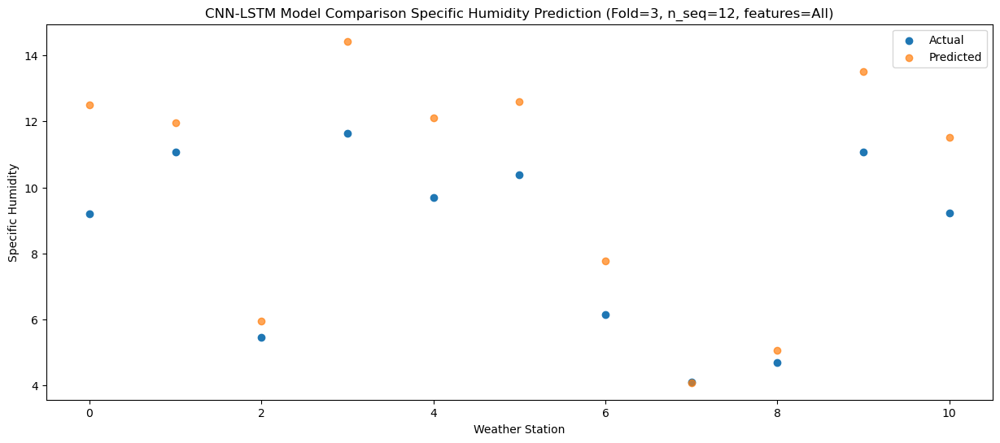

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    3.69   7.554678
1                 1    6.65   7.960562
2                 2    6.04   5.058177
3                 3    5.95   9.367077
4                 4    4.58   7.498003
5                 5    4.52   7.636220
6                 6    5.44   6.509099
7                 7    2.83   3.128443
8                 8    4.92   4.144722
9                 9    6.54   9.019948
10               10    4.30   6.860095


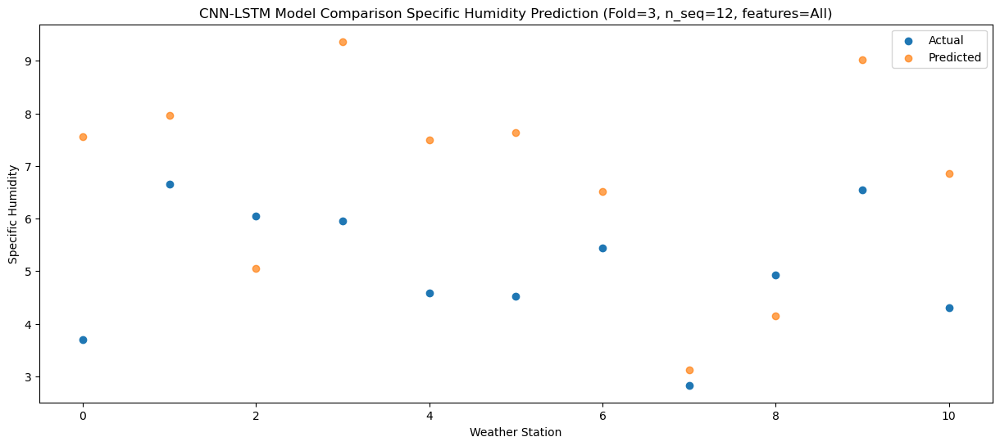

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    5.64   9.672281
1                 1    7.62   9.474760
2                 2    4.54   4.279194
3                 3    7.09  10.688822
4                 4    5.28   8.433436
5                 5    5.57   8.784296
6                 6    4.73   5.867552
7                 7    2.97   2.375217
8                 8    3.67   3.371850
9                 9    6.24   8.914755
10               10    4.20   6.869585


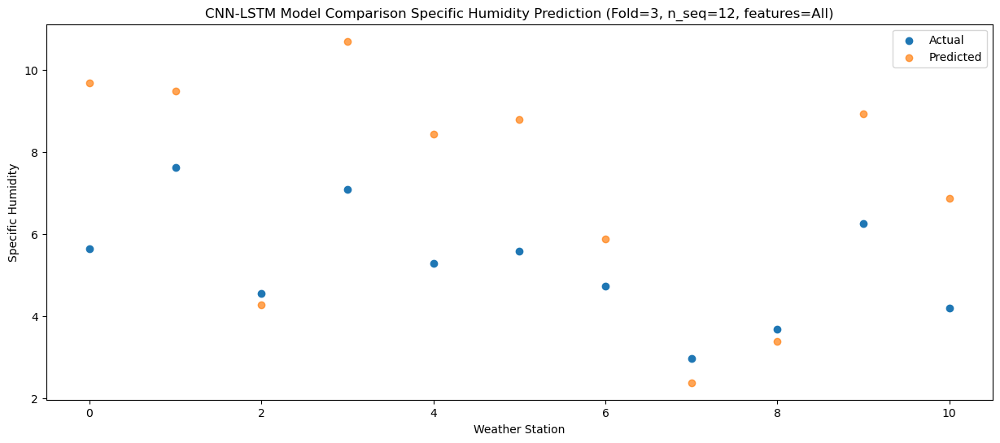

f, t:
[[ 3.58  5.02  4.17  5.29  3.79  3.62  4.35  2.5   3.4   4.84  3.02]
 [ 3.67  4.46  4.11  5.22  2.96  3.1   4.41  2.02  3.05  4.99  2.88]
 [ 5.32  6.97  4.19  6.52  5.44  5.13  4.72  2.32  2.7   5.77  4.16]
 [ 5.84  8.14  4.81  7.71  6.5   6.43  5.19  2.01  3.63  7.15  5.57]
 [ 8.62 11.66  5.21 10.24  8.92  8.67  6.59  2.57  4.07  8.72  7.16]
 [13.34 16.19  7.66 15.66 13.38 13.89  7.92  3.99  5.5  13.62 12.03]
 [14.58 17.07  8.36 16.29 15.33 15.14 10.37  9.35  5.98 15.83 13.72]
 [14.85 17.24  7.89 17.17 15.42 15.31  8.94  6.92  6.37 16.21 14.04]
 [11.23 13.27  6.6  13.7  11.65 12.01  7.24  5.2   5.73 13.61 11.12]
 [ 9.19 11.08  5.46 11.64  9.7  10.39  6.15  4.1   4.7  11.07  9.22]
 [ 3.69  6.65  6.04  5.95  4.58  4.52  5.44  2.83  4.92  6.54  4.3 ]
 [ 5.64  7.62  4.54  7.09  5.28  5.57  4.73  2.97  3.67  6.24  4.2 ]]
[[ 4.1221747   5.36530669  4.05299244  5.83291286  4.19904011  4.16277667
   4.59424459  2.02281982  3.06249208  5.86092632  3.6431654 ]
 [ 4.43633168  5.33183496  3

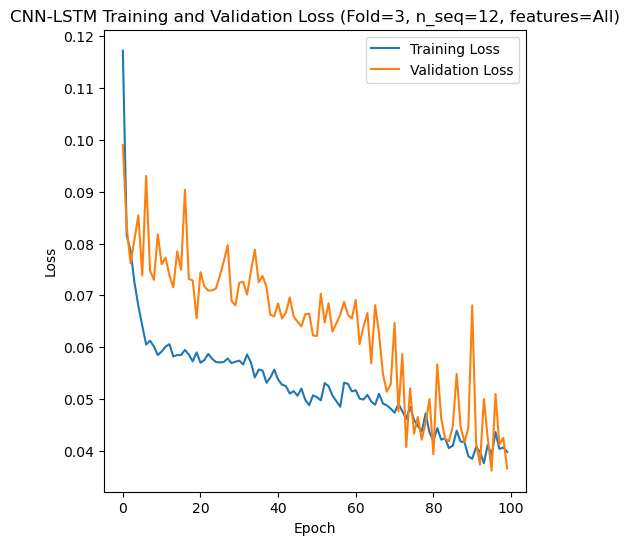

[[ 3.4   2.19  4.28 ... 10.54  6.41  5.39]
 [ 7.94  7.22  7.86 ... 18.27 13.85 11.85]
 [ 5.92  4.91  6.84 ... 14.38  9.59 10.48]
 ...
 [ 3.92  3.    4.93 ... 11.51  7.19  6.46]
 [ 3.98  2.61  4.   ... 10.23  6.65  5.8 ]
 [ 3.84  2.35  4.25 ... 10.6   6.5   5.9 ]]
Epoch 1/100
84/84 [==============================] - 41s 213ms/step - loss: 0.1198 - accuracy: 0.5595 - mae: 0.1014 - rmse: 0.1198 - mape: 21.9080 - pearson: 0.6400 - val_loss: 0.0794 - val_accuracy: 0.8000 - val_mae: 0.0628 - val_rmse: 0.0794 - val_mape: 13.8627 - val_pearson: 0.7498
Epoch 2/100
84/84 [==============================] - 11s 130ms/step - loss: 0.0889 - accuracy: 0.6667 - mae: 0.0723 - rmse: 0.0889 - mape: 15.8385 - pearson: 0.7462 - val_loss: 0.0752 - val_accuracy: 0.8000 - val_mae: 0.0635 - val_rmse: 0.0752 - val_mape: 14.0173 - val_pearson: 0.7633
Epoch 3/100
84/84 [==============================] - 11s 127ms/step - loss: 0.0805 - accuracy: 0.7381 - mae: 0.0655 - rmse: 0.0805 - mape: 14.6111 - pearson: 0.7709

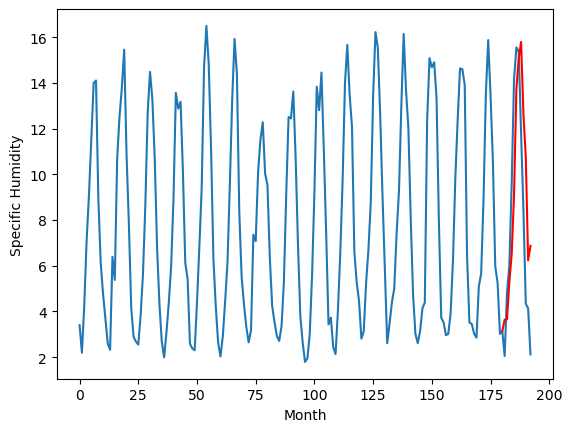

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.75		3.20		-0.55
5.74		3.21		-2.53
5.71		4.85		-0.86
6.46		6.07		-0.39
7.79		8.66		0.87
12.08		13.29		1.21
13.29		14.64		1.35
13.68		15.36		1.68
12.88		12.20		-0.68
9.96		10.31		0.35
5.30		5.80		0.50
7.04		6.43		-0.61
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.79, 3.1984687238931655, 3.210460165143013, 4.851587870717049, 6.071088889241219, 8.660285094380379, 13.292137721180916, 14.642389038205147, 15.36091540157795, 12.195386388897896, 10.30898795425892, 5.795328477025032, 6.4309963375329975]


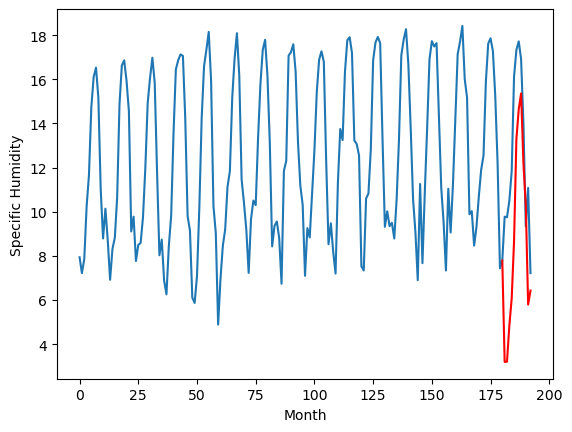

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.83		7.74		-0.09
7.71		7.75		0.04
10.77		9.39		-1.38
11.02		10.61		-0.41
14.46		13.20		-1.26
18.70		17.83		-0.87
20.35		19.18		-1.17
20.36		19.90		-0.46
17.42		16.74		-0.68
14.64		14.85		0.21
9.20		10.34		1.14
12.15		10.97		-1.18
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.03, 7.738464849591256, 7.750460157692433, 9.391586909592153, 10.611085067093374, 13.20028222590685, 17.832134852707387, 19.18238616973162, 19.900910625755788, 16.735379228889943, 14.848981747925283, 10.335324178040029, 10.970995912849904]


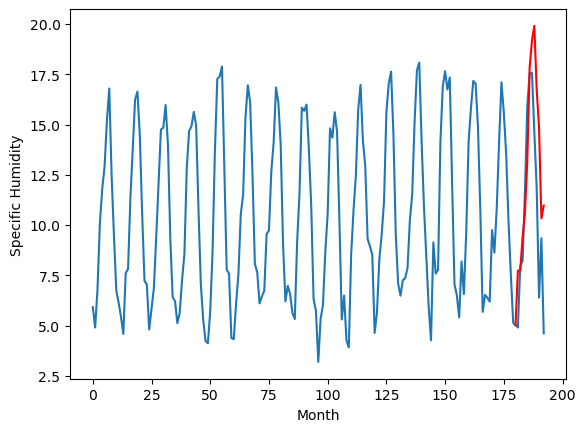

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.81		5.72		-0.09
5.49		5.73		0.24
8.15		7.37		-0.78
9.44		8.59		-0.85
13.44		11.18		-2.26
17.13		15.81		-1.32
17.70		17.16		-0.54
18.09		17.88		-0.21
14.08		14.72		0.64
11.23		12.83		1.60
7.61		8.32		0.71
9.47		8.95		-0.52
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.41, 5.718471629619598, 5.730463070869446, 7.371590776443481, 8.591093821525574, 11.180298609733581, 15.812151236534119, 17.162398738861086, 17.880924148559572, 14.715397043228151, 12.82899956226349, 8.315341515541078, 8.951001627445223]


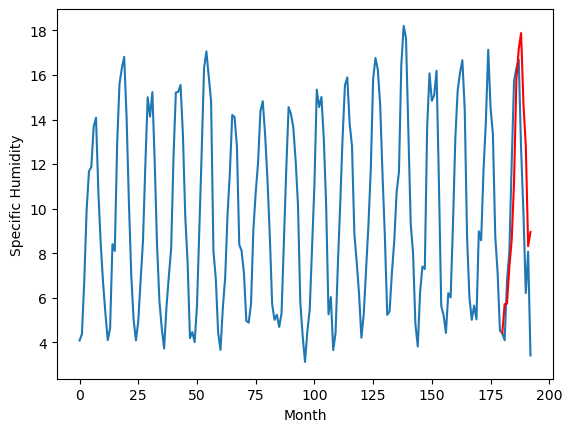

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.04		3.88		-0.16
3.59		3.89		0.30
6.17		5.53		-0.64
7.53		6.75		-0.78
11.82		9.34		-2.48
15.70		13.97		-1.73
16.08		15.32		-0.76
16.19		16.04		-0.15
12.29		12.88		0.59
9.56		10.99		1.43
5.95		6.48		0.53
7.36		7.11		-0.25
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.29, 3.878472583293915, 3.89046015676111, 5.531590723358095, 6.751092814765871, 9.340295695625246, 13.972148322425783, 15.322397732101381, 16.040924095474182, 12.875397943817077, 10.988999986015259, 6.475341462455688, 7.111000620685516]


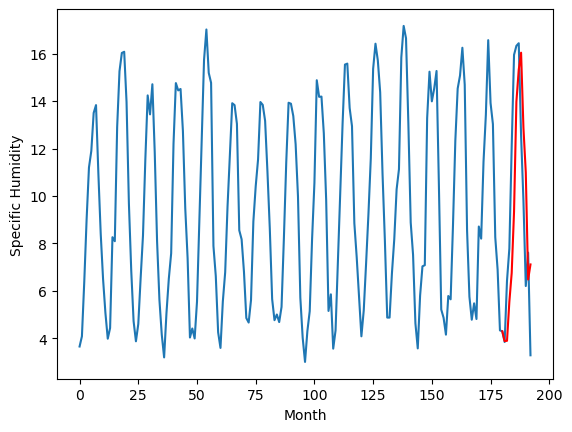

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.35		3.45		-0.90
3.71		3.46		-0.25
5.20		5.10		-0.10
6.16		6.32		0.16
10.71		8.91		-1.80
13.01		13.54		0.53
14.04		14.89		0.85
13.76		15.61		1.85
10.51		12.45		1.94
7.46		10.56		3.10
5.74		6.05		0.31
4.89		6.68		1.79
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.47, 3.4484725832939147, 3.4604601567611097, 5.101590723358095, 6.321093768440187, 8.91030260976404, 13.54215714391321, 14.892403692565859, 15.610929102264345, 12.44540581163019, 10.559009284339846, 6.045350283943117, 6.681003660522402]


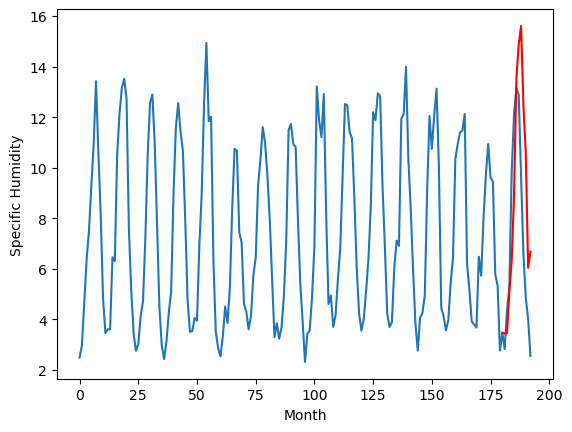

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.37		2.29		-0.08
2.62		2.30		-0.32
4.33		3.94		-0.39
4.74		5.16		0.42
7.72		7.75		0.03
12.41		12.38		-0.03
14.01		13.73		-0.28
14.39		14.45		0.06
10.81		11.29		0.48
8.60		9.40		0.80
2.88		4.89		2.01
4.74		5.52		0.78
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.52, 2.2884648495912554, 2.3004572575539353, 3.9415829365700485, 5.161083001419902, 7.750279206559062, 12.382129926010967, 13.732381243035197, 14.450909573361278, 11.285379607006908, 9.39898117236793, 4.88532264880836, 5.520995337292552]


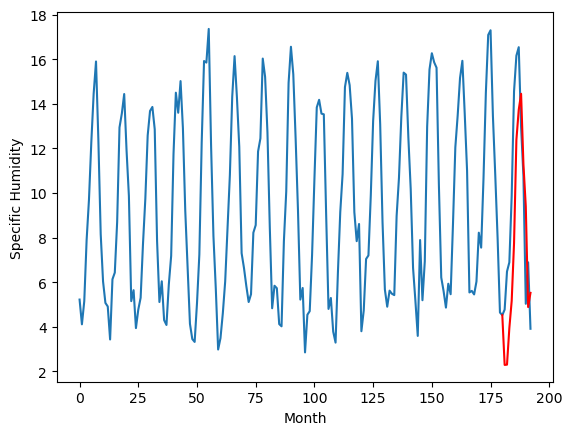

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		5.02		-0.05
4.44		5.03		0.59
6.81		6.67		-0.14
7.73		7.89		0.16
10.89		10.48		-0.41
15.49		15.11		-0.38
16.44		16.46		0.02
16.18		17.18		1.00
12.92		14.02		1.10
10.83		12.13		1.30
6.14		7.62		1.48
7.61		8.25		0.64
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.4, 5.018468723893165, 5.030460165143013, 6.671589778065681, 7.891087935566902, 10.480288909077643, 15.112143443226813, 16.46239285290241, 17.18091730892658, 14.01539020359516, 12.1289927226305, 7.615334199070929, 8.250997231602668]


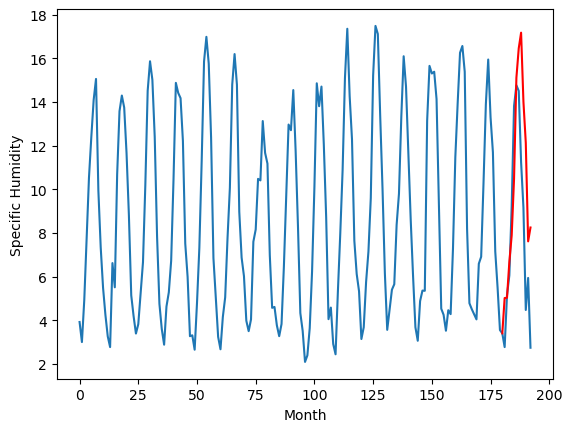

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.57		3.72		0.15
3.00		3.73		0.73
4.94		5.37		0.43
6.27		6.59		0.32
8.56		9.18		0.62
13.62		13.81		0.19
14.88		15.16		0.28
15.02		15.88		0.86
11.54		12.72		1.18
10.39		10.83		0.44
4.62		6.32		1.70
5.33		6.95		1.62
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.82, 3.7184716296195983, 3.730460169799626, 5.371588829047978, 6.59109187413007, 9.180294754989445, 13.81214547444135, 15.162392976768315, 15.880918386466801, 12.715391757972538, 10.828994753845036, 6.315336707122624, 6.950995865352452]


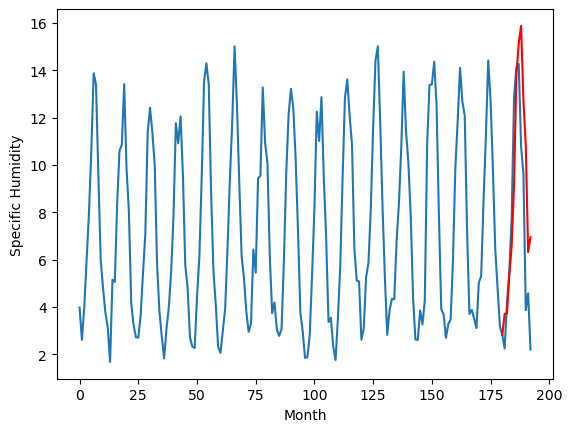

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.66		3.78		0.12
3.02		3.79		0.77
5.39		5.43		0.04
6.70		6.65		-0.05
9.32		9.24		-0.08
14.07		13.87		-0.20
15.47		15.22		-0.25
15.72		15.94		0.22
11.69		12.78		1.09
9.82		10.89		1.07
4.53		6.38		1.85
5.07		7.01		1.94
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.86, 3.7784725832939148, 3.7904611234739423, 5.431591690070928, 6.6510937814787034, 9.240297616012395, 13.872150242812932, 15.222395718581975, 15.940922081954778, 12.775397837646306, 10.889000833518804, 6.375342786796391, 7.0110000376775865]


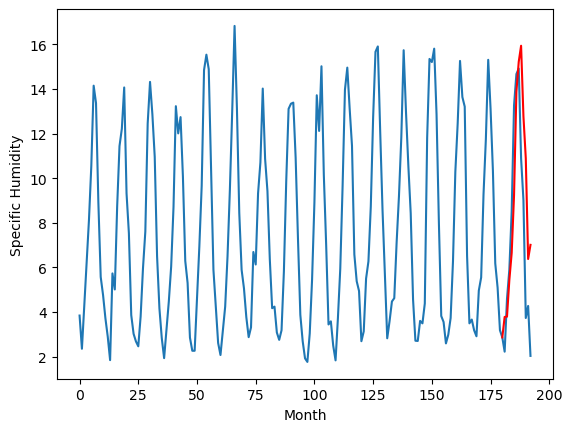

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.46		3.64		0.18
2.89		3.65		0.76
4.18		5.29		1.11
5.85		6.51		0.66
7.45		9.10		1.65
12.46		13.73		1.27
13.73		15.08		1.35
14.60		15.80		1.20
10.84		12.64		1.80
9.83		10.75		0.92
4.59		6.24		1.65
4.55		6.87		2.32
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.61, 3.6384716296195982, 3.6504611374437808, 5.291590750366449, 6.511092841774225, 9.10029858365655, 13.73215311780572, 15.082398593574762, 15.800923049598932, 12.635398328453302, 10.7490013243258, 6.235342323929071, 6.87099862113595]


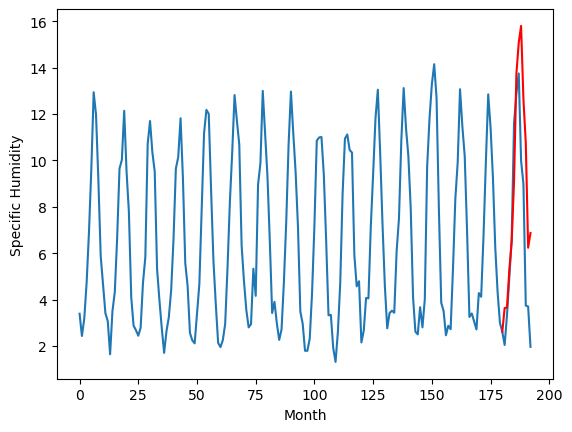

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.96   3.638472
1                 1    3.75   3.198469
2                 2    7.83   7.738465
3                 3    5.81   5.718472
4                 4    4.04   3.878473
5                 5    4.35   3.448473
6                 6    2.37   2.288465
7                 7    5.07   5.018469
8                 8    3.57   3.718472
9                 9    3.66   3.778473
10               10    3.46   3.638472


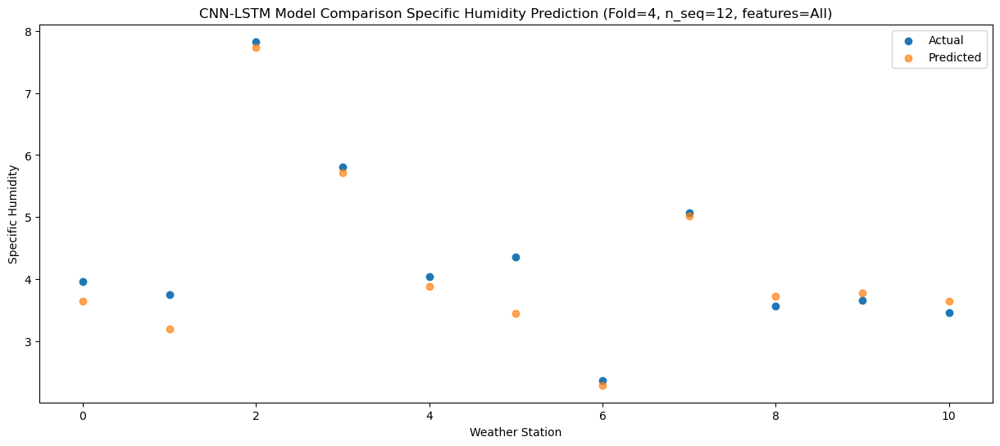

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    2.87   3.650460
1                 1    5.74   3.210460
2                 2    7.71   7.750460
3                 3    5.49   5.730463
4                 4    3.59   3.890460
5                 5    3.71   3.460460
6                 6    2.62   2.300457
7                 7    4.44   5.030460
8                 8    3.00   3.730460
9                 9    3.02   3.790461
10               10    2.89   3.650461


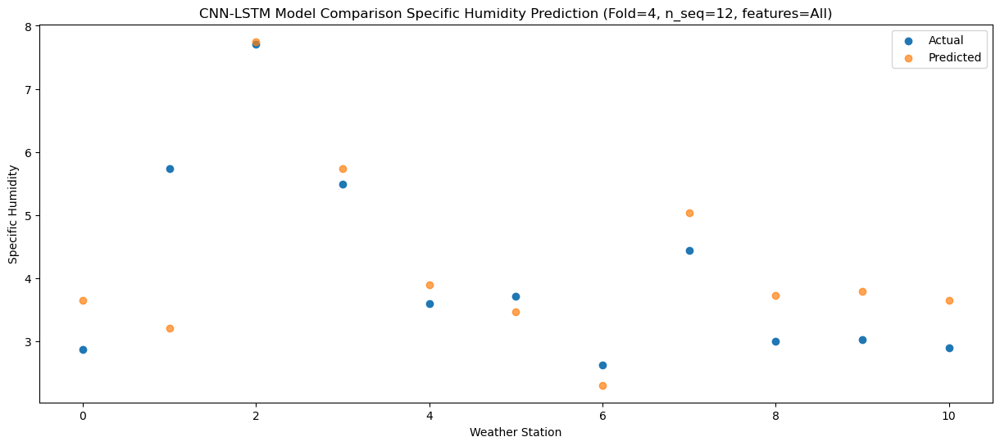

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    5.63   5.291591
1                 1    5.71   4.851588
2                 2   10.77   9.391587
3                 3    8.15   7.371591
4                 4    6.17   5.531591
5                 5    5.20   5.101591
6                 6    4.33   3.941583
7                 7    6.81   6.671590
8                 8    4.94   5.371589
9                 9    5.39   5.431592
10               10    4.18   5.291591


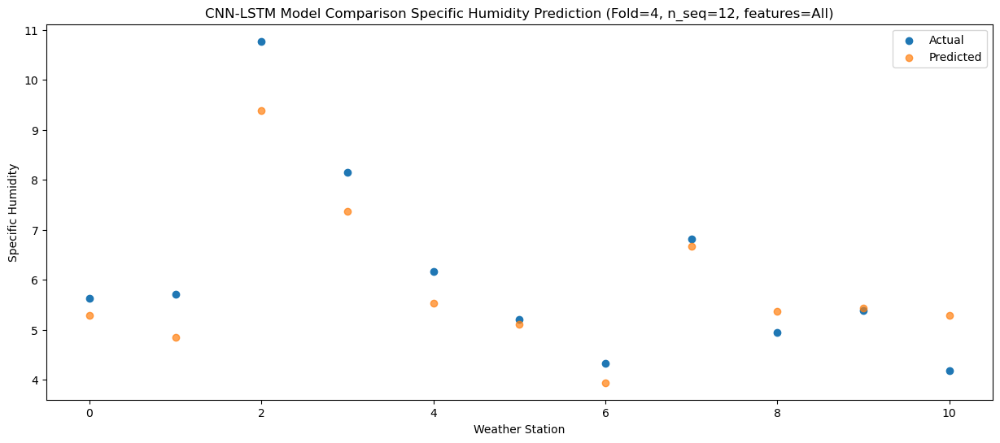

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    6.84   6.511095
1                 1    6.46   6.071089
2                 2   11.02  10.611085
3                 3    9.44   8.591094
4                 4    7.53   6.751093
5                 5    6.16   6.321094
6                 6    4.74   5.161083
7                 7    7.73   7.891088
8                 8    6.27   6.591092
9                 9    6.70   6.651094
10               10    5.85   6.511093


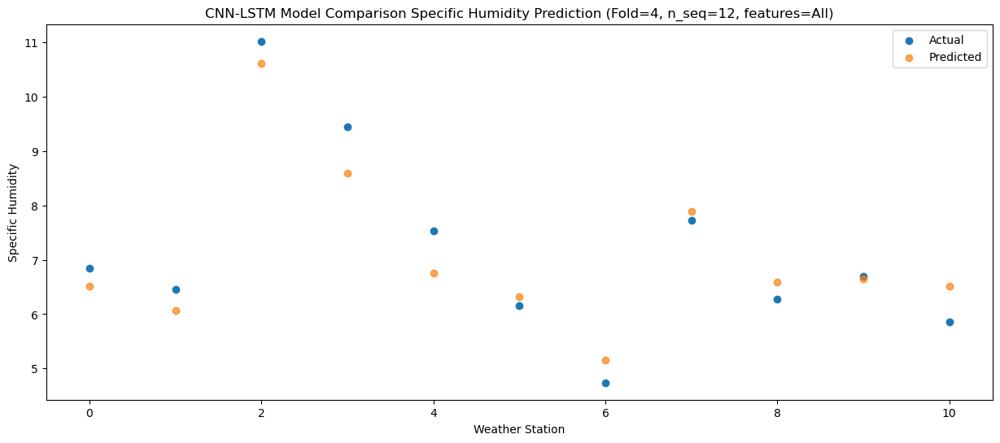

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.40   9.100302
1                 1    7.79   8.660285
2                 2   14.46  13.200282
3                 3   13.44  11.180299
4                 4   11.82   9.340296
5                 5   10.71   8.910303
6                 6    7.72   7.750279
7                 7   10.89  10.480289
8                 8    8.56   9.180295
9                 9    9.32   9.240298
10               10    7.45   9.100299


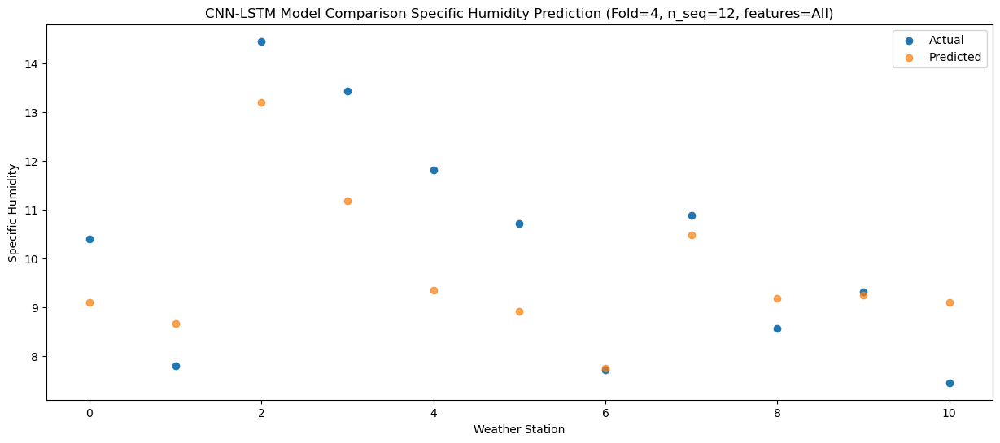

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.99  13.732156
1                 1   12.08  13.292138
2                 2   18.70  17.832135
3                 3   17.13  15.812151
4                 4   15.70  13.972148
5                 5   13.01  13.542157
6                 6   12.41  12.382130
7                 7   15.49  15.112143
8                 8   13.62  13.812145
9                 9   14.07  13.872150
10               10   12.46  13.732153


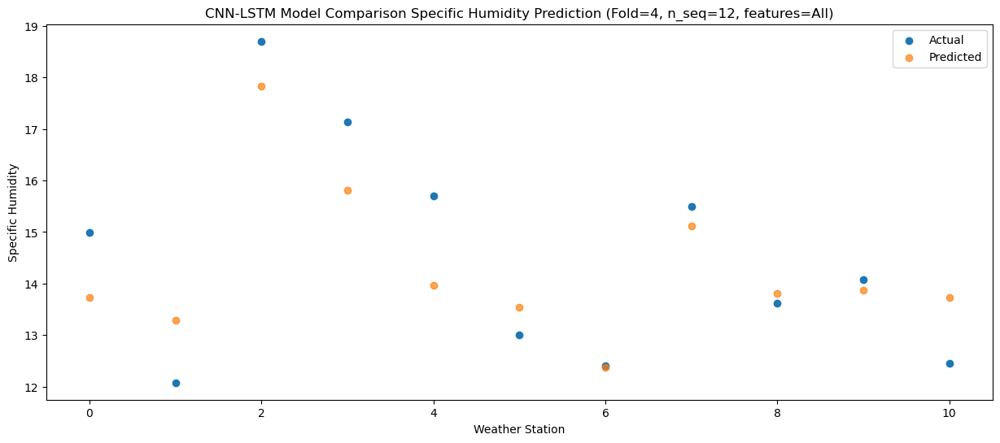

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.38  15.082403
1                 1   13.29  14.642389
2                 2   20.35  19.182386
3                 3   17.70  17.162399
4                 4   16.08  15.322398
5                 5   14.04  14.892404
6                 6   14.01  13.732381
7                 7   16.44  16.462393
8                 8   14.88  15.162393
9                 9   15.47  15.222396
10               10   13.73  15.082399


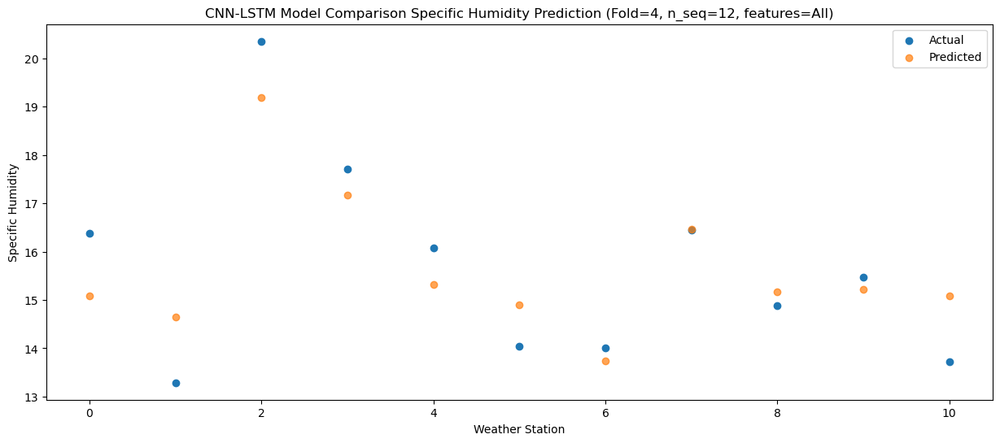

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.20  15.800927
1                 1   13.68  15.360915
2                 2   20.36  19.900911
3                 3   18.09  17.880924
4                 4   16.19  16.040924
5                 5   13.76  15.610929
6                 6   14.39  14.450910
7                 7   16.18  17.180917
8                 8   15.02  15.880918
9                 9   15.72  15.940922
10               10   14.60  15.800923


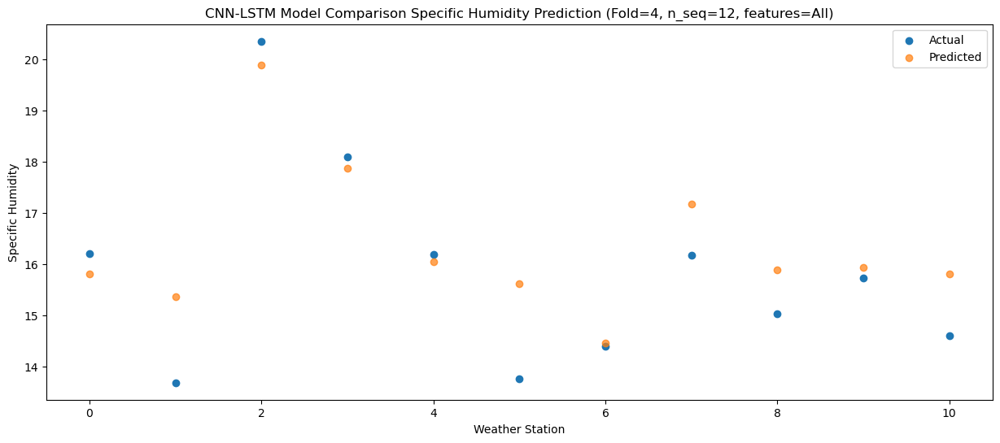

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   12.62  12.635402
1                 1   12.88  12.195386
2                 2   17.42  16.735379
3                 3   14.08  14.715397
4                 4   12.29  12.875398
5                 5   10.51  12.445406
6                 6   10.81  11.285380
7                 7   12.92  14.015390
8                 8   11.54  12.715392
9                 9   11.69  12.775398
10               10   10.84  12.635398


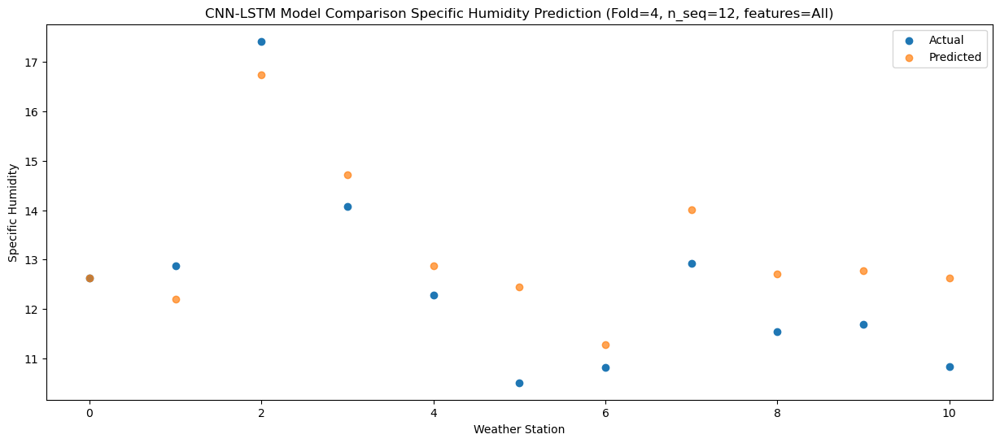

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0    9.25  10.749005
1                 1    9.96  10.308988
2                 2   14.64  14.848982
3                 3   11.23  12.829000
4                 4    9.56  10.989000
5                 5    7.46  10.559009
6                 6    8.60   9.398981
7                 7   10.83  12.128993
8                 8   10.39  10.828995
9                 9    9.82  10.889001
10               10    9.83  10.749001


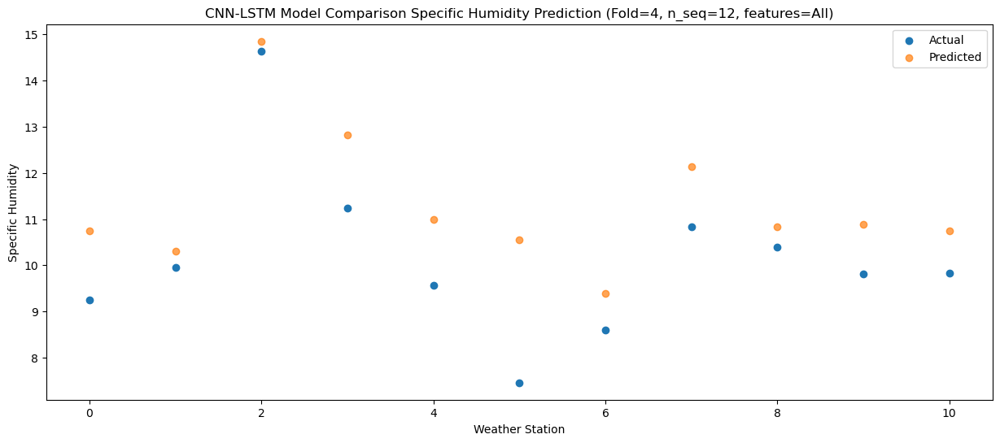

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.16   6.235346
1                 1    5.30   5.795328
2                 2    9.20  10.335324
3                 3    7.61   8.315342
4                 4    5.95   6.475341
5                 5    5.74   6.045350
6                 6    2.88   4.885323
7                 7    6.14   7.615334
8                 8    4.62   6.315337
9                 9    4.53   6.375343
10               10    4.59   6.235342


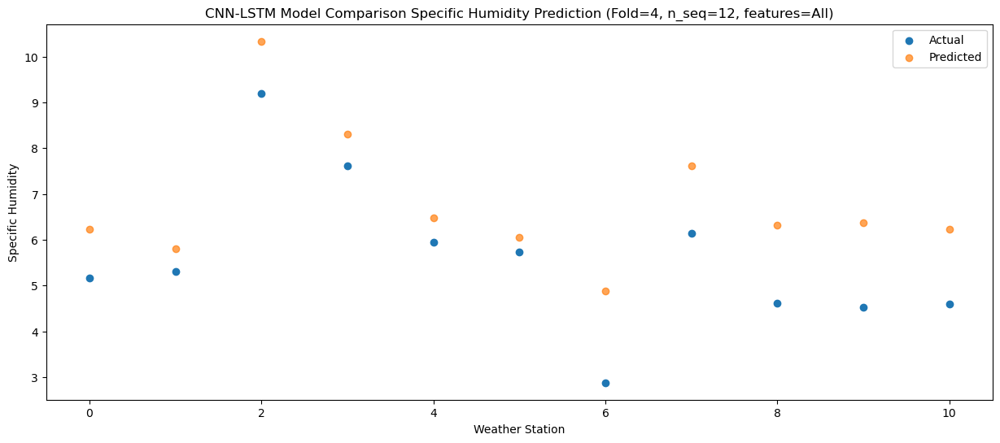

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    4.95   6.871001
1                 1    7.04   6.430996
2                 2   12.15  10.970996
3                 3    9.47   8.951002
4                 4    7.36   7.111001
5                 5    4.89   6.681004
6                 6    4.74   5.520995
7                 7    7.61   8.250997
8                 8    5.33   6.950996
9                 9    5.07   7.011000
10               10    4.55   6.870999


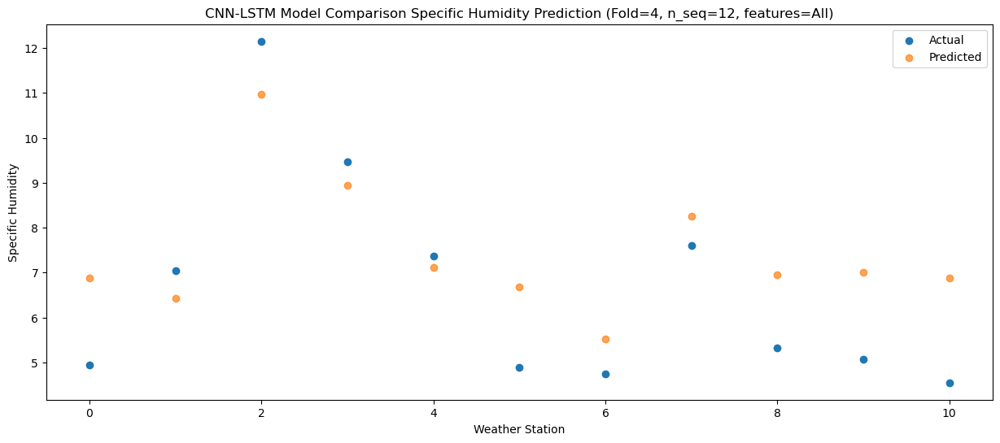

f, t:
[[ 3.96  3.75  7.83  5.81  4.04  4.35  2.37  5.07  3.57  3.66  3.46]
 [ 2.87  5.74  7.71  5.49  3.59  3.71  2.62  4.44  3.    3.02  2.89]
 [ 5.63  5.71 10.77  8.15  6.17  5.2   4.33  6.81  4.94  5.39  4.18]
 [ 6.84  6.46 11.02  9.44  7.53  6.16  4.74  7.73  6.27  6.7   5.85]
 [10.4   7.79 14.46 13.44 11.82 10.71  7.72 10.89  8.56  9.32  7.45]
 [14.99 12.08 18.7  17.13 15.7  13.01 12.41 15.49 13.62 14.07 12.46]
 [16.38 13.29 20.35 17.7  16.08 14.04 14.01 16.44 14.88 15.47 13.73]
 [16.2  13.68 20.36 18.09 16.19 13.76 14.39 16.18 15.02 15.72 14.6 ]
 [12.62 12.88 17.42 14.08 12.29 10.51 10.81 12.92 11.54 11.69 10.84]
 [ 9.25  9.96 14.64 11.23  9.56  7.46  8.6  10.83 10.39  9.82  9.83]
 [ 5.16  5.3   9.2   7.61  5.95  5.74  2.88  6.14  4.62  4.53  4.59]
 [ 4.95  7.04 12.15  9.47  7.36  4.89  4.74  7.61  5.33  5.07  4.55]]
[[ 3.63847163  3.19846872  7.73846485  5.71847163  3.87847258  3.44847258
   2.28846485  5.01846872  3.71847163  3.77847258  3.63847163]
 [ 3.65046017  3.21046017  7

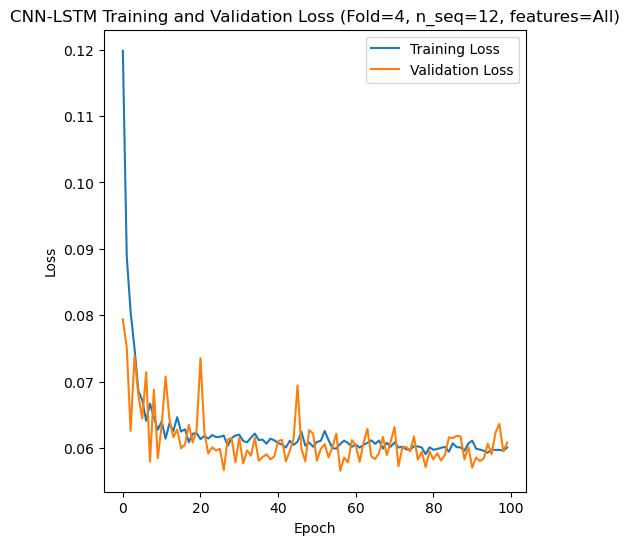

[[1.360711460586865], [0.9507262093620459], [1.070391824087895], [1.7075295307492826], [1.0437497263929605]]
[[array(1.36071146)], [array(0.95072621)], [array(1.07039182)], [array(1.70752953)], [array(1.04374973)]]
[[1.0468074760698907], [0.781551735211916], [0.7836099041057888], [1.4264702064617343], [0.8188062197842046]]
[[0.09760671232609103], [0.10943183460155456], [0.0936434948550091], [0.21491350602532358], [0.11074686560332986]]
[[0.9112386589736363], [0.9567694267966204], [0.941944189692199], [0.8291904393576485], [0.9477733772805736]]
[[array(0.09760671)], [array(0.10943183)], [array(0.09364349)], [array(0.21491351)], [array(0.11074687)]]
[[array(0.96219935)], [array(0.97792179)], [array(0.94562067)], [array(0.94936534)], [array(0.95079712)]]
[ 3.9   3.41  6.58  6.97 10.12 14.93 15.96 16.01 12.59 10.41  5.11  7.89
  5.74  6.45  8.66  8.88 11.37 16.12 16.92 17.08 14.92 11.84  6.18  9.82
  8.41  8.56 10.41 10.65 13.41 18.03 19.94 20.14 17.14 14.42  8.55 10.95
  5.55  5.46  8.91 

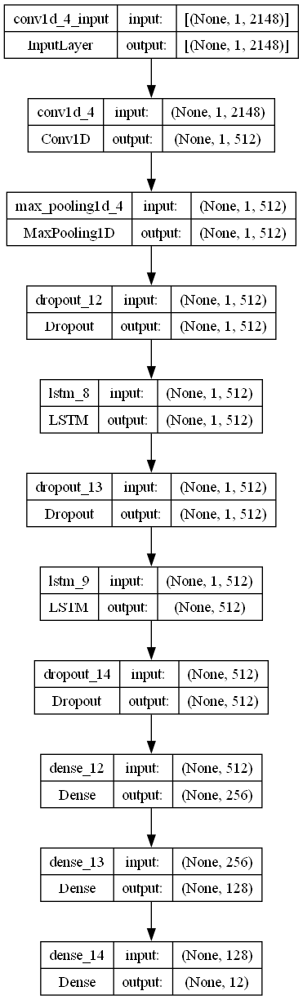

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def kmape (y_true, y_pred):
    return K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def kpearson (y_true, y_pred):
    mean_true = K.mean(y_true)
    mean_pred = K.mean(y_pred)
    return (K.square(K.mean((y_true - mean_true)*(y_pred - mean_pred))))/(K.mean(K.square(y_true - mean_true))*K.mean(K.square(y_pred - mean_pred)))

# fit the best CNN-LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    filters = 512
    lr = 0.0010258156731939997
    optimizer = Adam(learning_rate = lr)
    activation_function = 'tanh'
    lstm_units = 512
    dropout_rate = 0.1196522659519701

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(actual, forecasts, n_lag, n_seq):

    t = np.array(actual).transpose()
    f = np.array(forecasts).transpose()

    print("f, t:")
    print(t)
    print(f)
    rmse_list = []
    mae_list = []
    skmape_list = []
    mape_list = []
    r2_list = []
    pearson_list = []
    actual_list = []

    for i in range(n_seq):
        act = [row for row in t[i]]
        predicted = [forecast for forecast in f[i]]
        rmse1 = sqrt(mean_squared_error(act, predicted))
        rmse2 = np.array(rmse(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        mae = mean_absolute_error(act, predicted)
        mse = mean_squared_error(act, predicted)
        skmape = mean_absolute_percentage_error(act, predicted)
        kmape1 = np.array(kmape(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        kpearson1 = np.array(kpearson(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        r2 = r2_score(act, predicted) 
        avg_actual = np.mean(act)
        print("Year at t+"+str(i+1)+":")
        print('t+%d SKRMSE: %f' % ((i+1), rmse1))
        print('t+%d KRMSE: %f' % ((i+1), rmse2))        
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d SKMAPE: %f' % ((i+1), skmape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))
        print('t+%d KMAPE: %f' % ((i+1), kmape1))
        print('t+%d PEARSON: %f' % ((i+1), kpearson1))
        print('t+%d AVERAGE ACTUAL: %f' % ((i+1), avg_actual))

    y_true = tf.convert_to_tensor(np.array(actual).flatten())
    y_pred = tf.convert_to_tensor(np.array(forecasts).flatten())

    rmse1 = sqrt(mean_squared_error(np.array(y_true), np.array(y_pred)))
    rmse2 = np.array(rmse(y_true, y_pred))
    mae = mean_absolute_error(np.array(y_true), np.array(y_pred))
    mse = mean_squared_error(np.array(y_true), np.array(y_pred))
    skmape = mean_absolute_percentage_error(np.array(y_true), np.array(y_pred))
    kmape1 = np.array(kmape(y_true, y_pred))
    kpearson1 = np.array(kpearson(y_true, y_pred))
    r2 = r2_score(np.array(y_true), np.array(y_pred)) 
    avg_actual = np.mean(np.array(y_true))
    rmse1_list.append(rmse1)
    rmse2_list.append(rmse2)
    mae_list.append(mae)
    skmape_list.append(skmape)
    pearson_list.append(kpearson1)
    mape_list.append(kmape1)
    r2_list.append(r2)
    actual_list.append(avg_actual)
    print("Metrics for this Fold:")
    print('SKRMSE: %f' % (rmse1))
    print('KRMSE: %f' % (rmse2))        
    print('MAE: %f' % (mae))
    print('SKMAPE: %f' % (skmape))
    print('R2_SCORE: %f' % (r2))
    print('KMAPE: %f' % (kmape1))
    print('PEARSON: %f' % (kpearson1))
    print('AVERAGE ACTUAL: %f' % (avg_actual))

    return rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, actual, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse1_avg_list = []
rmse2_avg_list = []
mae_avg_list = []
skmape_avg_list = []
r2_score_avg_list = []
mape_avg_list = []
pearson_avg_list = []
actual_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]
    
    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    print(dataset)

    series = pd.Series(dataset[:, 0]) # Using first column (specific_humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))
    
    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    print(results_df)
    
    print("Actual and Forecasts:")
    print(actual)
    print(forecasts)
    
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        actual_ws = actual[j]
        
        plot_forecasts(series_ws, forecasts_ws, actual_ws, n_test, n_seq, n_lag)

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)

        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    rmse1_list = [] # list stores sklearn's root mean squared errors for each future time prediction
    rmse2_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores mean absolute errors for each future time prediction
    skmape_list = [] # list stores sklearn's mean squared percentage errors for each future time prediction
    r2_list = [] # list stores sklearn's r2 pearson values for each future time prediction
    mape_list = [] # list stores mean squared percentage errors for each future time prediction
    pearson_list = [] # list stores r2 pearson values for each future time prediction
    actual_list = [] # list stores average actual values for each future time prediction

    # evaluate forecasts
    rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse1_avg_list.append(rmse1_list)
    rmse2_avg_list.append(rmse2_list)
    mae_avg_list.append(mae_list)
    skmape_avg_list.append(skmape_list)
    r2_score_avg_list.append(r2_list)
    mape_avg_list.append(mape_list)
    pearson_avg_list.append(pearson_list)
    actual_avg_list.append(actual_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)
            
    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse1_avg_list)
print(rmse2_avg_list)
print(mae_avg_list)
print(skmape_avg_list)
print(r2_score_avg_list)
print(mape_avg_list)
print(pearson_avg_list)
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse1_avg_list)
print("Average SKRMSE:"+str(np.mean(rmse1_avg_list)))
print("Average KRMSE:"+str(np.mean(rmse2_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average SKMAPE:"+str(np.mean(skmape_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average PEARSON:"+str(p1))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))
print("")
print("Average Specific Humidity:"+str(np.mean(actual_avg_list)))
print("RMSE % of Specific Humidity:"+str(np.mean(rmse2_avg_list)/np.mean(actual_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_SH_S12.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)